# IEEE SSCS Code‑a‑Chip VLSI'26 Submission
## 16‑bit Vedic Multiplier MAC with Security Key

**Author:** Kamalesh E  
**License:** Apache 2.0

---
## Abstract
This notebook presents a complete open‑source ASIC design flow for a 16‑bit multiplier‑accumulator (MAC) based on the Vedic mathematics algorithm *Urdhva Tiryagbhyam*. The design includes a hardware security key feature and is implemented using **OpenLane 2** with the **SkyWater 130 nm** PDK.

The notebook covers:
1. **RTL design** and functional simulation with Icarus Verilog.
2. **Visual explanation** of the Vedic multiplication algorithm.
3. **Physical implementation** (synthesis, place & route, layout generation).
4. **Timing analysis**.
5. **DRC/LVS verification**.

All steps are **fully reproducible** in Google Colab or any Linux environment with Nix.

## 1. Environment Setup

In [30]:
# Install system dependencies (Colab only)
import os, sys, subprocess, shutil

if "google.colab" in sys.modules:
    !sudo apt-get update -qq
    !sudo apt-get install -y -qq iverilog python3-tk
    if shutil.which("nix-env") is None:
        !curl -L https://nixos.org/nix/install | bash -s -- --daemon --yes
        !echo "extra-experimental-features = nix-command flakes" >> /etc/nix/nix.conf
        !killall nix-daemon
    os.environ["PATH"] = "/nix/var/nix/profiles/default/bin:" + os.environ["PATH"]
else:
    print("Running locally – ensure Nix is installed.")

print("System dependencies ready.")

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
System dependencies ready.


In [31]:
# Install OpenLane 2 and Sky130 PDK
import IPython.display as display

openlane_version = "version-2.1"
pdk_root = os.path.expanduser("~/.volare")
openlane_ipynb_path = os.path.join(os.getcwd(), "openlane_ipynb")

display.display(display.HTML("<h3>Downloading OpenLane…</h3>"))
!rm -rf {openlane_ipynb_path}
!mkdir -p {openlane_ipynb_path}
!curl -L "https://github.com/efabless/openlane2/tarball/{openlane_version}" | tar -xzC {openlane_ipynb_path} --strip-components 1

display.display(display.HTML("<h3>Installing binary dependencies (Nix)…</h3>"))
try:
    subprocess.run(["nix", "profile", "install", ".#colab-env", "--accept-flake-config"],
                   cwd=openlane_ipynb_path, check=True)
except:
    display.display(display.HTML('<p style="color:red">Nix install failed – retrying…</p>'))
    subprocess.run(["nix", "profile", "install", ".#colab-env", "--accept-flake-config"],
                   cwd=openlane_ipynb_path, check=True)

display.display(display.HTML("<h3>Installing Python dependencies…</h3>"))
subprocess.run(["pip3", "install", "-q", "."], cwd=openlane_ipynb_path, check=True)

display.display(display.HTML("<h3>Downloading Sky130 PDK…</h3>"))
import volare
volare.enable(volare.get_volare_home(pdk_root), "sky130",
              open(os.path.join(openlane_ipynb_path, "openlane", "open_pdks_rev")).read().strip())

sys.path.insert(0, openlane_ipynb_path)
import openlane
print(f"OpenLane {openlane.__version__} installed.")

import logging
logging.getLogger().handlers.clear()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 9492k    0 9492k    0     0   9.7M      0 --:--:-- --:--:-- --:--:-- 21.6M


Version bdc9412b3e468c102d01b7cf6337be06ec6e9c9a enabled for the sky130 PDK.

OpenLane 2.1.11 installed.


## 2. Vedic Algorithm Visualization

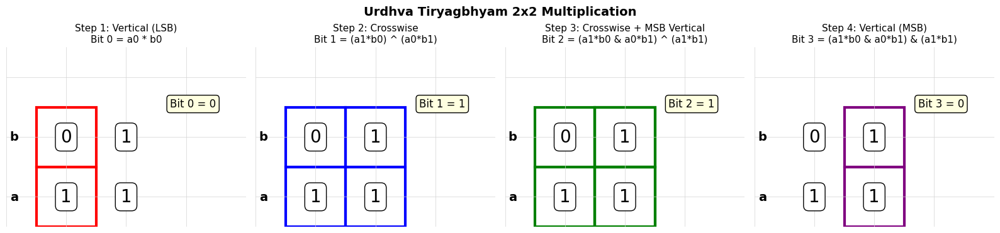

Input: a = 11, b = 10 => Product: 6


In [32]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def draw_vedic_2x2(a1, a0, b1, b0):
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    fig.suptitle("Urdhva Tiryagbhyam 2x2 Multiplication", fontsize=14, fontweight='bold')
    col_a0, col_a1 = 1, 2
    col_b0, col_b1 = 1, 2
    row_a, row_b = 0, 1
    steps = [
        {"title": "Step 1: Vertical (LSB)\nBit 0 = a0 * b0", "highlight": [(col_a0, row_a, 'red'), (col_b0, row_b, 'red')], "bit": 0, "val": a0 & b0},
        {"title": "Step 2: Crosswise\nBit 1 = (a1*b0) ^ (a0*b1)", "highlight": [(col_a1, row_a, 'blue'), (col_b0, row_b, 'blue'), (col_a0, row_a, 'blue'), (col_b1, row_b, 'blue')], "bit": 1, "val": (a1 & b0) ^ (a0 & b1)},
        {"title": "Step 3: Crosswise + MSB Vertical\nBit 2 = (a1*b0 & a0*b1) ^ (a1*b1)", "highlight": [(col_a1, row_a, 'green'), (col_b0, row_b, 'green'), (col_a0, row_a, 'green'), (col_b1, row_b, 'green'), (col_a1, row_a, 'green'), (col_b1, row_b, 'green')], "bit": 2, "val": ((a1 & b0) & (a0 & b1)) ^ (a1 & b1)},
        {"title": "Step 4: Vertical (MSB)\nBit 3 = (a1*b0 & a0*b1) & (a1*b1)", "highlight": [(col_a1, row_a, 'purple'), (col_b1, row_b, 'purple')], "bit": 3, "val": ((a1 & b0) & (a0 & b1)) & (a1 & b1)}
    ]
    for ax, step in zip(axes, steps):
        ax.set_xlim(0, 4); ax.set_ylim(-0.5, 2.5); ax.set_aspect('equal'); ax.axis('off')
        ax.set_title(step["title"], fontsize=11)
        for x in range(5): ax.axvline(x, color='lightgray', lw=0.5)
        for y in range(-1, 3): ax.axhline(y, color='lightgray', lw=0.5)
        ax.text(col_a1, row_a, str(a1), fontsize=20, ha='center', va='center', bbox=dict(boxstyle='round', facecolor='white', edgecolor='black'))
        ax.text(col_a0, row_a, str(a0), fontsize=20, ha='center', va='center', bbox=dict(boxstyle='round', facecolor='white', edgecolor='black'))
        ax.text(col_b1, row_b, str(b1), fontsize=20, ha='center', va='center', bbox=dict(boxstyle='round', facecolor='white', edgecolor='black'))
        ax.text(col_b0, row_b, str(b0), fontsize=20, ha='center', va='center', bbox=dict(boxstyle='round', facecolor='white', edgecolor='black'))
        ax.text(0.2, row_a, "a", fontsize=14, ha='right', va='center', fontweight='bold')
        ax.text(0.2, row_b, "b", fontsize=14, ha='right', va='center', fontweight='bold')
        for (x, y, c) in step["highlight"]:
            ax.add_patch(patches.Rectangle((x-0.5, y-0.5), 1, 1, lw=3, edgecolor=c, facecolor='none'))
        ax.text(3.5, 1.5, f"Bit {step['bit']} = {step['val']}", fontsize=12, ha='right', bbox=dict(boxstyle='round', facecolor='lightyellow'))
    plt.tight_layout()
    plt.show()
    product = (a0 & b0) | (((a1 & b0) ^ (a0 & b1)) << 1) | ((((a1 & b0) & (a0 & b1)) ^ (a1 & b1)) << 2) | ((((a1 & b0) & (a0 & b1)) & (a1 & b1)) << 3)
    print(f"Input: a = {a1}{a0}, b = {b1}{b0} => Product: {product}")

draw_vedic_2x2(1, 1, 1, 0)

## 3. RTL Design & Verification

In [33]:
%%writefile tapeout_vedic_mac_16.v
module vedic_2x2(input [1:0] a, b, output [3:0] out);
    assign out[0] = a[0] & b[0];
    assign out[1] = (a[1] & b[0]) ^ (a[0] & b[1]);
    assign out[2] = ((a[1] & b[0]) & (a[0] & b[1])) ^ (a[1] & b[1]);
    assign out[3] = ((a[1] & b[0]) & (a[0] & b[1])) & (a[1] & b[1]);
endmodule

module vedic_4x4(input [3:0] a, b, output [7:0] out);
    wire [3:0] q0,q1,q2,q3;
    vedic_2x2 m0(a[1:0],b[1:0],q0);
    vedic_2x2 m1(a[3:2],b[1:0],q1);
    vedic_2x2 m2(a[1:0],b[3:2],q2);
    vedic_2x2 m3(a[3:2],b[3:2],q3);
    assign out = q0 + (q1<<2) + (q2<<2) + (q3<<4);
endmodule

module vedic_8x8(input [7:0] a, b, output [15:0] out);
    wire [7:0] q0,q1,q2,q3;
    vedic_4x4 m0(a[3:0],b[3:0],q0);
    vedic_4x4 m1(a[7:4],b[3:0],q1);
    vedic_4x4 m2(a[3:0],b[7:4],q2);
    vedic_4x4 m3(a[7:4],b[7:4],q3);
    assign out = q0 + (q1<<4) + (q2<<4) + (q3<<8);
endmodule

module vedic_16x16(input [15:0] a, b, output [31:0] out);
    wire [15:0] q0,q1,q2,q3;
    vedic_8x8 m0(a[7:0],b[7:0],q0);
    vedic_8x8 m1(a[15:8],b[7:0],q1);
    vedic_8x8 m2(a[7:0],b[15:8],q2);
    vedic_8x8 m3(a[15:8],b[15:8],q3);
    assign out = q0 + (q1<<8) + (q2<<8) + (q3<<16);
endmodule

module tapeout_vedic_mac_16(
    input clk, nrst, enable,
    input [15:0] A, B,
    input [31:0] C,
    input [7:0] security_key,
    output reg [31:0] Z
);
    wire [31:0] mult_raw, secured_res;
    vedic_16x16 mult(A, B, mult_raw);
    assign secured_res = (security_key == 8'h47) ? mult_raw + C : 32'h0;
    always @(posedge clk or negedge nrst)
        if (!nrst) Z <= 0;
        else if (enable) Z <= secured_res;
endmodule

Overwriting tapeout_vedic_mac_16.v


In [34]:
%%writefile tb_vedic_mac_16.v
`timescale 1ns/1ps
module tb;
    reg clk=0, nrst=0, enable=0;
    reg [15:0] A, B;
    reg [31:0] C;
    reg [7:0] security_key;
    wire [31:0] Z;
    tapeout_vedic_mac_16 dut(.*);
    always #5 clk = ~clk;
    integer err=0;
    task check(input [31:0] exp, input [8*30:1] msg);
        begin @(posedge clk); #1;
            if (Z !== exp) begin $display("FAIL %s: got %h, exp %h", msg, Z, exp); err=err+1; end
            else $display("PASS %s: %h", msg, Z);
        end
    endtask
    initial begin
        $dumpfile("tb.vcd"); $dumpvars;
        security_key = 8'h47;
        repeat(2) @(posedge clk); nrst=1; @(posedge clk);
        enable=1; A=5; B=6; C=0; check(30, "5*6+0");
        A=10; B=20; C=100; check(300, "10*20+100");
        A=16'hFFFF; B=16'hFFFF; C=1; check(32'hFFFE0002, "max*max+1");
        security_key = 8'h00; check(0, "Wrong key -> 0");
        security_key = 8'h47; check(32'hFFFE0002, "Key restored");
        enable=0; @(posedge clk); #1;
        if (Z !== 32'hFFFE0002) begin $display("FAIL Enable=0 hold"); err=err+1; end
        else $display("PASS Enable=0 holds value");
        nrst=0; #2;
        if (Z !== 0) begin $display("FAIL Reset"); err=err+1; end
        else $display("PASS Reset works");
        $display("%s", err ? "FAILED" : "ALL TESTS PASSED");
        $finish;
    end
endmodule

Overwriting tb_vedic_mac_16.v


In [35]:
!iverilog -o tb.vvp tapeout_vedic_mac_16.v tb_vedic_mac_16.v && vvp tb.vvp

VCD info: dumpfile tb.vcd opened for output.
PASS                          5*6+0: 0000001e
PASS                      10*20+100: 0000012c
PASS                      max*max+1: fffe0002
PASS                 Wrong key -> 0: 00000000
PASS                   Key restored: fffe0002
PASS Enable=0 holds value
PASS Reset works
ALL TESTS PASSED
tb_vedic_mac_16.v:33: $finish called at 88000 (1ps)


## 4. OpenLane Physical Design Flow

In [36]:
from openlane.config import Config
from openlane.steps import Step
from openlane.state import State
import IPython.display as ipd

Config.interactive(
    "tapeout_vedic_mac_16",
    PDK="sky130A",
    CLOCK_PORT="clk",
    CLOCK_NET="clk",
    CLOCK_PERIOD=10.0,
    PRIMARY_GDSII_STREAMOUT_TOOL="klayout",
)

state = State()

In [37]:
def run_step(step_name, kwargs=None, show=True):
    global state
    step_cls = Step.factory.get(step_name)
    k = {'state_in': state}
    if kwargs: k.update(kwargs)
    step = step_cls(**k)
    step.start()
    state = step.state_out
    if show: ipd.display(step)
    return step

In [38]:
# Synthesis
print("Running Synthesis...")
run_step("Yosys.Synthesis", {'VERILOG_FILES': ["./tapeout_vedic_mac_16.v"]})

Running Synthesis...


──────────────────────────────────────────────────── Synthesis ────────────────────────────────────────────────────

[09:59:38] VERBOSE  Running 'Yosys.Synthesis'…                                                         ]8;id=8494;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=291976;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[09:59:38] VERBOSE  Logging subprocess to ]8;id=725786;file:///content/openlane_run/18-yosys-synthesis/yosys-synthesis.log\openlane_run/]8;;\]8;id=154165;file:///content/openlane_run/18-yosys-synthesis/yosys-synthesis.log\18]8;;\]8;id=725786;file:///content/openlane_run/18-yosys-synthesis/yosys-synthesis.log\-yosys-synthesis/yosys-synthesis.log]8;;\…         ]8;id=362591;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=908441;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

/nix/store/306znyj77fv49kwnkpxmb0j2znqpa8bj-bash-5.2p26/bin/bash: warning: setlocale: LC_ALL: cannot change locale 
(en_US.UTF-8)

/----------------------------------------------------------------------------\

|                                                                            |

|  yosys -- Yosys Open SYnthesis Suite                                       |

|                                                                            |

|  Copyright (C) 2012 - 2020  Claire Xenia Wolf <claire@yosyshq.com>         |

|                                                                            |

|  Permission to use, copy, modify, and/or distribute this software for any  |

|  purpose with or without fee is hereby granted, provided that the above    |

|  copyright notice and this permission notice appear in all copies.         |

|                                                                            |

|  THE SOFTWARE IS PROVIDED "AS IS" AND THE AUTHOR DISCLAIMS ALL WARRANTIES  |

|  WITH REGARD TO THIS SOFTWARE INCLUDING ALL IMPLIED WARRANTIES OF          |

|  MERCHANTABILITY AND FITNESS. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR   |

|  ANY SPECIAL, DIRECT, INDIRECT, OR CONSEQUENTIAL DAMAGES OR ANY DAMAGES    |

|  WHATSOEVER RESULTING FROM LOSS OF USE, DATA OR PROFITS, WHETHER IN AN     |

|  ACTION OF CONTRACT, NEGLIGENCE OR OTHER TORTIOUS ACTION, ARISING OUT OF   |

|  OR IN CONNECTION WITH THE USE OR PERFORMANCE OF THIS SOFTWARE.            |

|                                                                            |

\----------------------------------------------------------------------------/

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Loaded SDC plugin

[TCL: yosys -import] Command name collision: found pre-existing command `cd' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `eval' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `exec' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `read' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `trace' -> skip.

1. Executing Liberty frontend: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib

Imported 428 cell types from liberty file.

2. Executing Verilog-2005 frontend: ./tapeout_vedic_mac_16.v

Parsing SystemVerilog input from `./tapeout_vedic_mac_16.v' to AST representation.

Generating RTLIL representation for module `\vedic_2x2'.

Generating RTLIL representation for module `\vedic_4x4'.

Generating RTLIL representation for module `\vedic_8x8'.

Generating RTLIL representation for module `\vedic_16x16'.

Generating RTLIL representation for module `\tapeout_vedic_mac_16'.

Successfully finished Verilog frontend.

3. Executing HIERARCHY pass (managing design hierarchy).

3.1. Analyzing design hierarchy..

Top module:  \tapeout_vedic_mac_16

Used module:     \vedic_16x16

Used module:         \vedic_8x8

Used module:             \vedic_4x4

Used module:                 \vedic_2x2

3.2. Analyzing design hierarchy..

Top module:  \tapeout_vedic_mac_16

Used module:     \vedic_16x16

Used module:         \vedic_8x8

Used module:             \vedic_4x4

Used module:                 \vedic_2x2

Removed 0 unused modules.

Mapping positional arguments of cell tapeout_vedic_mac_16.mult (vedic_16x16).

Mapping positional arguments of cell vedic_16x16.m3 (vedic_8x8).

Mapping positional arguments of cell vedic_16x16.m2 (vedic_8x8).

Mapping positional arguments of cell vedic_16x16.m1 (vedic_8x8).

Mapping positional arguments of cell vedic_16x16.m0 (vedic_8x8).

Mapping positional arguments of cell vedic_8x8.m3 (vedic_4x4).

Mapping positional arguments of cell vedic_8x8.m2 (vedic_4x4).

Mapping positional arguments of cell vedic_8x8.m1 (vedic_4x4).

Mapping positional arguments of cell vedic_8x8.m0 (vedic_4x4).

Mapping positional arguments of cell vedic_4x4.m3 (vedic_2x2).

Mapping positional arguments of cell vedic_4x4.m2 (vedic_2x2).

Mapping positional arguments of cell vedic_4x4.m1 (vedic_2x2).

Mapping positional arguments of cell vedic_4x4.m0 (vedic_2x2).

Renaming module tapeout_vedic_mac_16 to tapeout_vedic_mac_16.

4. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/18-yosys-synthesis/hierarchy.dot'.

Dumping module tapeout_vedic_mac_16 to page 1.

5. Executing TRIBUF pass.

6. Executing HIERARCHY pass (managing design hierarchy).

6.1. Analyzing design hierarchy..

Top module:  \tapeout_vedic_mac_16

Used module:     \vedic_16x16

Used module:         \vedic_8x8

Used module:             \vedic_4x4

Used module:                 \vedic_2x2

6.2. Analyzing design hierarchy..

Top module:  \tapeout_vedic_mac_16

Used module:     \vedic_16x16

Used module:         \vedic_8x8

Used module:             \vedic_4x4

Used module:                 \vedic_2x2

Removed 0 unused modules.

7. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Cleaned up 0 empty switches.

8. Executing PROC_RMDEAD pass (remove dead branches from decision trees).

Marked 1 switch rules as full_case in process $proc$./tapeout_vedic_mac_16.v:45$36 in module tapeout_vedic_mac_16.

Removed a total of 0 dead cases.

9. Executing PROC_PRUNE pass (remove redundant assignments in processes).

Removed 0 redundant assignments.

Promoted 0 assignments to connections.

10. Executing PROC_INIT pass (extract init attributes).

11. Executing PROC_ARST pass (detect async resets in processes).

Found async reset \nrst in `\tapeout_vedic_mac_16.$proc$./tapeout_vedic_mac_16.v:45$36'.

12. Executing PROC_ROM pass (convert switches to ROMs).

Converted 0 switches.

<suppressed ~1 debug messages>

13. Executing PROC_MUX pass (convert decision trees to multiplexers).

Creating decoders for process `\tapeout_vedic_mac_16.$proc$./tapeout_vedic_mac_16.v:45$36'.

1/1: $0\Z[31:0]

14. Executing PROC_DLATCH pass (convert process syncs to latches).

15. Executing PROC_DFF pass (convert process syncs to FFs).

Creating register for signal `\tapeout_vedic_mac_16.\Z' using process                                              
`\tapeout_vedic_mac_16.$proc$./tapeout_vedic_mac_16.v:45$36'.

created $adff cell `$procdff$40' with positive edge clock and negative level reset.

16. Executing PROC_MEMWR pass (convert process memory writes to cells).

17. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Found and cleaned up 1 empty switch in `\tapeout_vedic_mac_16.$proc$./tapeout_vedic_mac_16.v:45$36'.

Removing empty process `tapeout_vedic_mac_16.$proc$./tapeout_vedic_mac_16.v:45$36'.

Cleaned up 1 empty switch.

18. Executing CHECK pass (checking for obvious problems).

Checking module tapeout_vedic_mac_16...

Checking module vedic_16x16...

Checking module vedic_8x8...

Checking module vedic_4x4...

Checking module vedic_2x2...

Found and reported 0 problems.

19. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

Optimizing module vedic_16x16.

<suppressed ~3 debug messages>

Optimizing module vedic_8x8.

<suppressed ~3 debug messages>

Optimizing module vedic_4x4.

<suppressed ~3 debug messages>

Optimizing module vedic_2x2.

20. Executing FLATTEN pass (flatten design).

Deleting now unused module vedic_16x16.

Deleting now unused module vedic_8x8.

Deleting now unused module vedic_4x4.

Deleting now unused module vedic_2x2.

<suppressed ~13 debug messages>

21. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

22. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 1 unused cells and 344 unused wires.

<suppressed ~2 debug messages>

23. Executing OPT pass (performing simple optimizations).

23.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

23.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

<suppressed ~1152 debug messages>

Removed a total of 384 cells.

23.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~1 debug messages>

23.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

23.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

23.6. Executing OPT_DFF pass (perform DFF optimizations).

23.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 0 unused cells and 384 unused wires.

<suppressed ~1 debug messages>

23.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

23.9. Rerunning OPT passes. (Maybe there is more to do..)

23.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~1 debug messages>

23.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

23.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

23.13. Executing OPT_DFF pass (perform DFF optimizations).

23.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

23.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

23.16. Finished OPT passes. (There is nothing left to do.)

24. Executing FSM pass (extract and optimize FSM).

24.1. Executing FSM_DETECT pass (finding FSMs in design).

24.2. Executing FSM_EXTRACT pass (extracting FSM from design).

24.3. Executing FSM_OPT pass (simple optimizations of FSMs).

24.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

24.5. Executing FSM_OPT pass (simple optimizations of FSMs).

24.6. Executing FSM_RECODE pass (re-assigning FSM state encoding).

24.7. Executing FSM_INFO pass (dumping all available information on FSM cells).

24.8. Executing FSM_MAP pass (mapping FSMs to basic logic).

25. Executing OPT pass (performing simple optimizations).

25.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

25.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

25.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~1 debug messages>

25.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

25.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

25.6. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $procdff$40 ($adff) from module tapeout_vedic_mac_16 (D = \secured_res, Q = \Z).

25.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 1 unused cells and 1 unused wires.

<suppressed ~2 debug messages>

25.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

25.9. Rerunning OPT passes. (Maybe there is more to do..)

25.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~1 debug messages>

25.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

25.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

25.13. Executing OPT_DFF pass (perform DFF optimizations).

25.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

25.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

25.16. Finished OPT passes. (There is nothing left to do.)

26. Executing WREDUCE pass (reducing word size of cells).

Removed top 1 bits (of 8) from port B of cell tapeout_vedic_mac_16.$eq$./tapeout_vedic_mac_16.v:44$33 ($eq).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port A of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port A of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port A of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

Removed top 3 bits (of 16) from port A of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 4 bits (of 16) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 16) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

Removed top 2 bits (of 8) from port B of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 1 bits (of 8) from port Y of cell                                                                      
tapeout_vedic_mac_16.$flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

Removed top 8 bits (of 32) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.$add$./tapeout_vedic_mac_16.v:32$30 ($add).

Removed top 8 bits (of 32) from port B of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.$add$./tapeout_vedic_mac_16.v:32$28 ($add).

Removed top 7 bits (of 32) from port Y of cell                                                                     
tapeout_vedic_mac_16.$flatten\mult.$add$./tapeout_vedic_mac_16.v:32$28 ($add).

Removed top 7 bits (of 32) from wire tapeout_vedic_mac_16.$flatten\mult.$add$./tapeout_vedic_mac_16.v:32$28_Y.

Removed top 11 bits (of 32) from wire tapeout_vedic_mac_16.$flatten\mult.$add$./tapeout_vedic_mac_16.v:32$30_Y.

Removed top 3 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$22_Y.

Removed top 2 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$24_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$16_Y.

Removed top 3 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$18_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$16_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$18_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$16_Y.

Removed top 3 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$18_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$16_Y.

Removed top 3 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$18_Y.

Removed top 3 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$22_Y.

Removed top 2 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$24_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$16_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$16_Y.

Removed top 3 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$22_Y.

Removed top 2 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$24_Y.

Removed top 3 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$22_Y.

Removed top 2 bits (of 16) from wire tapeout_vedic_mac_16.$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$24_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$16_Y.

Removed top 1 bits (of 8) from wire                                                                                
tapeout_vedic_mac_16.$flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$16_Y.

27. Executing PEEPOPT pass (run peephole optimizers).

28. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 0 unused cells and 22 unused wires.

<suppressed ~1 debug messages>

29. Executing ALUMACC pass (create $alu and $macc cells).

Extracting $alu and $macc cells in module tapeout_vedic_mac_16:

creating $macc model for $add$./tapeout_vedic_mac_16.v:44$34 ($add).

creating $macc model for $flatten\mult.$add$./tapeout_vedic_mac_16.v:32$28 ($add).

creating $macc model for $flatten\mult.$add$./tapeout_vedic_mac_16.v:32$30 ($add).

creating $macc model for $flatten\mult.$add$./tapeout_vedic_mac_16.v:32$32 ($add).

creating $macc model for $flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

creating $macc model for $flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

creating $macc model for $flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$26 ($add).

creating $macc model for $flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

creating $macc model for $flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

creating $macc model for $flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$26 ($add).

creating $macc model for $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

creating $macc model for $flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

creating $macc model for $flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$26 ($add).

creating $macc model for $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$22 ($add).

creating $macc model for $flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$24 ($add).

creating $macc model for $flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$26 ($add).

creating $macc model for $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

creating $macc model for $flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$16 ($add).

creating $macc model for $flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$18 ($add).

creating $macc model for $flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$20 ($add).

merging $macc model for $flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$22 into                                 
$flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$24.

merging $macc model for $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$22 into                                 
$flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$24.

merging $macc model for $flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$22 into                                 
$flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$24.

merging $macc model for $flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$18 into                             
$flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$20.

merging $macc model for $flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$22 into                                 
$flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$24.

merging $macc model for $flatten\mult.$add$./tapeout_vedic_mac_16.v:32$30 into                                     
$flatten\mult.$add$./tapeout_vedic_mac_16.v:32$32.

merging $macc model for $flatten\mult.$add$./tapeout_vedic_mac_16.v:32$32 into $add$./tapeout_vedic_mac_16.v:44$34.

creating $alu model for $macc $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$26.

creating $alu model for $macc $flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$26.

creating $alu model for $macc $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$26.

creating $alu model for $macc $flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$26.

creating $alu model for $macc $flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$16.

creating $alu model for $macc $flatten\mult.$add$./tapeout_vedic_mac_16.v:32$28.

creating $macc cell for $flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$24: $auto$alumacc.cc:365:replace_macc$64

creating $macc cell for $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$65

creating $macc cell for $flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$66

creating $macc cell for $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$67

creating $macc cell for $flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$68

creating $macc cell for $flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$69

creating $macc cell for $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$70

creating $macc cell for $flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$24: $auto$alumacc.cc:365:replace_macc$71

creating $macc cell for $flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$72

creating $macc cell for $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$73

creating $macc cell for $flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$74

creating $macc cell for $flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$75

creating $macc cell for $flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$76

creating $macc cell for $flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$24: $auto$alumacc.cc:365:replace_macc$77

creating $macc cell for $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$78

creating $macc cell for $flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$24: $auto$alumacc.cc:365:replace_macc$79

creating $macc cell for $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$80

creating $macc cell for $flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$81

creating $macc cell for $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$82

creating $macc cell for $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$20:                                 
$auto$alumacc.cc:365:replace_macc$83

creating $macc cell for $add$./tapeout_vedic_mac_16.v:44$34: $auto$alumacc.cc:365:replace_macc$84

creating $alu cell for $flatten\mult.$add$./tapeout_vedic_mac_16.v:32$28: $auto$alumacc.cc:485:replace_alu$85

creating $alu cell for $flatten\mult.\m3.\m3.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$88

creating $alu cell for $flatten\mult.\m0.$add$./tapeout_vedic_mac_16.v:23$26: $auto$alumacc.cc:485:replace_alu$91

creating $alu cell for $flatten\mult.\m0.\m0.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$94

creating $alu cell for $flatten\mult.\m0.\m1.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$97

creating $alu cell for $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$100

creating $alu cell for $flatten\mult.\m0.\m2.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$103

creating $alu cell for $flatten\mult.\m3.\m2.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$106

creating $alu cell for $flatten\mult.\m0.\m3.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$109

creating $alu cell for $flatten\mult.\m1.$add$./tapeout_vedic_mac_16.v:23$26: $auto$alumacc.cc:485:replace_alu$112

creating $alu cell for $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$115

creating $alu cell for $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$118

creating $alu cell for $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$121

creating $alu cell for $flatten\mult.\m1.\m2.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$124

creating $alu cell for $flatten\mult.\m1.\m3.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$127

creating $alu cell for $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$130

creating $alu cell for $flatten\mult.\m3.$add$./tapeout_vedic_mac_16.v:23$26: $auto$alumacc.cc:485:replace_alu$133

creating $alu cell for $flatten\mult.\m2.$add$./tapeout_vedic_mac_16.v:23$26: $auto$alumacc.cc:485:replace_alu$136

creating $alu cell for $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$139

creating $alu cell for $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$142

creating $alu cell for $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$16:                                  
$auto$alumacc.cc:485:replace_alu$145

created 21 $alu and 21 $macc cells.

30. Executing SHARE pass (SAT-based resource sharing).

31. Executing OPT pass (performing simple optimizations).

31.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

31.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

31.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~1 debug messages>

31.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

31.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

31.6. Executing OPT_DFF pass (perform DFF optimizations).

31.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 22 unused cells and 23 unused wires.

<suppressed ~25 debug messages>

31.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

31.9. Rerunning OPT passes. (Maybe there is more to do..)

31.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~1 debug messages>

31.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

31.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

31.13. Executing OPT_DFF pass (perform DFF optimizations).

31.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

31.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

31.16. Finished OPT passes. (There is nothing left to do.)

32. Executing MEMORY pass.

32.1. Executing OPT_MEM pass (optimize memories).

Performed a total of 0 transformations.

32.2. Executing OPT_MEM_PRIORITY pass (removing unnecessary memory write priority relations).

Performed a total of 0 transformations.

32.3. Executing OPT_MEM_FEEDBACK pass (finding memory read-to-write feedback paths).

32.4. Executing MEMORY_BMUX2ROM pass (converting muxes to ROMs).

32.5. Executing MEMORY_DFF pass (merging $dff cells to $memrd).

32.6. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

32.7. Executing MEMORY_SHARE pass (consolidating $memrd/$memwr cells).

32.8. Executing OPT_MEM_WIDEN pass (optimize memories where all ports are wide).

Performed a total of 0 transformations.

32.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

32.10. Executing MEMORY_COLLECT pass (generating $mem cells).

33. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

34. Executing OPT pass (performing simple optimizations).

34.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

<suppressed ~21 debug messages>

34.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

34.3. Executing OPT_DFF pass (perform DFF optimizations).

34.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

34.5. Finished fast OPT passes.

35. Executing MEMORY_MAP pass (converting memories to logic and flip-flops).

36. Executing OPT pass (performing simple optimizations).

36.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

36.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

36.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~1 debug messages>

36.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

36.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

36.6. Executing OPT_SHARE pass.

36.7. Executing OPT_DFF pass (perform DFF optimizations).

36.8. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

36.9. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

36.10. Finished OPT passes. (There is nothing left to do.)

37. Executing TECHMAP pass (map to technology primitives).

37.1. Executing Verilog-2005 frontend:                                                                             
/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v

Parsing Verilog input from `/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v' to AST 
representation.

Generating RTLIL representation for module `\_90_simplemap_bool_ops'.

Generating RTLIL representation for module `\_90_simplemap_reduce_ops'.

Generating RTLIL representation for module `\_90_simplemap_logic_ops'.

Generating RTLIL representation for module `\_90_simplemap_compare_ops'.

Generating RTLIL representation for module `\_90_simplemap_various'.

Generating RTLIL representation for module `\_90_simplemap_registers'.

Generating RTLIL representation for module `\_90_shift_ops_shr_shl_sshl_sshr'.

Generating RTLIL representation for module `\_90_shift_shiftx'.

Generating RTLIL representation for module `\_90_fa'.

Generating RTLIL representation for module `\_90_lcu'.

Generating RTLIL representation for module `\_90_alu'.

Generating RTLIL representation for module `\_90_macc'.

Generating RTLIL representation for module `\_90_alumacc'.

Generating RTLIL representation for module `\$__div_mod_u'.

Generating RTLIL representation for module `\$__div_mod_trunc'.

Generating RTLIL representation for module `\_90_div'.

Generating RTLIL representation for module `\_90_mod'.

Generating RTLIL representation for module `\$__div_mod_floor'.

Generating RTLIL representation for module `\_90_divfloor'.

Generating RTLIL representation for module `\_90_modfloor'.

Generating RTLIL representation for module `\_90_pow'.

Generating RTLIL representation for module `\_90_pmux'.

Generating RTLIL representation for module `\_90_demux'.

Generating RTLIL representation for module `\_90_lut'.

Successfully finished Verilog frontend.

37.2. Continuing TECHMAP pass.

Using extmapper simplemap for cells of type $eq.

Using template $paramod$a1bc51c02ce12ac21eb18988e83292af48ed7d72\_90_alu for cells of type $alu.

Using template $paramod$0670e2b5f39a952ee2dd39072443556343a2df97\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $mux.

Using extmapper maccmap for cells of type $macc.

add \mult.m1.q0 (8 bits, unsigned)

add { \mult.m1.m2.out 4'0000 } (12 bits, unsigned)

add { \mult.m1.m1.out 4'0000 } (12 bits, unsigned)

Using extmapper simplemap for cells of type $adffe.

Using extmapper simplemap for cells of type $and.

add { $flatten\mult.\m2.\m0.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m2.m0.q0 [1:0] } (7 bits, unsigned)

add { \mult.m2.m0.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m2.m0.m2.out 2'00 } (6 bits, unsigned)

Using extmapper simplemap for cells of type $xor.

add { $auto$wreduce.cc:461:run$42 [24:8] \mult.m0.out [7:0] } (25 bits, unsigned)

add \C (32 bits, unsigned)

add { \mult.m3.out 16'0000000000000000 } (32 bits, unsigned)

add { \mult.m2.out 8'00000000 } (24 bits, unsigned)

Using template $paramod$0ae6dcbc606d0267ec97d3ccf20343286af3366c\_90_alu for cells of type $alu.

add { $auto$wreduce.cc:461:run$57 [6:2] \mult.m1.m3.q0 [1:0] } (7 bits, unsigned)

add { \mult.m1.m3.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m1.m3.m2.out 2'00 } (6 bits, unsigned)

add \mult.m3.q0 (8 bits, unsigned)

add { \mult.m3.m2.out 4'0000 } (12 bits, unsigned)

add { \mult.m3.m1.out 4'0000 } (12 bits, unsigned)

add { $flatten\mult.\m2.\m1.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m2.m1.q0 [1:0] } (7 bits, unsigned)

add { \mult.m2.m1.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m2.m1.m2.out 2'00 } (6 bits, unsigned)

add { $auto$wreduce.cc:461:run$48 [6:2] \mult.m0.m1.q0 [1:0] } (7 bits, unsigned)

add { \mult.m0.m1.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m0.m1.m2.out 2'00 } (6 bits, unsigned)

add \mult.m0.q0 (8 bits, unsigned)

add { \mult.m0.m2.out 4'0000 } (12 bits, unsigned)

add { \mult.m0.m1.out 4'0000 } (12 bits, unsigned)

add { $flatten\mult.\m3.\m0.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m3.m0.q0 [1:0] } (7 bits, unsigned)

add { \mult.m3.m0.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m3.m0.m2.out 2'00 } (6 bits, unsigned)

add \mult.m2.q0 (8 bits, unsigned)

add { \mult.m2.m2.out 4'0000 } (12 bits, unsigned)

add { \mult.m2.m1.out 4'0000 } (12 bits, unsigned)

add { $auto$wreduce.cc:461:run$52 [6:2] \mult.m0.m3.q0 [1:0] } (7 bits, unsigned)

add { \mult.m0.m3.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m0.m3.m2.out 2'00 } (6 bits, unsigned)

add { $flatten\mult.\m2.\m3.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m2.m3.q0 [1:0] } (7 bits, unsigned)

add { \mult.m2.m3.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m2.m3.m2.out 2'00 } (6 bits, unsigned)

add { $auto$wreduce.cc:461:run$56 [6:2] \mult.m1.m2.q0 [1:0] } (7 bits, unsigned)

add { \mult.m1.m2.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m1.m2.m2.out 2'00 } (6 bits, unsigned)

add { $auto$wreduce.cc:461:run$63 [6:2] \mult.m3.m3.q0 [1:0] } (7 bits, unsigned)

add { \mult.m3.m3.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m3.m3.m2.out 2'00 } (6 bits, unsigned)

add { $auto$wreduce.cc:461:run$46 [6:2] \mult.m0.m0.q0 [1:0] } (7 bits, unsigned)

add { \mult.m0.m0.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m0.m0.m2.out 2'00 } (6 bits, unsigned)

add { $auto$wreduce.cc:461:run$50 [6:2] \mult.m0.m2.q0 [1:0] } (7 bits, unsigned)

add { \mult.m0.m2.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m0.m2.m2.out 2'00 } (6 bits, unsigned)

add { $flatten\mult.\m1.\m1.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m1.m1.q0 [1:0] } (7 bits, unsigned)

add { \mult.m1.m1.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m1.m1.m2.out 2'00 } (6 bits, unsigned)

add { $auto$wreduce.cc:461:run$62 [6:2] \mult.m3.m2.q0 [1:0] } (7 bits, unsigned)

add { \mult.m3.m2.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m3.m2.m2.out 2'00 } (6 bits, unsigned)

add { $flatten\mult.\m1.\m0.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m1.m0.q0 [1:0] } (7 bits, unsigned)

add { \mult.m1.m0.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m1.m0.m2.out 2'00 } (6 bits, unsigned)

add { $flatten\mult.\m2.\m2.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m2.m2.q0 [1:0] } (7 bits, unsigned)

add { \mult.m2.m2.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m2.m2.m2.out 2'00 } (6 bits, unsigned)

add { $flatten\mult.\m3.\m1.$add$./tapeout_vedic_mac_16.v:14$16_Y [6:2] \mult.m3.m1.q0 [1:0] } (7 bits, unsigned)

add { \mult.m3.m1.m3.out 4'0000 } (8 bits, unsigned)

add { \mult.m3.m1.m2.out 2'00 } (6 bits, unsigned)

Using extmapper simplemap for cells of type $not.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000010001 for cells of type $lcu.

Using extmapper simplemap for cells of type $pos.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000001000 for cells of type $fa.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000001100 for cells of type $fa.

Using template $paramod$091610cd349a68bd5539cffd7126f0d76e9bca00\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000001000 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000000101 for cells of type $lcu.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000100000 for cells of type $fa.

Using template $paramod$fbc7873bff55778c0b3173955b7e4bce1d9d6834\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $or.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000001110 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000100000 for cells of type $lcu.

No more expansions possible.

<suppressed ~3033 debug messages>

38. Executing OPT pass (performing simple optimizations).

38.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

<suppressed ~2018 debug messages>

38.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

<suppressed ~12 debug messages>

Removed a total of 4 cells.

38.3. Executing OPT_DFF pass (perform DFF optimizations).

38.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 453 unused cells and 1731 unused wires.

<suppressed ~454 debug messages>

38.5. Finished fast OPT passes.

39. Executing ABC pass (technology mapping using ABC).

39.1. Extracting gate netlist of module `\tapeout_vedic_mac_16' to `<abc-temp-dir>/input.blif'..

Extracted 2273 gates and 2346 wires to a netlist network with 72 inputs and 32 outputs.

39.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
<abc-temp-dir>/abc.script 2>&1

ABC: ABC command line: "source <abc-temp-dir>/abc.script".

ABC:

ABC: + read_blif <abc-temp-dir>/input.blif

ABC: + read_library <abc-temp-dir>/stdcells.genlib

ABC: Entered genlib library with 13 gates from file "<abc-temp-dir>/stdcells.genlib".

ABC: + strash

ABC: + dretime

ABC: + map

ABC: + write_blif <abc-temp-dir>/output.blif

39.1.2. Re-integrating ABC results.

ABC RESULTS:              NAND cells:       27

ABC RESULTS:               AND cells:      317

ABC RESULTS:               NOT cells:      173

ABC RESULTS:                OR cells:      192

ABC RESULTS:               NOR cells:      150

ABC RESULTS:              XNOR cells:      202

ABC RESULTS:             ORNOT cells:      145

ABC RESULTS:               XOR cells:      588

ABC RESULTS:            ANDNOT cells:      648

ABC RESULTS:        internal signals:     2242

ABC RESULTS:           input signals:       72

ABC RESULTS:          output signals:       32

Removing temp directory.

40. Executing OPT pass (performing simple optimizations).

40.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

40.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

40.3. Executing OPT_DFF pass (perform DFF optimizations).

40.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 0 unused cells and 1154 unused wires.

<suppressed ~169 debug messages>

40.5. Finished fast OPT passes.

41. Executing HIERARCHY pass (managing design hierarchy).

41.1. Analyzing design hierarchy..

Top module:  \tapeout_vedic_mac_16

41.2. Analyzing design hierarchy..

Top module:  \tapeout_vedic_mac_16

Removed 0 unused modules.

42. Printing statistics.

=== tapeout_vedic_mac_16 ===

Number of wires:               2589

Number of wire bits:           3029

Number of public wires:         179

Number of public wire bits:     619

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               2474

$_ANDNOT_                     648

$_AND_                        317

$_DFFE_PN0P_                   32

$_NAND_                        27

$_NOR_                        150

$_NOT_                        173

$_ORNOT_                      145

$_OR_                         192

$_XNOR_                       202

$_XOR_                        588

43. Executing CHECK pass (checking for obvious problems).

Checking module tapeout_vedic_mac_16...

Found and reported 0 problems.

44. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/18-yosys-synthesis/primitive_techmap.dot'.

Dumping module tapeout_vedic_mac_16 to page 1.

45. Executing OPT pass (performing simple optimizations).

45.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

45.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

45.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \tapeout_vedic_mac_16..

Creating internal representation of mux trees.

No muxes found in this module.

Removed 0 multiplexer ports.

45.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \tapeout_vedic_mac_16.

Performed a total of 0 changes.

45.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\tapeout_vedic_mac_16'.

Removed a total of 0 cells.

45.6. Executing OPT_DFF pass (perform DFF optimizations).

45.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

45.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module tapeout_vedic_mac_16.

45.9. Finished OPT passes. (There is nothing left to do.)

46. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 0 unused cells and 170 unused wires.

<suppressed ~170 debug messages>

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/6b12b63317314492a76eab044b6bea4d.lib ",

"modules": {

"\\tapeout_vedic_mac_16": {

"num_wires":         2419,

"num_wire_bits":     2549,

"num_pub_wires":     9,

"num_pub_wire_bits": 139,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         2474,

"num_cells_by_type": {

"$_ANDNOT_": 648,

"$_AND_": 317,

"$_DFFE_PN0P_": 32,

"$_NAND_": 27,

"$_NOR_": 150,

"$_NOT_": 173,

"$_ORNOT_": 145,

"$_OR_": 192,

"$_XNOR_": 202,

"$_XOR_": 588

}

}

},

"design": {

"num_wires":         2419,

"num_wire_bits":     2549,

"num_pub_wires":     9,

"num_pub_wire_bits": 139,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         2474,

"num_cells_by_type": {

"$_ANDNOT_": 648,

"$_AND_": 317,

"$_DFFE_PN0P_": 32,

"$_NAND_": 27,

"$_NOR_": 150,

"$_NOT_": 173,

"$_ORNOT_": 145,

"$_OR_": 192,

"$_XNOR_": 202,

"$_XOR_": 588

}

}

}

47. Printing statistics.

=== tapeout_vedic_mac_16 ===

Number of wires:               2419

Number of wire bits:           2549

Number of public wires:           9

Number of public wire bits:     139

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               2474

$_ANDNOT_                     648

$_AND_                        317

$_DFFE_PN0P_                   32

$_NAND_                        27

$_NOR_                        150

$_NOT_                        173

$_ORNOT_                      145

$_OR_                         192

$_XNOR_                       202

$_XOR_                        588

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_DFFE_PN0P_ is unknown!

mapping tbuf

[INFO] Applying tri-state buffer mapping from                                                                      
'/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v'...

48. Executing TECHMAP pass (map to technology primitives).

48.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v' to AST         
representation.

Generating RTLIL representation for module `\$_TBUF_'.

Successfully finished Verilog frontend.

48.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~3 debug messages>

49. Executing SIMPLEMAP pass (map simple cells to gate primitives).

[INFO] Applying latch mapping from '/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v'...

50. Executing TECHMAP pass (map to technology primitives).

50.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v' to AST           
representation.

Generating RTLIL representation for module `\$_DLATCH_P_'.

Generating RTLIL representation for module `\$_DLATCH_N_'.

Successfully finished Verilog frontend.

50.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~4 debug messages>

51. Executing SIMPLEMAP pass (map simple cells to gate primitives).

52. Executing DFFLIBMAP pass (mapping DFF cells to sequential cells from liberty file).

cell sky130_fd_sc_hd__dfxtp_2 (noninv, pins=3, area=21.27) is a direct match for cell type $_DFF_P_.

cell sky130_fd_sc_hd__dfrtp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN0_.

cell sky130_fd_sc_hd__dfstp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN1_.

cell sky130_fd_sc_hd__dfbbn_2 (noninv, pins=6, area=35.03) is a direct match for cell type $_DFFSR_NNN_.

final dff cell mappings:

unmapped dff cell: $_DFF_N_

\sky130_fd_sc_hd__dfxtp_2 _DFF_P_ (.CLK( C), .D( D), .Q( Q));

unmapped dff cell: $_DFF_NN0_

unmapped dff cell: $_DFF_NN1_

unmapped dff cell: $_DFF_NP0_

unmapped dff cell: $_DFF_NP1_

\sky130_fd_sc_hd__dfrtp_2 _DFF_PN0_ (.CLK( C), .D( D), .Q( Q), .RESET_B( R));

\sky130_fd_sc_hd__dfstp_2 _DFF_PN1_ (.CLK( C), .D( D), .Q( Q), .SET_B( R));

unmapped dff cell: $_DFF_PP0_

unmapped dff cell: $_DFF_PP1_

\sky130_fd_sc_hd__dfbbn_2 _DFFSR_NNN_ (.CLK_N( C), .D( D), .Q( Q), .Q_N(~Q), .RESET_B( R), .SET_B( S));

unmapped dff cell: $_DFFSR_NNP_

unmapped dff cell: $_DFFSR_NPN_

unmapped dff cell: $_DFFSR_NPP_

unmapped dff cell: $_DFFSR_PNN_

unmapped dff cell: $_DFFSR_PNP_

unmapped dff cell: $_DFFSR_PPN_

unmapped dff cell: $_DFFSR_PPP_

52.1. Executing DFFLEGALIZE pass (convert FFs to types supported by the target).

Mapping DFF cells in module `\tapeout_vedic_mac_16':

mapped 32 $_DFF_PN0_ cells to \sky130_fd_sc_hd__dfrtp_2 cells.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/6b12b63317314492a76eab044b6bea4d.lib ",

"modules": {

"\\tapeout_vedic_mac_16": {

"num_wires":         2451,

"num_wire_bits":     2581,

"num_pub_wires":     9,

"num_pub_wire_bits": 139,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         2506,

"area":              840.806400,

"num_cells_by_type": {

"$_ANDNOT_": 648,

"$_AND_": 317,

"$_MUX_": 32,

"$_NAND_": 27,

"$_NOR_": 150,

"$_NOT_": 173,

"$_ORNOT_": 145,

"$_OR_": 192,

"$_XNOR_": 202,

"$_XOR_": 588,

"sky130_fd_sc_hd__dfrtp_2": 32

}

}

},

"design": {

"num_wires":         2451,

"num_wire_bits":     2581,

"num_pub_wires":     9,

"num_pub_wire_bits": 139,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         2506,

"area":              840.806400,

"num_cells_by_type": {

"$_ANDNOT_": 648,

"$_AND_": 317,

"$_MUX_": 32,

"$_NAND_": 27,

"$_NOR_": 150,

"$_NOT_": 173,

"$_ORNOT_": 145,

"$_OR_": 192,

"$_XNOR_": 202,

"$_XOR_": 588,

"sky130_fd_sc_hd__dfrtp_2": 32

}

}

}

53. Printing statistics.

=== tapeout_vedic_mac_16 ===

Number of wires:               2451

Number of wire bits:           2581

Number of public wires:           9

Number of public wire bits:     139

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               2506

$_ANDNOT_                     648

$_AND_                        317

$_MUX_                         32

$_NAND_                        27

$_NOR_                        150

$_NOT_                        173

$_ORNOT_                      145

$_OR_                         192

$_XNOR_                       202

$_XOR_                        588

sky130_fd_sc_hd__dfrtp_2       32

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Chip area for module '\tapeout_vedic_mac_16': 840.806400

[INFO] Using strategy "AREA 0"...

54. Executing ABC pass (technology mapping using ABC).

54.1. Extracting gate netlist of module `\tapeout_vedic_mac_16' to `/tmp/yosys-abc-7hChV6/input.blif'..

Extracted 2474 gates and 2579 wires to a netlist network with 105 inputs and 32 outputs.

54.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
/tmp/yosys-abc-7hChV6/abc.script 2>&1

ABC: ABC command line: "source /tmp/yosys-abc-7hChV6/abc.script".

ABC:

ABC: + read_blif /tmp/yosys-abc-7hChV6/input.blif

ABC: + read_lib -w /content/openlane_run/tmp/6b12b63317314492a76eab044b6bea4d.lib

ABC: Parsing finished successfully.  Parsing time =     0.38 sec

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfbbn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfsbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_1".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtp_1".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_2".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_4".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_8".

ABC: Library "sky130_fd_sc_hd__tt_025C_1v80" from "/content/openlane_run/tmp/6b12b63317314492a76eab044b6bea4d.lib" 
has 175 cells (17 skipped: 14 seq; 3 tri-state; 0 no func; 0 dont_use).  Time =     0.53 sec

ABC: Memory =    9.54 MB. Time =     0.53 sec

ABC: Warning: Detected 2 multi-output gates (for example, "sky130_fd_sc_hd__fa_1").

ABC: + read_constr -v /content/openlane_run/18-yosys-synthesis/synthesis.sdc

ABC: Setting driving cell to be "sky130_fd_sc_hd__inv_2/Y".

ABC: Setting output load to be 33.442001.

ABC: + read_constr /content/openlane_run/18-yosys-synthesis/synthesis.sdc

ABC: + fx

ABC: + mfs

ABC: + strash

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + retime -D -D 10000 -M 5

ABC: + scleanup

ABC: Error: The network is combinational.

ABC: + fraig_store

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + fraig_restore

ABC: + amap -m -Q 0.1 -F 20 -A 20 -C 5000

ABC: + retime -D -D 10000

ABC: + &get -n

ABC: + &st

ABC: + &dch

ABC: + &nf

ABC: + &put

ABC: +

ABC: + stime -p

ABC: Cannot find the default PI driving cell (sky130_fd_sc_hd__inv_2/Y) in the library.

ABC: WireLoad = "none"  Gates =   1793 (  1.6 %)   Cap =  9.3 ff (  1.3 %)   Area =    16490.82 ( 96.0 %)   Delay =
9944.65 ps  (  3.8 %)

ABC: Path  0 --       2 : 0   22 pi                        A =   0.00  Df =   0.0   -0.0 ps  S =   0.0 ps  Cin =   
0.0 ff  Cout =  73.8 ff  Cmax =   0.0 ff  G =    0

ABC: Path  1 --     182 : 5    2 sky130_fd_sc_hd__o2111a_2 A =  12.51  Df = 248.0  -50.6 ps  S =  61.4 ps  Cin =   
2.4 ff  Cout =   6.3 ff  Cmax = 299.4 ff  G =  247

ABC: Path  2 --     183 : 3    4 sky130_fd_sc_hd__and3_2   A =   7.51  Df = 498.8  -57.4 ps  S = 122.0 ps  Cin =   
1.5 ff  Cout =  20.1 ff  Cmax = 309.5 ff  G = 1297

ABC: Path  3 --     185 : 3    4 sky130_fd_sc_hd__or3b_2   A =   8.76  Df =1032.2 -403.8 ps  S = 120.9 ps  Cin =   
1.5 ff  Cout =  16.8 ff  Cmax = 269.2 ff  G = 1072

ABC: Path  4 --     187 : 3    4 sky130_fd_sc_hd__and3_2   A =   7.51  Df =1302.7 -380.5 ps  S = 124.6 ps  Cin =   
1.5 ff  Cout =  20.7 ff  Cmax = 309.5 ff  G = 1337

ABC: Path  5 --     269 : 3    1 sky130_fd_sc_hd__o21a_2   A =   8.76  Df =1522.5 -449.2 ps  S =  43.2 ps  Cin =   
2.4 ff  Cout =   4.7 ff  Cmax = 294.8 ff  G =  185

ABC: Path  6 --     270 : 3    2 sky130_fd_sc_hd__a21oi_2  A =   8.76  Df =1673.5 -313.6 ps  S = 163.4 ps  Cin =   
4.6 ff  Cout =  10.6 ff  Cmax = 128.2 ff  G =  222

ABC: Path  7 --     276 : 2    2 sky130_fd_sc_hd__xnor2_2  A =  16.27  Df =1883.1 -285.1 ps  S = 229.4 ps  Cin =   
8.5 ff  Cout =  14.0 ff  Cmax = 121.8 ff  G =  157

ABC: Path  8 --     285 : 2    2 sky130_fd_sc_hd__xor2_2   A =  16.27  Df =2083.5 -215.2 ps  S = 184.3 ps  Cin =   
8.6 ff  Cout =  10.9 ff  Cmax = 130.0 ff  G =  123

ABC: Path  9 --     286 : 2    2 sky130_fd_sc_hd__xnor2_2  A =  16.27  Df =2266.2 -198.4 ps  S = 190.9 ps  Cin =   
8.5 ff  Cout =  10.7 ff  Cmax = 121.8 ff  G =  120

ABC: Path 10 --     289 : 2    2 sky130_fd_sc_hd__xnor2_2  A =  16.27  Df =2486.9 -183.4 ps  S = 223.7 ps  Cin =   
8.5 ff  Cout =  13.5 ff  Cmax = 121.8 ff  G =  154

ABC: Path 11 --     304 : 3    2 sky130_fd_sc_hd__a21oi_2  A =   8.76  Df =2717.0 -294.2 ps  S = 203.8 ps  Cin =   
4.6 ff  Cout =  14.4 ff  Cmax = 128.2 ff  G =  302

ABC: Path 12 --     357 : 3    2 sky130_fd_sc_hd__o21ai_2  A =   8.76  Df =2830.3 -172.7 ps  S = 177.3 ps  Cin =   
4.5 ff  Cout =  11.8 ff  Cmax = 139.2 ff  G =  249

ABC: Path 13 --     441 : 3    2 sky130_fd_sc_hd__a21o_2   A =   8.76  Df =3055.2  -99.5 ps  S =  80.1 ps  Cin =   
2.4 ff  Cout =  13.5 ff  Cmax = 309.5 ff  G =  556

ABC: Path 14 --     499 : 3    2 sky130_fd_sc_hd__a21oi_2  A =   8.76  Df =3263.0 -225.6 ps  S = 190.2 ps  Cin =   
4.6 ff  Cout =  13.2 ff  Cmax = 128.2 ff  G =  277

ABC: Path 15 --     558 : 3    2 sky130_fd_sc_hd__o21bai_2 A =  11.26  Df =3372.3 -153.0 ps  S = 193.4 ps  Cin =   
3.4 ff  Cout =  13.1 ff  Cmax = 140.1 ff  G =  372

ABC: Path 16 --     560 : 2    3 sky130_fd_sc_hd__xor2_2   A =  16.27  Df =3544.2  -90.6 ps  S = 187.5 ps  Cin =   
8.6 ff  Cout =  11.5 ff  Cmax = 130.0 ff  G =  129

ABC: Path 17 --     562 : 2    1 sky130_fd_sc_hd__or2_2    A =   6.26  Df =3815.8 -224.8 ps  S =  52.4 ps  Cin =   
1.5 ff  Cout =   2.4 ff  Cmax = 299.4 ff  G =  159

ABC: Path 18 --     609 : 3    2 sky130_fd_sc_hd__a21o_2   A =   8.76  Df =4056.1 -217.0 ps  S =  82.3 ps  Cin =   
2.4 ff  Cout =  14.0 ff  Cmax = 309.5 ff  G =  570

ABC: Path 19 --     707 : 3    2 sky130_fd_sc_hd__a21boi_2 A =  11.26  Df =4261.4 -342.3 ps  S = 197.5 ps  Cin =   
3.6 ff  Cout =  14.0 ff  Cmax = 129.1 ff  G =  372

ABC: Path 20 --     722 : 2    2 sky130_fd_sc_hd__nor2_2   A =   6.26  Df =4345.0 -267.9 ps  S = 140.8 ps  Cin =   
4.4 ff  Cout =  10.5 ff  Cmax = 141.9 ff  G =  229

ABC: Path 21 --     770 : 2    2 sky130_fd_sc_hd__xnor2_2  A =  16.27  Df =4579.6 -302.1 ps  S = 229.4 ps  Cin =   
8.5 ff  Cout =  14.0 ff  Cmax = 121.8 ff  G =  157

ABC: Path 22 --     804 : 2    3 sky130_fd_sc_hd__xor2_2   A =  16.27  Df =4870.3 -387.8 ps  S = 211.4 ps  Cin =   
8.6 ff  Cout =  13.4 ff  Cmax = 130.0 ff  G =  149

ABC: Path 23 --    1036 : 5    6 sky130_fd_sc_hd__a221o_2  A =  11.26  Df =5429.2 -309.5 ps  S = 113.8 ps  Cin =   
2.3 ff  Cout =  19.0 ff  Cmax = 299.4 ff  G =  784

ABC: Path 24 --    1336 : 4    7 sky130_fd_sc_hd__nand4_2  A =  12.51  Df =5625.1 -288.9 ps  S = 221.6 ps  Cin =   
4.4 ff  Cout =  28.1 ff  Cmax = 200.5 ff  G =  617

ABC: Path 25 --    1555 : 4    5 sky130_fd_sc_hd__or4_2    A =   8.76  Df =6128.2 -291.4 ps  S = 153.4 ps  Cin =   
1.5 ff  Cout =  17.7 ff  Cmax = 310.4 ff  G = 1139

ABC: Path 26 --    1557 : 3    2 sky130_fd_sc_hd__and3_2   A =   7.51  Df =6378.0 -344.7 ps  S =  64.0 ps  Cin =   
1.5 ff  Cout =   6.8 ff  Cmax = 309.5 ff  G =  434

ABC: Path 27 --    1560 : 3    4 sky130_fd_sc_hd__or3_2    A =   7.51  Df =6877.5 -407.5 ps  S = 113.5 ps  Cin =   
1.5 ff  Cout =  13.9 ff  Cmax = 310.4 ff  G =  885

ABC: Path 28 --    1626 : 4    4 sky130_fd_sc_hd__a211o_2  A =  10.01  Df =7265.7 -525.1 ps  S =  75.5 ps  Cin =   
2.4 ff  Cout =  13.1 ff  Cmax = 325.0 ff  G =  540

ABC: Path 29 --    1630 : 5    2 sky130_fd_sc_hd__a2111o_2 A =  12.51  Df =7694.6 -553.8 ps  S =  68.9 ps  Cin =   
2.4 ff  Cout =   4.9 ff  Cmax = 324.1 ff  G =  196

ABC: Path 30 --    1632 : 4    2 sky130_fd_sc_hd__a211o_2  A =  10.01  Df =8029.8 -459.9 ps  S =  51.4 ps  Cin =   
2.4 ff  Cout =   4.3 ff  Cmax = 325.0 ff  G =  173

ABC: Path 31 --    1633 : 2    3 sky130_fd_sc_hd__and2b_2  A =   8.76  Df =8250.5 -193.9 ps  S =  83.3 ps  Cin =   
1.6 ff  Cout =  13.4 ff  Cmax = 310.4 ff  G =  811

ABC: Path 32 --    1637 : 4    1 sky130_fd_sc_hd__and4b_2  A =  11.26  Df =8495.2 -202.8 ps  S =  64.2 ps  Cin =   
1.6 ff  Cout =   5.1 ff  Cmax = 297.6 ff  G =  310

ABC: Path 33 --    1640 : 3    3 sky130_fd_sc_hd__a21oi_2  A =   8.76  Df =8727.5 -349.7 ps  S = 230.3 ps  Cin =   
4.6 ff  Cout =  16.9 ff  Cmax = 128.2 ff  G =  354

ABC: Path 34 --    1747 : 4    4 sky130_fd_sc_hd__o31a_2   A =  10.01  Df =8931.7 -184.3 ps  S =  68.3 ps  Cin =   
2.3 ff  Cout =   9.0 ff  Cmax = 285.7 ff  G =  369

ABC: Path 35 --    1896 : 5    2 sky130_fd_sc_hd__a2111o_2 A =  12.51  Df =9191.0 -109.3 ps  S =  81.1 ps  Cin =   
2.4 ff  Cout =   9.0 ff  Cmax = 324.1 ff  G =  361

ABC: Path 36 --    1918 : 4    3 sky130_fd_sc_hd__a31oi_2  A =  12.51  Df =9400.9 -222.3 ps  S = 179.6 ps  Cin =   
4.4 ff  Cout =   8.0 ff  Cmax = 118.1 ff  G =  172

ABC: Path 37 --    1928 : 3    1 sky130_fd_sc_hd__or3_2    A =   7.51  Df =9624.8  -81.9 ps  S =  73.5 ps  Cin =   
1.5 ff  Cout =   2.4 ff  Cmax = 310.4 ff  G =  154

ABC: Path 38 --    1930 : 4    1 sky130_fd_sc_hd__a31o_2   A =   8.76  Df =9944.6 -142.9 ps  S = 198.9 ps  Cin =   
2.4 ff  Cout =  33.4 ff  Cmax = 271.9 ff  G = 1420

ABC: Start-point = pi1 (\A [0]).  End-point = po31 ($auto$rtlil.cc:2684:MuxGate$8060).

ABC: + print_stats -m

ABC: netlist                       : i/o =  105/   32  lat =    0  nd =  1793  edge =   4584  area =16495.34  delay
=38.00  lev = 38

ABC: + write_blif /tmp/yosys-abc-7hChV6/output.blif

54.1.2. Re-integrating ABC results.

ABC RESULTS:   sky130_fd_sc_hd__nor4b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__or4bb_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__and3b_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o311a_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a2bb2o_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__a221o_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__a41o_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__or4b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__nand3b_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__nor3b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o2111a_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__a311oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__or4_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o31ai_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__a211oi_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__o211ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o311ai_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__a211o_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__and4b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o21bai_2 cells:        8

ABC RESULTS:   sky130_fd_sc_hd__a32o_2 cells:       15

ABC RESULTS:   sky130_fd_sc_hd__or3b_2 cells:       20

ABC RESULTS:   sky130_fd_sc_hd__o221a_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__o2111ai_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__a311o_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__o21a_2 cells:       51

ABC RESULTS:   sky130_fd_sc_hd__nor3_2 cells:       17

ABC RESULTS:   sky130_fd_sc_hd__o32a_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__and4_2 cells:       30

ABC RESULTS:   sky130_fd_sc_hd__a22oi_2 cells:       11

ABC RESULTS:   sky130_fd_sc_hd__mux2_1 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o211a_2 cells:        8

ABC RESULTS:   sky130_fd_sc_hd__a21boi_2 cells:        6

ABC RESULTS:   sky130_fd_sc_hd__nand2b_2 cells:       40

ABC RESULTS:   sky130_fd_sc_hd__a21bo_2 cells:       15

ABC RESULTS:   sky130_fd_sc_hd__xor2_2 cells:      107

ABC RESULTS:   sky130_fd_sc_hd__a21oi_2 cells:       73

ABC RESULTS:   sky130_fd_sc_hd__and3_2 cells:      100

ABC RESULTS:   sky130_fd_sc_hd__nand2_2 cells:      266

ABC RESULTS:   sky130_fd_sc_hd__nand3_2 cells:       25

ABC RESULTS:   sky130_fd_sc_hd__a2111o_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o21ba_2 cells:       11

ABC RESULTS:   sky130_fd_sc_hd__inv_2 cells:       29

ABC RESULTS:   sky130_fd_sc_hd__nor2_2 cells:      156

ABC RESULTS:   sky130_fd_sc_hd__or2_2 cells:      158

ABC RESULTS:   sky130_fd_sc_hd__nand4_2 cells:       38

ABC RESULTS:   sky130_fd_sc_hd__a31oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__and2b_2 cells:       38

ABC RESULTS:   sky130_fd_sc_hd__a22o_2 cells:       71

ABC RESULTS:   sky130_fd_sc_hd__and2_2 cells:      112

ABC RESULTS:   sky130_fd_sc_hd__a21o_2 cells:       57

ABC RESULTS:   sky130_fd_sc_hd__o31a_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__xnor2_2 cells:      162

ABC RESULTS:   sky130_fd_sc_hd__or3_2 cells:       25

ABC RESULTS:   sky130_fd_sc_hd__o21ai_2 cells:       48

ABC RESULTS:   sky130_fd_sc_hd__a31o_2 cells:       36

ABC RESULTS:        internal signals:     2442

ABC RESULTS:           input signals:      105

ABC RESULTS:          output signals:       32

Removing temp directory.

55. Executing SETUNDEF pass (replace undef values with defined constants).

56. Executing HILOMAP pass (mapping to constant drivers).

57. Executing SPLITNETS pass (splitting up multi-bit signals).

58. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \tapeout_vedic_mac_16..

Removed 0 unused cells and 2579 unused wires.

<suppressed ~33 debug messages>

59. Executing INSBUF pass (insert buffer cells for connected wires).

60. Executing CHECK pass (checking for obvious problems).

Checking module tapeout_vedic_mac_16...

Found and reported 0 problems.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/6b12b63317314492a76eab044b6bea4d.lib ",

"modules": {

"\\tapeout_vedic_mac_16": {

"num_wires":         1801,

"num_wire_bits":     1900,

"num_pub_wires":     8,

"num_pub_wire_bits": 107,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         1825,

"area":              17331.622400,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a211o_2": 4,

"sky130_fd_sc_hd__a211oi_2": 3,

"sky130_fd_sc_hd__a21bo_2": 15,

"sky130_fd_sc_hd__a21boi_2": 6,

"sky130_fd_sc_hd__a21o_2": 57,

"sky130_fd_sc_hd__a21oi_2": 73,

"sky130_fd_sc_hd__a221o_2": 1,

"sky130_fd_sc_hd__a22o_2": 71,

"sky130_fd_sc_hd__a22oi_2": 11,

"sky130_fd_sc_hd__a2bb2o_2": 4,

"sky130_fd_sc_hd__a311o_2": 4,

"sky130_fd_sc_hd__a311oi_2": 1,

"sky130_fd_sc_hd__a31o_2": 36,

"sky130_fd_sc_hd__a31oi_2": 1,

"sky130_fd_sc_hd__a32o_2": 15,

"sky130_fd_sc_hd__a41o_2": 1,

"sky130_fd_sc_hd__and2_2": 112,

"sky130_fd_sc_hd__and2b_2": 38,

"sky130_fd_sc_hd__and3_2": 100,

"sky130_fd_sc_hd__and3b_2": 2,

"sky130_fd_sc_hd__and4_2": 30,

"sky130_fd_sc_hd__and4b_2": 1,

"sky130_fd_sc_hd__dfrtp_2": 32,

"sky130_fd_sc_hd__inv_2": 29,

"sky130_fd_sc_hd__mux2_1": 2,

"sky130_fd_sc_hd__nand2_2": 266,

"sky130_fd_sc_hd__nand2b_2": 40,

"sky130_fd_sc_hd__nand3_2": 25,

"sky130_fd_sc_hd__nand3b_2": 3,

"sky130_fd_sc_hd__nand4_2": 38,

"sky130_fd_sc_hd__nor2_2": 156,

"sky130_fd_sc_hd__nor3_2": 17,

"sky130_fd_sc_hd__nor3b_2": 1,

"sky130_fd_sc_hd__nor4b_2": 1,

"sky130_fd_sc_hd__o2111a_2": 4,

"sky130_fd_sc_hd__o2111ai_2": 4,

"sky130_fd_sc_hd__o211a_2": 8,

"sky130_fd_sc_hd__o211ai_2": 2,

"sky130_fd_sc_hd__o21a_2": 51,

"sky130_fd_sc_hd__o21ai_2": 48,

"sky130_fd_sc_hd__o21ba_2": 11,

"sky130_fd_sc_hd__o21bai_2": 8,

"sky130_fd_sc_hd__o221a_2": 5,

"sky130_fd_sc_hd__o311a_2": 2,

"sky130_fd_sc_hd__o311ai_2": 1,

"sky130_fd_sc_hd__o31a_2": 4,

"sky130_fd_sc_hd__o31ai_2": 3,

"sky130_fd_sc_hd__o32a_2": 1,

"sky130_fd_sc_hd__or2_2": 158,

"sky130_fd_sc_hd__or3_2": 25,

"sky130_fd_sc_hd__or3b_2": 20,

"sky130_fd_sc_hd__or4_2": 1,

"sky130_fd_sc_hd__or4b_2": 1,

"sky130_fd_sc_hd__or4bb_2": 1,

"sky130_fd_sc_hd__xnor2_2": 162,

"sky130_fd_sc_hd__xor2_2": 107

}

}

},

"design": {

"num_wires":         1801,

"num_wire_bits":     1900,

"num_pub_wires":     8,

"num_pub_wire_bits": 107,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         1825,

"area":              17331.622400,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a211o_2": 4,

"sky130_fd_sc_hd__a211oi_2": 3,

"sky130_fd_sc_hd__a21bo_2": 15,

"sky130_fd_sc_hd__a21boi_2": 6,

"sky130_fd_sc_hd__a21o_2": 57,

"sky130_fd_sc_hd__a21oi_2": 73,

"sky130_fd_sc_hd__a221o_2": 1,

"sky130_fd_sc_hd__a22o_2": 71,

"sky130_fd_sc_hd__a22oi_2": 11,

"sky130_fd_sc_hd__a2bb2o_2": 4,

"sky130_fd_sc_hd__a311o_2": 4,

"sky130_fd_sc_hd__a311oi_2": 1,

"sky130_fd_sc_hd__a31o_2": 36,

"sky130_fd_sc_hd__a31oi_2": 1,

"sky130_fd_sc_hd__a32o_2": 15,

"sky130_fd_sc_hd__a41o_2": 1,

"sky130_fd_sc_hd__and2_2": 112,

"sky130_fd_sc_hd__and2b_2": 38,

"sky130_fd_sc_hd__and3_2": 100,

"sky130_fd_sc_hd__and3b_2": 2,

"sky130_fd_sc_hd__and4_2": 30,

"sky130_fd_sc_hd__and4b_2": 1,

"sky130_fd_sc_hd__dfrtp_2": 32,

"sky130_fd_sc_hd__inv_2": 29,

"sky130_fd_sc_hd__mux2_1": 2,

"sky130_fd_sc_hd__nand2_2": 266,

"sky130_fd_sc_hd__nand2b_2": 40,

"sky130_fd_sc_hd__nand3_2": 25,

"sky130_fd_sc_hd__nand3b_2": 3,

"sky130_fd_sc_hd__nand4_2": 38,

"sky130_fd_sc_hd__nor2_2": 156,

"sky130_fd_sc_hd__nor3_2": 17,

"sky130_fd_sc_hd__nor3b_2": 1,

"sky130_fd_sc_hd__nor4b_2": 1,

"sky130_fd_sc_hd__o2111a_2": 4,

"sky130_fd_sc_hd__o2111ai_2": 4,

"sky130_fd_sc_hd__o211a_2": 8,

"sky130_fd_sc_hd__o211ai_2": 2,

"sky130_fd_sc_hd__o21a_2": 51,

"sky130_fd_sc_hd__o21ai_2": 48,

"sky130_fd_sc_hd__o21ba_2": 11,

"sky130_fd_sc_hd__o21bai_2": 8,

"sky130_fd_sc_hd__o221a_2": 5,

"sky130_fd_sc_hd__o311a_2": 2,

"sky130_fd_sc_hd__o311ai_2": 1,

"sky130_fd_sc_hd__o31a_2": 4,

"sky130_fd_sc_hd__o31ai_2": 3,

"sky130_fd_sc_hd__o32a_2": 1,

"sky130_fd_sc_hd__or2_2": 158,

"sky130_fd_sc_hd__or3_2": 25,

"sky130_fd_sc_hd__or3b_2": 20,

"sky130_fd_sc_hd__or4_2": 1,

"sky130_fd_sc_hd__or4b_2": 1,

"sky130_fd_sc_hd__or4bb_2": 1,

"sky130_fd_sc_hd__xnor2_2": 162,

"sky130_fd_sc_hd__xor2_2": 107

}

}

}

61. Printing statistics.

=== tapeout_vedic_mac_16 ===

Number of wires:               1801

Number of wire bits:           1900

Number of public wires:           8

Number of public wire bits:     107

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               1825

sky130_fd_sc_hd__a2111o_2       2

sky130_fd_sc_hd__a211o_2        4

sky130_fd_sc_hd__a211oi_2       3

sky130_fd_sc_hd__a21bo_2       15

sky130_fd_sc_hd__a21boi_2       6

sky130_fd_sc_hd__a21o_2        57

sky130_fd_sc_hd__a21oi_2       73

sky130_fd_sc_hd__a221o_2        1

sky130_fd_sc_hd__a22o_2        71

sky130_fd_sc_hd__a22oi_2       11

sky130_fd_sc_hd__a2bb2o_2       4

sky130_fd_sc_hd__a311o_2        4

sky130_fd_sc_hd__a311oi_2       1

sky130_fd_sc_hd__a31o_2        36

sky130_fd_sc_hd__a31oi_2        1

sky130_fd_sc_hd__a32o_2        15

sky130_fd_sc_hd__a41o_2         1

sky130_fd_sc_hd__and2_2       112

sky130_fd_sc_hd__and2b_2       38

sky130_fd_sc_hd__and3_2       100

sky130_fd_sc_hd__and3b_2        2

sky130_fd_sc_hd__and4_2        30

sky130_fd_sc_hd__and4b_2        1

sky130_fd_sc_hd__dfrtp_2       32

sky130_fd_sc_hd__inv_2         29

sky130_fd_sc_hd__mux2_1         2

sky130_fd_sc_hd__nand2_2      266

sky130_fd_sc_hd__nand2b_2      40

sky130_fd_sc_hd__nand3_2       25

sky130_fd_sc_hd__nand3b_2       3

sky130_fd_sc_hd__nand4_2       38

sky130_fd_sc_hd__nor2_2       156

sky130_fd_sc_hd__nor3_2        17

sky130_fd_sc_hd__nor3b_2        1

sky130_fd_sc_hd__nor4b_2        1

sky130_fd_sc_hd__o2111a_2       4

sky130_fd_sc_hd__o2111ai_2      4

sky130_fd_sc_hd__o211a_2        8

sky130_fd_sc_hd__o211ai_2       2

sky130_fd_sc_hd__o21a_2        51

sky130_fd_sc_hd__o21ai_2       48

sky130_fd_sc_hd__o21ba_2       11

sky130_fd_sc_hd__o21bai_2       8

sky130_fd_sc_hd__o221a_2        5

sky130_fd_sc_hd__o311a_2        2

sky130_fd_sc_hd__o311ai_2       1

sky130_fd_sc_hd__o31a_2         4

sky130_fd_sc_hd__o31ai_2        3

sky130_fd_sc_hd__o32a_2         1

sky130_fd_sc_hd__or2_2        158

sky130_fd_sc_hd__or3_2         25

sky130_fd_sc_hd__or3b_2        20

sky130_fd_sc_hd__or4_2          1

sky130_fd_sc_hd__or4b_2         1

sky130_fd_sc_hd__or4bb_2        1

sky130_fd_sc_hd__xnor2_2      162

sky130_fd_sc_hd__xor2_2       107

Chip area for module '\tapeout_vedic_mac_16': 17331.622400

62. Executing Verilog backend.

Dumping module `\tapeout_vedic_mac_16'.

63. Executing JSON backend.

End of script. Logfile hash: 48ad08314b, CPU: user 6.08s system 0.17s, MEM: 253.19 MB peak

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Time spent: 45% 2x abc (4 sec), 11% 7x stat (1 sec), ...

[10:00:03] VERBOSE  Parsing synthesis checks…                                                           ]8;id=106102;file:///content/openlane_ipynb/openlane/steps/yosys.py\yosys.py]8;;\:]8;id=117309;file:///content/openlane_ipynb/openlane/steps/yosys.py#58\58]8;;\

#### Time Elapsed: 25.30s
#### Views updated:
* Verilog Netlist


#### Time Elapsed: 25.30s
#### Views updated:
* Verilog Netlist


Running Floorplan...


──────────────────────────────────────────── Floorplan Initialization ─────────────────────────────────────────────

[10:00:03] VERBOSE  Running 'OpenROAD.Floorplan'…                                                      ]8;id=255250;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=961313;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:03] VERBOSE  Logging subprocess to ]8;id=964790;file:///content/openlane_run/19-openroad-floorplan/openroad-floorplan.log\openlane_run/]8;;\]8;id=106400;file:///content/openlane_run/19-openroad-floorplan/openroad-floorplan.log\19]8;;\]8;id=964790;file:///content/openlane_run/19-openroad-floorplan/openroad-floorplan.log\-openroad-floorplan/openroad-floorplan.log]8;;\…   ]8;id=944931;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=367537;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading technology LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef'…

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef, created
13 layers, 25 vias

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef, created 4 library
cells

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef, created 437      
library cells

Reading top-level netlist at '/content/openlane_run/18-yosys-synthesis/tapeout_vedic_mac_16.nl.v'…

Linking design 'tapeout_vedic_mac_16' from netlist…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Using site height: 2.72 and site width: 0.46…

[INFO] Using relative sizing for the floorplan.

[INFO IFP-0001] Added 68 rows of 404 site unithd.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/LO.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/HI.

[INFO] Extracting DIE_AREA and CORE_AREA from the floorplan

[INFO] Floorplanned on a die area of 0.0 0.0 197.22 207.94 (µm).

[INFO] Floorplanned on a core area of 5.52 10.88 191.36 195.84 (µm).

Writing metric design__die__bbox: 0.0 0.0 197.22 207.94

Writing metric design__core__bbox: 5.52 10.88 191.36 195.84

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/19-openroad-floorplan/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/19-openroad-floorplan/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/19-openroad-floorplan/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/19-openroad-floorplan/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/19-openroad-floorplan/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:05] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=981146;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=283706;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:05] VERBOSE  Logging subprocess to ]8;id=398115;file:///tmp/openlane_klayout_tmp_pa68a7g8/klayout-render.log\..]8;;\]8;id=985095;file:///tmp/openlane_klayout_tmp_pa68a7g8/klayout-render.log\/tmp/openlane_klayout_tmp_pa68a7g8/]8;;\]8;id=595767;file:///tmp/openlane_klayout_tmp_pa68a7g8/klayout-render.log\klayout-render.log]8;;\…     ]8;id=424091;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=9773;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.75s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
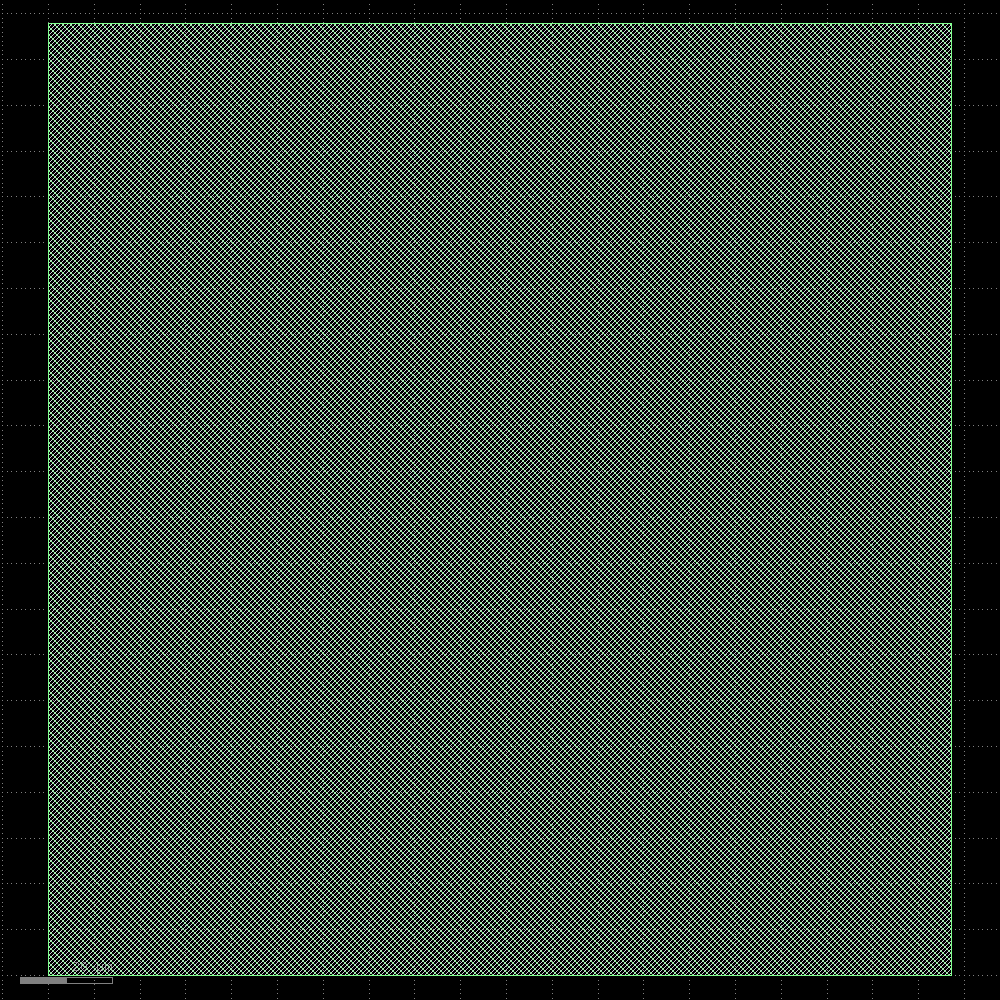

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:06] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=820876;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=974487;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:06] VERBOSE  Logging subprocess to ]8;id=491524;file:///tmp/openlane_klayout_tmp_ie290bfo/klayout-render.log\..]8;;\]8;id=676563;file:///tmp/openlane_klayout_tmp_ie290bfo/klayout-render.log\/tmp/openlane_klayout_tmp_ie290bfo/]8;;\]8;id=175921;file:///tmp/openlane_klayout_tmp_ie290bfo/klayout-render.log\klayout-render.log]8;;\…     ]8;id=356120;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=326167;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.75s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
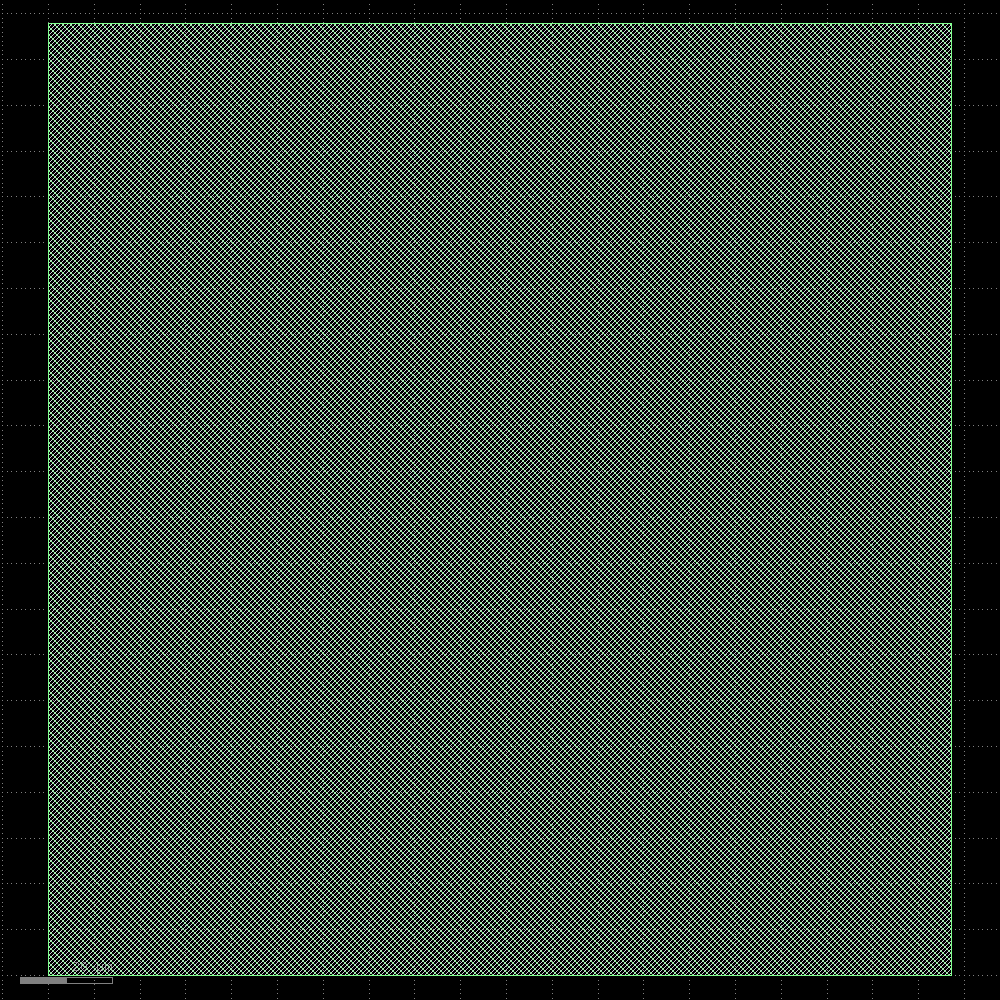

In [39]:
# Floorplan
print("Running Floorplan...")
run_step("OpenROAD.Floorplan", {'FP_CORE_UTIL': 50, 'FP_ASPECT_RATIO': 1.0})

Running Tap/Endcap Insertion...


─────────────────────────────────────────────── Tap/Decap Insertion ───────────────────────────────────────────────

[10:00:07] VERBOSE  Running 'OpenROAD.TapEndcapInsertion'…                                             ]8;id=745440;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=966047;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:07] VERBOSE  Logging subprocess to                                                              ]8;id=78248;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=391800;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=593403;file:///content/openlane_run/20-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\openlane_run/]8;;\]8;id=381996;file:///content/openlane_run/20-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\20]8;;\]8;id=593403;file:///content/openlane_run/20-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log]8;;\…                   

Reading OpenROAD database at '/content/openlane_run/19-openroad-floorplan/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO TAP-0004] Inserted 136 endcaps.

[INFO TAP-0005] Inserted 490 tapcells.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/20-openroad-tapendcapinsertion/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/20-openroad-tapendcapinsertion/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/20-openroad-tapendcapinsertion/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/20-openroad-tapendcapinsertion/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/20-openroad-tapendcapinsertion/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:09] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=628344;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=121753;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:09] VERBOSE  Logging subprocess to ]8;id=135677;file:///tmp/openlane_klayout_tmp_h_eg4x16/klayout-render.log\..]8;;\]8;id=844925;file:///tmp/openlane_klayout_tmp_h_eg4x16/klayout-render.log\/tmp/openlane_klayout_tmp_h_eg4x16/]8;;\]8;id=972412;file:///tmp/openlane_klayout_tmp_h_eg4x16/klayout-render.log\klayout-render.log]8;;\…     ]8;id=388132;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=844376;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.64s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
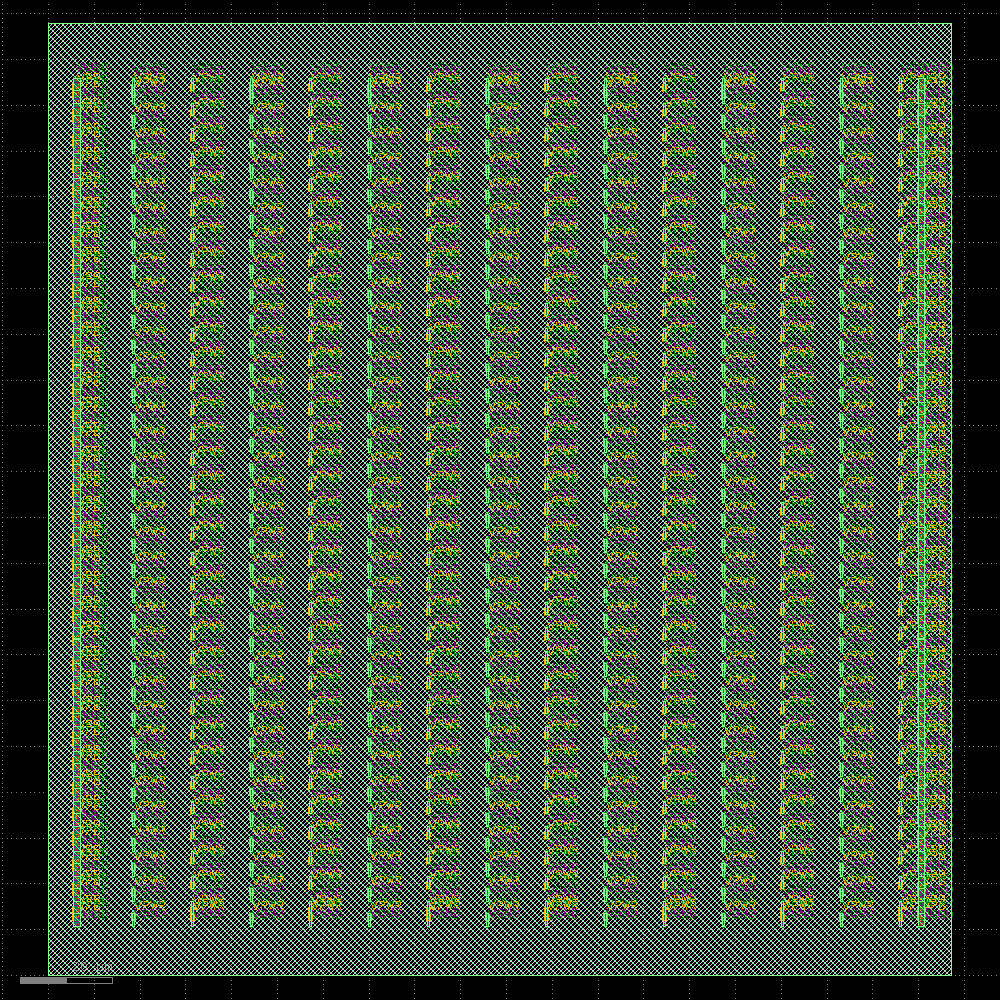

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:10] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=291127;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=268850;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:10] VERBOSE  Logging subprocess to ]8;id=224924;file:///tmp/openlane_klayout_tmp_ps0ucqz8/klayout-render.log\..]8;;\]8;id=568789;file:///tmp/openlane_klayout_tmp_ps0ucqz8/klayout-render.log\/tmp/openlane_klayout_tmp_ps0ucqz8/]8;;\]8;id=152682;file:///tmp/openlane_klayout_tmp_ps0ucqz8/klayout-render.log\klayout-render.log]8;;\…     ]8;id=770163;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=297606;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.64s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
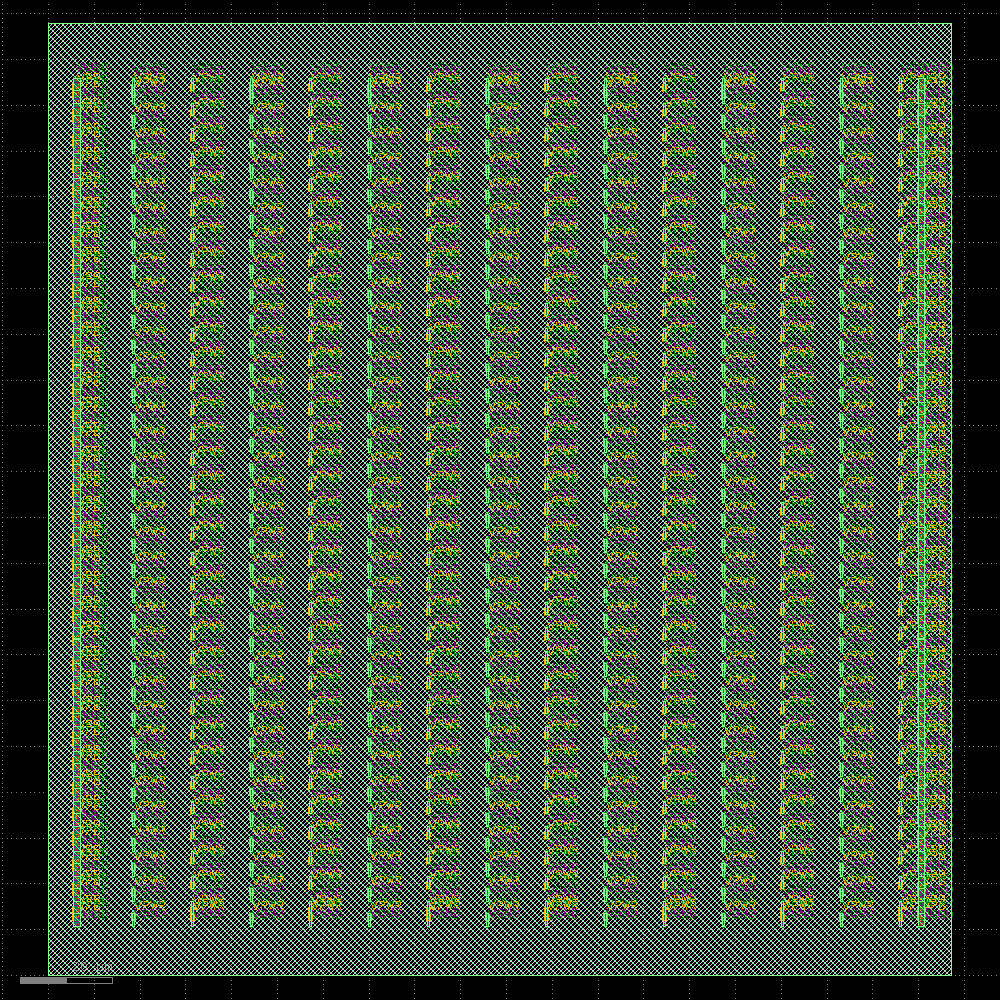

In [40]:
# Tap/Endcap Insertion
print("Running Tap/Endcap Insertion...")
run_step("OpenROAD.TapEndcapInsertion")

Running I/O Placement...


────────────────────────────────────────────────── I/O Placement ──────────────────────────────────────────────────

[10:00:11] VERBOSE  Running 'OpenROAD.IOPlacement'…                                                    ]8;id=459189;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=530593;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:11] VERBOSE  Logging subprocess to                                                              ]8;id=710460;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=948326;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=300683;file:///content/openlane_run/21-openroad-ioplacement/openroad-ioplacement.log\openlane_run/]8;;\]8;id=492338;file:///content/openlane_run/21-openroad-ioplacement/openroad-ioplacement.log\21]8;;\]8;id=300683;file:///content/openlane_run/21-openroad-ioplacement/openroad-ioplacement.log\-openroad-ioplacement/openroad-ioplacement.log]8;;\…                                 

Reading OpenROAD database at '/content/openlane_run/20-openroad-tapendcapinsertion/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] place_pins args: -min_distance 3

Found 0 macro blocks.

[INFO PPL-0010] Tentative 0 to set up sections.

[INFO PPL-0001] Number of slots           246

[INFO PPL-0002] Number of I/O             107

[INFO PPL-0003] Number of I/O w/sink      107

[INFO PPL-0004] Number of I/O w/o sink    0

[INFO PPL-0005] Slots per section         200

[INFO PPL-0006] Slots increase factor     0.01

[INFO PPL-0008] Successfully assigned pins to sections.

[INFO PPL-0012] I/O nets HPWL: 15513.50 um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/21-openroad-ioplacement/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/21-openroad-ioplacement/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/21-openroad-ioplacement/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/21-openroad-ioplacement/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/21-openroad-ioplacement/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:12] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=169626;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=250723;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:12] VERBOSE  Logging subprocess to ]8;id=636532;file:///tmp/openlane_klayout_tmp_i_ksiw64/klayout-render.log\..]8;;\]8;id=357351;file:///tmp/openlane_klayout_tmp_i_ksiw64/klayout-render.log\/tmp/openlane_klayout_tmp_i_ksiw64/]8;;\]8;id=750902;file:///tmp/openlane_klayout_tmp_i_ksiw64/klayout-render.log\klayout-render.log]8;;\…     ]8;id=671651;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=682453;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.47s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
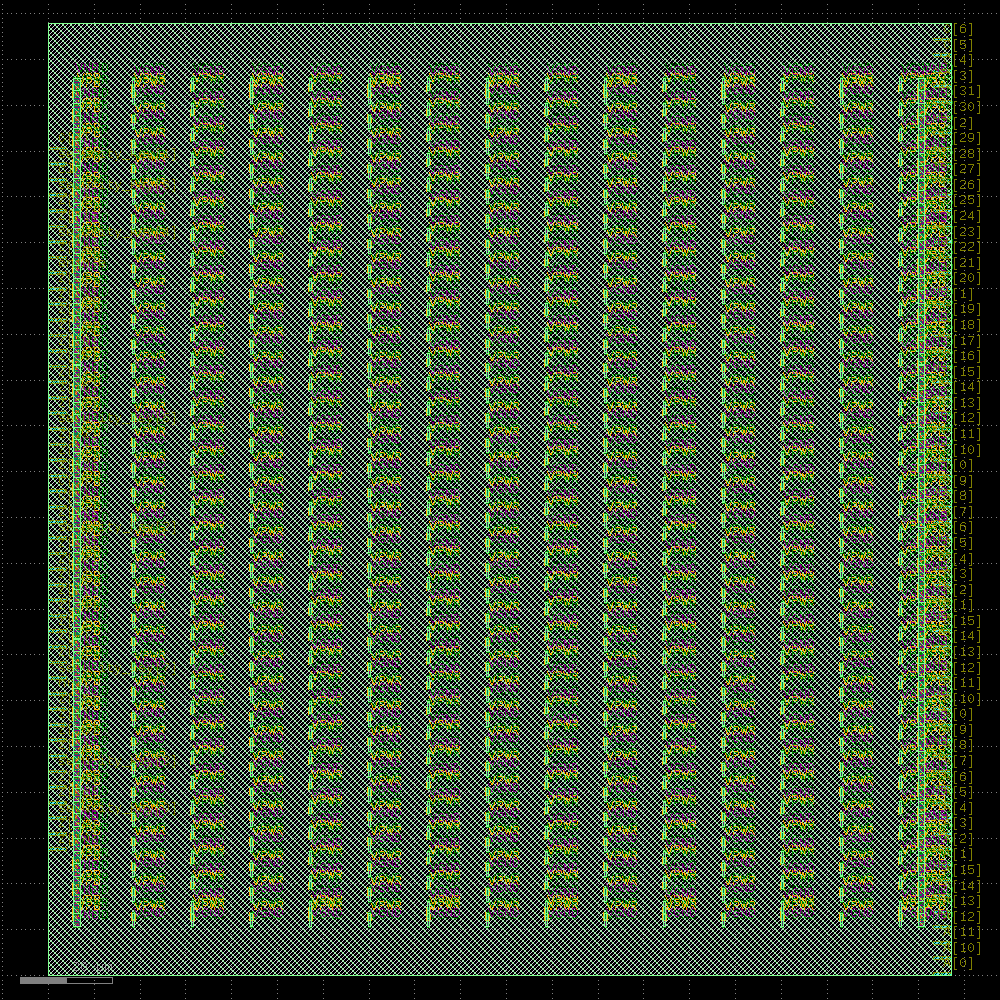

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:14] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=26510;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=228791;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:14] VERBOSE  Logging subprocess to ]8;id=151891;file:///tmp/openlane_klayout_tmp_uep_lb3z/klayout-render.log\..]8;;\]8;id=638118;file:///tmp/openlane_klayout_tmp_uep_lb3z/klayout-render.log\/tmp/openlane_klayout_tmp_uep_lb3z/]8;;\]8;id=620340;file:///tmp/openlane_klayout_tmp_uep_lb3z/klayout-render.log\klayout-render.log]8;;\…     ]8;id=383886;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=495669;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.47s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
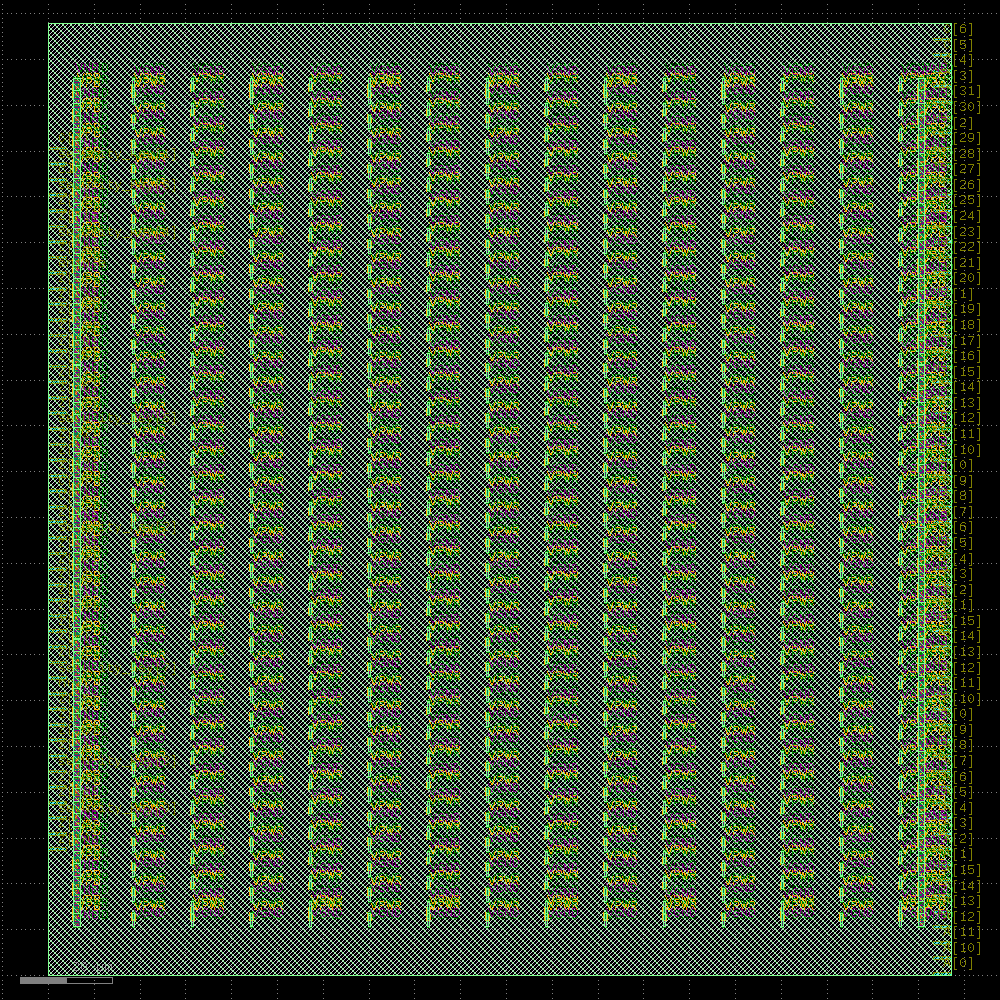

In [41]:
# I/O Placement (default)
print("Running I/O Placement...")
run_step("OpenROAD.IOPlacement")

Running PDN Generation...


────────────────────────────────────── Power Distribution Network Generation ──────────────────────────────────────

[10:00:15] VERBOSE  Running 'OpenROAD.GeneratePDN'…                                                    ]8;id=419543;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=775384;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:15] INFO     'FP_PDN_CFG' not explicitly set, setting it to                                 ]8;id=622052;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=215724;file:///content/openlane_ipynb/openlane/steps/openroad.py#1174\1174]8;;\
                    /content/openlane_ipynb/openlane/scripts/openroad/common/pdn_cfg.tcl…                          

[10:00:15] VERBOSE  Logging subprocess to                                                              ]8;id=618213;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=436695;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=533922;file:///content/openlane_run/22-openroad-generatepdn/openroad-generatepdn.log\openlane_run/]8;;\]8;id=740307;file:///content/openlane_run/22-openroad-generatepdn/openroad-generatepdn.log\22]8;;\]8;id=533922;file:///content/openlane_run/22-openroad-generatepdn/openroad-generatepdn.log\-openroad-generatepdn/openroad-generatepdn.log]8;;\…                                 

Reading OpenROAD database at '/content/openlane_run/21-openroad-ioplacement/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting global connections...

[INFO PDN-0001] Inserting grid: stdcell_grid

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/22-openroad-generatepdn/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/22-openroad-generatepdn/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/22-openroad-generatepdn/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/22-openroad-generatepdn/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/22-openroad-generatepdn/tapeout_vedic_mac_16.sdc'…

[INFO PSM-0040] All shapes on net VPWR are connected.

[INFO PSM-0040] All shapes on net VGND are connected.

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:16] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=530075;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=654831;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:16] VERBOSE  Logging subprocess to ]8;id=212072;file:///tmp/openlane_klayout_tmp_bvrfwefv/klayout-render.log\..]8;;\]8;id=708869;file:///tmp/openlane_klayout_tmp_bvrfwefv/klayout-render.log\/tmp/openlane_klayout_tmp_bvrfwefv/]8;;\]8;id=80726;file:///tmp/openlane_klayout_tmp_bvrfwefv/klayout-render.log\klayout-render.log]8;;\…     ]8;id=938478;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=321614;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.55s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
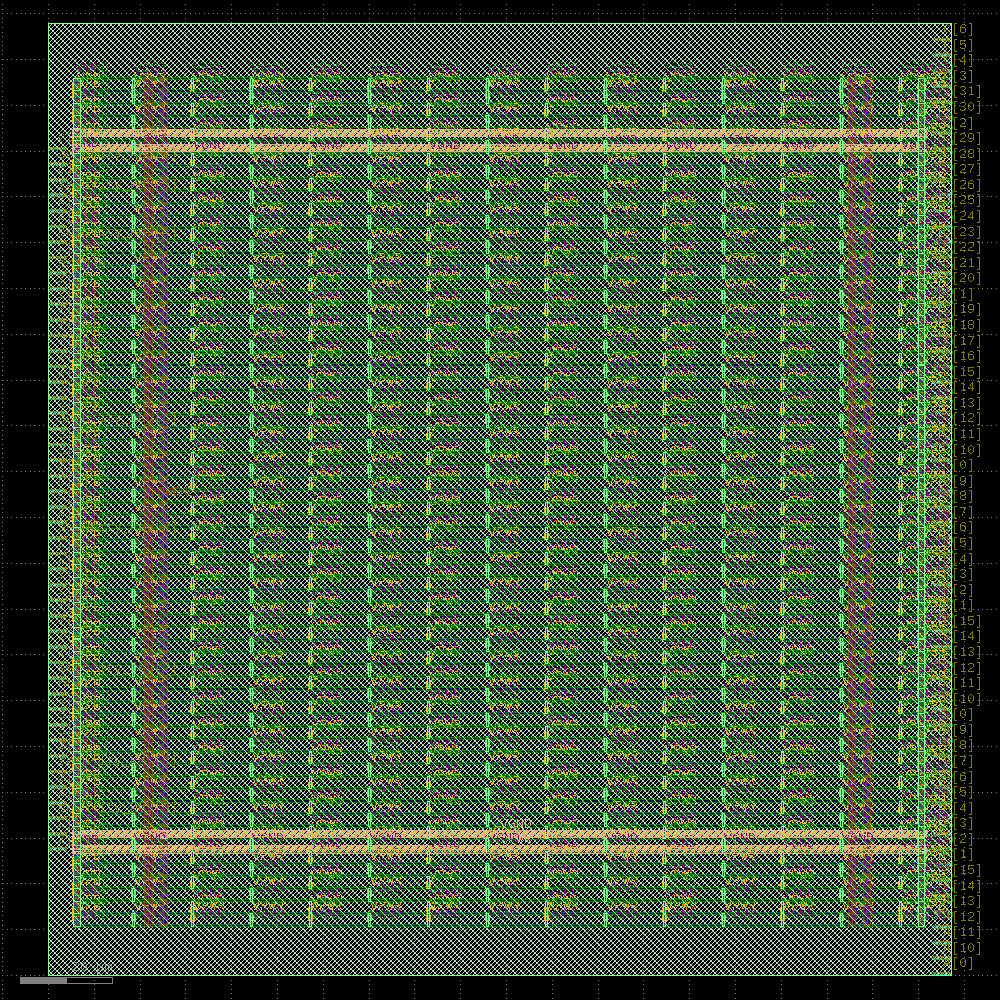

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:18] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=336845;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=69627;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:18] VERBOSE  Logging subprocess to ]8;id=479654;file:///tmp/openlane_klayout_tmp_i7c28ci4/klayout-render.log\..]8;;\]8;id=69653;file:///tmp/openlane_klayout_tmp_i7c28ci4/klayout-render.log\/tmp/openlane_klayout_tmp_i7c28ci4/]8;;\]8;id=296982;file:///tmp/openlane_klayout_tmp_i7c28ci4/klayout-render.log\klayout-render.log]8;;\…     ]8;id=198747;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=757501;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.55s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
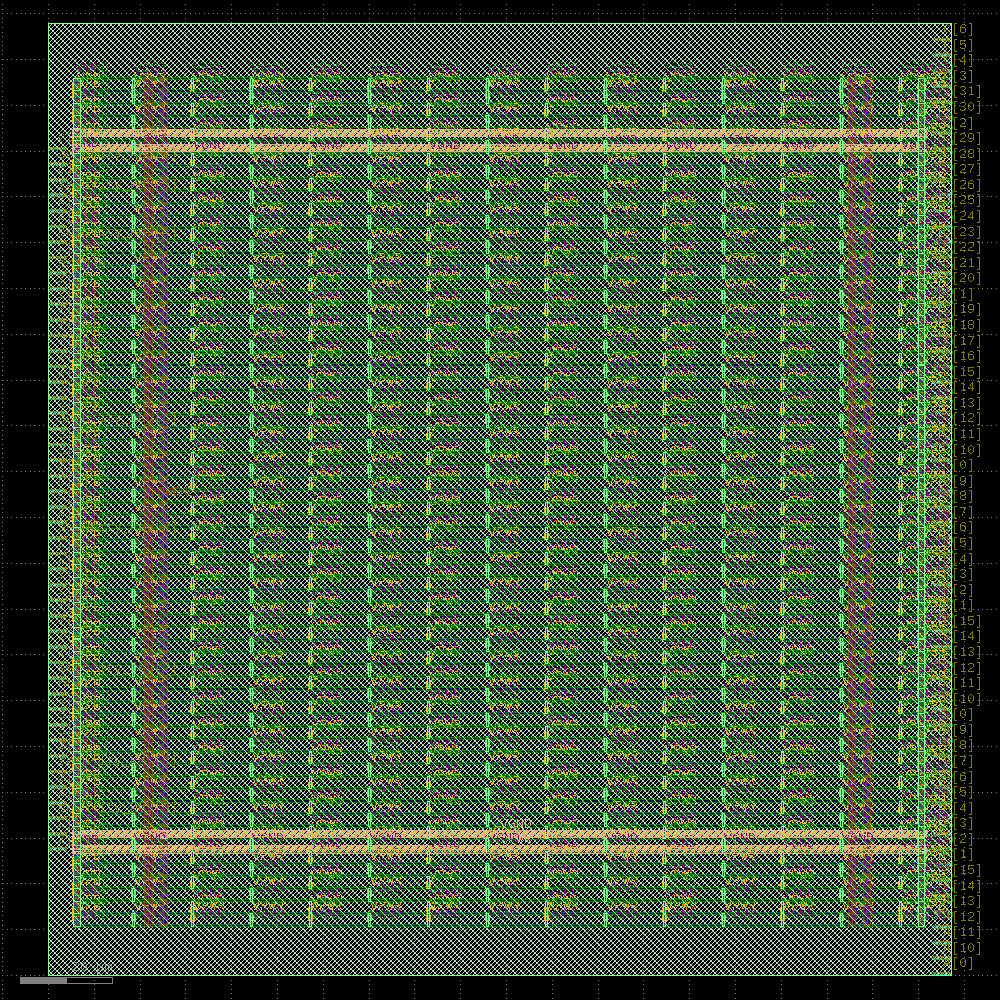

In [42]:
# PDN Generation
print("Running PDN Generation...")
run_step("OpenROAD.GeneratePDN")

Running Global Placement...


──────────────────────────────────────────────── Global Placement ─────────────────────────────────────────────────

[10:00:19] VERBOSE  Running 'OpenROAD.GlobalPlacement'…                                                ]8;id=316949;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=724149;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:19] INFO     'PL_TARGET_DENSITY_PCT' not explicitly set, using dynamically calculated       ]8;id=748485;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=851549;file:///content/openlane_ipynb/openlane/steps/openroad.py#1260\1260]8;;\
                    target density: 62.205900…                                                                     

[10:00:19] VERBOSE  Logging subprocess to                                                              ]8;id=409616;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=225118;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=426052;file:///content/openlane_run/23-openroad-globalplacement/openroad-globalplacement.log\openlane_run/]8;;\]8;id=968759;file:///content/openlane_run/23-openroad-globalplacement/openroad-globalplacement.log\23]8;;\]8;id=426052;file:///content/openlane_run/23-openroad-globalplacement/openroad-globalplacement.log\-openroad-globalplacement/openroad-globalplacement.log]8;;\…                         

Reading OpenROAD database at '/content/openlane_run/22-openroad-generatepdn/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

[INFO GPL-0002] DBU: 1000

[INFO GPL-0003] SiteSize: (  0.460  2.720 ) um

[INFO GPL-0004] CoreBBox: (  5.520 10.880 ) ( 191.360 195.840 ) um

[INFO GPL-0006] NumInstances:              2451

[INFO GPL-0007] NumPlaceInstances:         1825

[INFO GPL-0008] NumFixedInstances:          626

[INFO GPL-0009] NumDummyInstances:            0

[INFO GPL-0010] NumNets:                   1900

[INFO GPL-0011] NumPins:                   6612

[INFO GPL-0012] DieBBox:  (  0.000  0.000 ) ( 197.220 207.940 ) um

[INFO GPL-0013] CoreBBox: (  5.520 10.880 ) ( 191.360 195.840 ) um

[INFO GPL-0016] CoreArea:             34372.966 um^2

[INFO GPL-0017] NonPlaceInstsArea:     1123.578 um^2

[INFO GPL-0018] PlaceInstsArea:       17331.622 um^2

[INFO GPL-0019] Util:                    52.126 %

[INFO GPL-0020] StdInstsArea:         17331.622 um^2

[INFO GPL-0021] MacroInstsArea:           0.000 um^2

[InitialPlace]  Iter: 1 CG residual: 0.00000033 HPWL: 36427320

[InitialPlace]  Iter: 2 CG residual: 0.00000074 HPWL: 29648976

[InitialPlace]  Iter: 3 CG residual: 0.00000032 HPWL: 29315165

[InitialPlace]  Iter: 4 CG residual: 0.00000737 HPWL: 28894356

[InitialPlace]  Iter: 5 CG residual: 0.00000081 HPWL: 28470479

[INFO GPL-0031] FillerInit:NumGCells:      2191

[INFO GPL-0032] FillerInit:NumGNets:       1900

[INFO GPL-0033] FillerInit:NumGPins:       6612

[INFO GPL-0023] TargetDensity:            0.622

[INFO GPL-0024] AvrgPlaceInstArea:        9.497 um^2

[INFO GPL-0025] IdealBinArea:            15.267 um^2

[INFO GPL-0026] IdealBinCnt:               2251

[INFO GPL-0027] TotalBinArea:         34372.966 um^2

[INFO GPL-0028] BinCnt:        32     32

[INFO GPL-0029] BinSize: (  5.808  5.780 )

[INFO GPL-0030] NumBins: 1024

[NesterovSolve] Iter:    1 overflow: 0.951 HPWL: 18555146

[NesterovSolve] Iter:   10 overflow: 0.817 HPWL: 22829968

[INFO GPL-0100] worst slack -1.68e-09

[INFO GPL-0103] Weighted 189 nets.

[NesterovSolve] Iter:   20 overflow: 0.769 HPWL: 24048004

[NesterovSolve] Iter:   30 overflow: 0.763 HPWL: 24536074

[NesterovSolve] Iter:   40 overflow: 0.769 HPWL: 24327373

[NesterovSolve] Iter:   50 overflow: 0.775 HPWL: 23928649

[NesterovSolve] Iter:   60 overflow: 0.780 HPWL: 23768107

[NesterovSolve] Iter:   70 overflow: 0.780 HPWL: 23775844

[NesterovSolve] Iter:   80 overflow: 0.782 HPWL: 23816163

[NesterovSolve] Iter:   90 overflow: 0.785 HPWL: 23823507

[NesterovSolve] Iter:  100 overflow: 0.785 HPWL: 23813947

[NesterovSolve] Iter:  110 overflow: 0.785 HPWL: 23817169

[NesterovSolve] Iter:  120 overflow: 0.784 HPWL: 23841116

[NesterovSolve] Iter:  130 overflow: 0.783 HPWL: 23882830

[NesterovSolve] Iter:  140 overflow: 0.781 HPWL: 23947004

[NesterovSolve] Iter:  150 overflow: 0.778 HPWL: 24050910

[NesterovSolve] Iter:  160 overflow: 0.772 HPWL: 24224189

[NesterovSolve] Iter:  170 overflow: 0.765 HPWL: 24502420

[NesterovSolve] Iter:  180 overflow: 0.758 HPWL: 24909961

[NesterovSolve] Iter:  190 overflow: 0.745 HPWL: 25466314

[NesterovSolve] Iter:  200 overflow: 0.728 HPWL: 26141730

[NesterovSolve] Iter:  210 overflow: 0.707 HPWL: 26900762

[NesterovSolve] Iter:  220 overflow: 0.678 HPWL: 27769458

[NesterovSolve] Iter:  230 overflow: 0.646 HPWL: 28701623

[INFO GPL-0100] worst slack -1.78e-09

[INFO GPL-0103] Weighted 183 nets.

[NesterovSolve] Iter:  240 overflow: 0.607 HPWL: 29473486

[NesterovSolve] Snapshot saved at iter = 241

[NesterovSolve] Iter:  250 overflow: 0.563 HPWL: 30057491

[NesterovSolve] Iter:  260 overflow: 0.524 HPWL: 30548638

[INFO GPL-0100] worst slack -1.58e-09

[INFO GPL-0103] Weighted 189 nets.

[NesterovSolve] Iter:  270 overflow: 0.476 HPWL: 30772699

[NesterovSolve] Iter:  280 overflow: 0.443 HPWL: 31223447

[NesterovSolve] Iter:  290 overflow: 0.402 HPWL: 31412109

[NesterovSolve] Iter:  300 overflow: 0.367 HPWL: 31746646

[NesterovSolve] Iter:  310 overflow: 0.326 HPWL: 31812622

[NesterovSolve] Iter:  320 overflow: 0.298 HPWL: 31808539

[INFO GPL-0100] worst slack -2.02e-09

[INFO GPL-0103] Weighted 189 nets.

[NesterovSolve] Iter:  330 overflow: 0.274 HPWL: 31942558

[NesterovSolve] Iter:  340 overflow: 0.243 HPWL: 32167478

[NesterovSolve] Iter:  350 overflow: 0.215 HPWL: 32300332

[INFO GPL-0100] worst slack -1.83e-09

[INFO GPL-0103] Weighted 189 nets.

[INFO GPL-0075] Routability numCall: 1 inflationIterCnt: 1 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0.6000000238418579

[INFO GPL-0065] OverflowTileCnt2: 4

[INFO GPL-0066] 0.5%RC: 1.0667

[INFO GPL-0067] 1.0%RC: 1.0118

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9836

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0392

[INFO GPL-0078] FinalRC lower than minRC (1e+30), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:       94.155 um^2

[INFO GPL-0046] TargetDensity:            0.622

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17331.622 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      20683.082 um^2

[INFO GPL-0053] ExpectedGCellsArea:   20777.236 um^2

[INFO GPL-0054] NewTargetDensity:         0.625

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          20777.236 um^2

[INFO GPL-0057] NewNesterovInstArea:  17425.777 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   20777.236 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  360 overflow: 0.586 HPWL: 29804329

[NesterovSolve] Iter:  370 overflow: 0.553 HPWL: 30116883

[NesterovSolve] Iter:  380 overflow: 0.520 HPWL: 30391232

[NesterovSolve] Iter:  390 overflow: 0.480 HPWL: 30620753

[NesterovSolve] Iter:  400 overflow: 0.454 HPWL: 30781968

[NesterovSolve] Iter:  410 overflow: 0.427 HPWL: 30934875

[NesterovSolve] Iter:  420 overflow: 0.401 HPWL: 31154979

[NesterovSolve] Iter:  430 overflow: 0.371 HPWL: 31227784

[NesterovSolve] Iter:  440 overflow: 0.336 HPWL: 31474866

[NesterovSolve] Iter:  450 overflow: 0.310 HPWL: 31649068

[NesterovSolve] Iter:  460 overflow: 0.283 HPWL: 31712337

[NesterovSolve] Iter:  470 overflow: 0.250 HPWL: 31945268

[NesterovSolve] Iter:  480 overflow: 0.223 HPWL: 32069699

[INFO GPL-0075] Routability numCall: 2 inflationIterCnt: 2 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0.3333333730697632

[INFO GPL-0065] OverflowTileCnt2: 2

[INFO GPL-0066] 0.5%RC: 1.0370

[INFO GPL-0067] 1.0%RC: 1.0118

[INFO GPL-0068] 2.0%RC: 0.9917

[INFO GPL-0069] 5.0%RC: 0.9487

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0244

[INFO GPL-0078] FinalRC lower than minRC (1.0392157), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:      113.611 um^2

[INFO GPL-0046] TargetDensity:            0.625

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17425.777 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      20777.236 um^2

[INFO GPL-0053] ExpectedGCellsArea:   20890.848 um^2

[INFO GPL-0054] NewTargetDensity:         0.628

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          20890.847 um^2

[INFO GPL-0057] NewNesterovInstArea:  17539.388 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   20890.847 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  490 overflow: 0.586 HPWL: 29813461

[NesterovSolve] Iter:  500 overflow: 0.553 HPWL: 30175025

[NesterovSolve] Iter:  510 overflow: 0.519 HPWL: 30449066

[NesterovSolve] Iter:  520 overflow: 0.480 HPWL: 30658283

[NesterovSolve] Iter:  530 overflow: 0.451 HPWL: 30791954

[NesterovSolve] Iter:  540 overflow: 0.428 HPWL: 30986899

[NesterovSolve] Iter:  550 overflow: 0.402 HPWL: 31192179

[NesterovSolve] Iter:  560 overflow: 0.369 HPWL: 31288924

[NesterovSolve] Iter:  570 overflow: 0.337 HPWL: 31526740

[NesterovSolve] Iter:  580 overflow: 0.310 HPWL: 31698296

[NesterovSolve] Iter:  590 overflow: 0.281 HPWL: 31821600

[NesterovSolve] Iter:  600 overflow: 0.248 HPWL: 32006334

[NesterovSolve] Iter:  610 overflow: 0.222 HPWL: 32093570

[INFO GPL-0075] Routability numCall: 3 inflationIterCnt: 3 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0.20000004768371582

[INFO GPL-0064] TotalRouteOverflowV2: 0.2666667699813843

[INFO GPL-0065] OverflowTileCnt2: 3

[INFO GPL-0066] 0.5%RC: 1.0296

[INFO GPL-0067] 1.0%RC: 1.0083

[INFO GPL-0068] 2.0%RC: 0.9979

[INFO GPL-0069] 5.0%RC: 0.9479

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0190

[INFO GPL-0078] FinalRC lower than minRC (1.0244008), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:       85.362 um^2

[INFO GPL-0046] TargetDensity:            0.628

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17539.388 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      20890.847 um^2

[INFO GPL-0053] ExpectedGCellsArea:   20976.210 um^2

[INFO GPL-0054] NewTargetDensity:         0.631

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          20976.210 um^2

[INFO GPL-0057] NewNesterovInstArea:  17624.751 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   20976.210 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  620 overflow: 0.590 HPWL: 29752039

[NesterovSolve] Iter:  630 overflow: 0.555 HPWL: 30188733

[NesterovSolve] Iter:  640 overflow: 0.523 HPWL: 30438551

[NesterovSolve] Iter:  650 overflow: 0.485 HPWL: 30660778

[NesterovSolve] Iter:  660 overflow: 0.455 HPWL: 30777252

[NesterovSolve] Iter:  670 overflow: 0.431 HPWL: 30969611

[NesterovSolve] Iter:  680 overflow: 0.402 HPWL: 31232950

[NesterovSolve] Iter:  690 overflow: 0.374 HPWL: 31210935

[NesterovSolve] Iter:  700 overflow: 0.341 HPWL: 31532782

[NesterovSolve] Iter:  710 overflow: 0.314 HPWL: 31709601

[NesterovSolve] Iter:  720 overflow: 0.283 HPWL: 31726448

[NesterovSolve] Iter:  730 overflow: 0.248 HPWL: 31940279

[NesterovSolve] Iter:  740 overflow: 0.222 HPWL: 32055021

[INFO GPL-0075] Routability numCall: 4 inflationIterCnt: 4 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0.06666672229766846

[INFO GPL-0065] OverflowTileCnt2: 1

[INFO GPL-0066] 0.5%RC: 1.0074

[INFO GPL-0067] 1.0%RC: 1.0000

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9584

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0037

[INFO GPL-0078] FinalRC lower than minRC (1.0189815), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:       12.641 um^2

[INFO GPL-0046] TargetDensity:            0.631

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17624.751 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      20976.210 um^2

[INFO GPL-0053] ExpectedGCellsArea:   20988.850 um^2

[INFO GPL-0054] NewTargetDensity:         0.631

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          20988.850 um^2

[INFO GPL-0057] NewNesterovInstArea:  17637.391 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   20988.850 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  750 overflow: 0.595 HPWL: 29677559

[NesterovSolve] Iter:  760 overflow: 0.558 HPWL: 30172216

[NesterovSolve] Iter:  770 overflow: 0.526 HPWL: 30423669

[NesterovSolve] Iter:  780 overflow: 0.491 HPWL: 30645389

[NesterovSolve] Iter:  790 overflow: 0.458 HPWL: 30763647

[NesterovSolve] Iter:  800 overflow: 0.434 HPWL: 30968463

[NesterovSolve] Iter:  810 overflow: 0.406 HPWL: 31240526

[NesterovSolve] Iter:  820 overflow: 0.377 HPWL: 31210631

[NesterovSolve] Iter:  830 overflow: 0.346 HPWL: 31502632

[NesterovSolve] Iter:  840 overflow: 0.317 HPWL: 31700585

[NesterovSolve] Iter:  850 overflow: 0.284 HPWL: 31731601

[NesterovSolve] Iter:  860 overflow: 0.252 HPWL: 31939623

[NesterovSolve] Iter:  870 overflow: 0.225 HPWL: 32042298

[NesterovSolve] Iter:  880 overflow: 0.199 HPWL: 32229731

[INFO GPL-0075] Routability numCall: 5 inflationIterCnt: 0 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0.06666672229766846

[INFO GPL-0065] OverflowTileCnt2: 1

[INFO GPL-0066] 0.5%RC: 1.0074

[INFO GPL-0067] 1.0%RC: 1.0000

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9605

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0037

[INFO GPL-0079] MinRC (1.0037037) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:        7.937 um^2

[INFO GPL-0046] TargetDensity:            0.631

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17637.391 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      20988.850 um^2

[INFO GPL-0053] ExpectedGCellsArea:   20996.787 um^2

[INFO GPL-0054] NewTargetDensity:         0.631

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          20996.786 um^2

[INFO GPL-0057] NewNesterovInstArea:  17645.328 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.458 um^2

[INFO GPL-0059] NewTotalGCellsArea:   20996.786 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  890 overflow: 0.560 HPWL: 30160029

[NesterovSolve] Iter:  900 overflow: 0.530 HPWL: 30403214

[NesterovSolve] Iter:  910 overflow: 0.494 HPWL: 30628620

[NesterovSolve] Iter:  920 overflow: 0.461 HPWL: 30738869

[NesterovSolve] Iter:  930 overflow: 0.436 HPWL: 30951088

[NesterovSolve] Iter:  940 overflow: 0.409 HPWL: 31214965

[NesterovSolve] Iter:  950 overflow: 0.379 HPWL: 31192870

[NesterovSolve] Iter:  960 overflow: 0.348 HPWL: 31468721

[NesterovSolve] Iter:  970 overflow: 0.318 HPWL: 31696411

[NesterovSolve] Iter:  980 overflow: 0.286 HPWL: 31732817

[NesterovSolve] Iter:  990 overflow: 0.255 HPWL: 31941697

[NesterovSolve] Iter: 1000 overflow: 0.228 HPWL: 32040000

[NesterovSolve] Iter: 1010 overflow: 0.201 HPWL: 32220350

[INFO GPL-0075] Routability numCall: 6 inflationIterCnt: 1 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0.06666672229766846

[INFO GPL-0065] OverflowTileCnt2: 1

[INFO GPL-0066] 0.5%RC: 1.0074

[INFO GPL-0067] 1.0%RC: 1.0039

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9630

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0057

[INFO GPL-0079] MinRC (1.0037037) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:       14.039 um^2

[INFO GPL-0046] TargetDensity:            0.631

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17645.328 um^2

[INFO GPL-0051] TotalFillerArea:       3351.458 um^2

[INFO GPL-0052] TotalGCellsArea:      20996.786 um^2

[INFO GPL-0053] ExpectedGCellsArea:   21010.825 um^2

[INFO GPL-0054] NewTargetDensity:         0.632

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          21010.825 um^2

[INFO GPL-0057] NewNesterovInstArea:  17659.367 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   21010.825 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1020 overflow: 0.561 HPWL: 30136019

[NesterovSolve] Iter: 1030 overflow: 0.534 HPWL: 30384187

[NesterovSolve] Iter: 1040 overflow: 0.498 HPWL: 30608683

[NesterovSolve] Iter: 1050 overflow: 0.465 HPWL: 30733880

[NesterovSolve] Iter: 1060 overflow: 0.436 HPWL: 30951227

[NesterovSolve] Iter: 1070 overflow: 0.412 HPWL: 31197320

[NesterovSolve] Iter: 1080 overflow: 0.383 HPWL: 31207125

[NesterovSolve] Iter: 1090 overflow: 0.351 HPWL: 31438502

[NesterovSolve] Iter: 1100 overflow: 0.320 HPWL: 31693342

[NesterovSolve] Iter: 1110 overflow: 0.289 HPWL: 31746192

[NesterovSolve] Iter: 1120 overflow: 0.260 HPWL: 31927622

[NesterovSolve] Iter: 1130 overflow: 0.231 HPWL: 32028950

[NesterovSolve] Iter: 1140 overflow: 0.204 HPWL: 32205971

[INFO GPL-0075] Routability numCall: 7 inflationIterCnt: 2 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0

[INFO GPL-0065] OverflowTileCnt2: 0

[INFO GPL-0066] 0.5%RC: 1.0000

[INFO GPL-0067] 1.0%RC: 1.0000

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9643

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0000

[INFO GPL-0078] FinalRC lower than minRC (1.0037037), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:        0.000 um^2

[INFO GPL-0046] TargetDensity:            0.632

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17659.367 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      21010.825 um^2

[INFO GPL-0053] ExpectedGCellsArea:   21010.825 um^2

[INFO GPL-0054] NewTargetDensity:         0.632

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          21010.825 um^2

[INFO GPL-0057] NewNesterovInstArea:  17659.367 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   21010.825 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1150 overflow: 0.565 HPWL: 30113269

[NesterovSolve] Iter: 1160 overflow: 0.539 HPWL: 30348853

[NesterovSolve] Iter: 1170 overflow: 0.501 HPWL: 30589096

[NesterovSolve] Iter: 1180 overflow: 0.467 HPWL: 30712843

[NesterovSolve] Iter: 1190 overflow: 0.438 HPWL: 30935558

[NesterovSolve] Iter: 1200 overflow: 0.415 HPWL: 31152818

[NesterovSolve] Iter: 1210 overflow: 0.384 HPWL: 31200865

[NesterovSolve] Iter: 1220 overflow: 0.353 HPWL: 31402392

[NesterovSolve] Iter: 1230 overflow: 0.322 HPWL: 31679432

[NesterovSolve] Iter: 1240 overflow: 0.291 HPWL: 31751715

[NesterovSolve] Iter: 1250 overflow: 0.264 HPWL: 31907563

[NesterovSolve] Iter: 1260 overflow: 0.234 HPWL: 32016675

[NesterovSolve] Iter: 1270 overflow: 0.206 HPWL: 32187482

[INFO GPL-0075] Routability numCall: 8 inflationIterCnt: 3 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0

[INFO GPL-0065] OverflowTileCnt2: 0

[INFO GPL-0066] 0.5%RC: 1.0000

[INFO GPL-0067] 1.0%RC: 1.0000

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9643

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0000

[INFO GPL-0079] MinRC (1) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:        0.000 um^2

[INFO GPL-0046] TargetDensity:            0.632

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17659.367 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      21010.825 um^2

[INFO GPL-0053] ExpectedGCellsArea:   21010.825 um^2

[INFO GPL-0054] NewTargetDensity:         0.632

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          21010.825 um^2

[INFO GPL-0057] NewNesterovInstArea:  17659.367 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   21010.825 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1280 overflow: 0.569 HPWL: 30072989

[NesterovSolve] Iter: 1290 overflow: 0.542 HPWL: 30320867

[NesterovSolve] Iter: 1300 overflow: 0.505 HPWL: 30562540

[NesterovSolve] Iter: 1310 overflow: 0.469 HPWL: 30709643

[NesterovSolve] Iter: 1320 overflow: 0.441 HPWL: 30921337

[NesterovSolve] Iter: 1330 overflow: 0.418 HPWL: 31129192

[NesterovSolve] Iter: 1340 overflow: 0.388 HPWL: 31223714

[NesterovSolve] Iter: 1350 overflow: 0.357 HPWL: 31376282

[NesterovSolve] Iter: 1360 overflow: 0.324 HPWL: 31661837

[NesterovSolve] Iter: 1370 overflow: 0.294 HPWL: 31761560

[NesterovSolve] Iter: 1380 overflow: 0.269 HPWL: 31872522

[NesterovSolve] Iter: 1390 overflow: 0.237 HPWL: 32001208

[NesterovSolve] Iter: 1400 overflow: 0.209 HPWL: 32164614

[INFO GPL-0075] Routability numCall: 9 inflationIterCnt: 4 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0

[INFO GPL-0065] OverflowTileCnt2: 0

[INFO GPL-0066] 0.5%RC: 1.0000

[INFO GPL-0067] 1.0%RC: 1.0000

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9643

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0000

[INFO GPL-0079] MinRC (1) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:        0.000 um^2

[INFO GPL-0046] TargetDensity:            0.632

[INFO GPL-0049] WhiteSpaceArea:       33249.389 um^2

[INFO GPL-0050] NesterovInstsArea:    17659.367 um^2

[INFO GPL-0051] TotalFillerArea:       3351.459 um^2

[INFO GPL-0052] TotalGCellsArea:      21010.825 um^2

[INFO GPL-0053] ExpectedGCellsArea:   21010.825 um^2

[INFO GPL-0054] NewTargetDensity:         0.632

[INFO GPL-0055] NewWhiteSpaceArea:    33249.389 um^2

[INFO GPL-0056] MovableArea:          21010.825 um^2

[INFO GPL-0057] NewNesterovInstArea:  17659.367 um^2

[INFO GPL-0058] NewTotalFillerArea:    3351.459 um^2

[INFO GPL-0059] NewTotalGCellsArea:   21010.825 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1410 overflow: 0.573 HPWL: 30030435

[NesterovSolve] Iter: 1420 overflow: 0.545 HPWL: 30295134

[NesterovSolve] Iter: 1430 overflow: 0.509 HPWL: 30540755

[NesterovSolve] Iter: 1440 overflow: 0.471 HPWL: 30701978

[NesterovSolve] Iter: 1450 overflow: 0.444 HPWL: 30895498

[NesterovSolve] Iter: 1460 overflow: 0.420 HPWL: 31093075

[NesterovSolve] Iter: 1470 overflow: 0.390 HPWL: 31225787

[NesterovSolve] Iter: 1480 overflow: 0.359 HPWL: 31341963

[NesterovSolve] Iter: 1490 overflow: 0.327 HPWL: 31653856

[NesterovSolve] Iter: 1500 overflow: 0.298 HPWL: 31763933

[NesterovSolve] Iter: 1510 overflow: 0.273 HPWL: 31846079

[NesterovSolve] Iter: 1520 overflow: 0.240 HPWL: 31988189

[NesterovSolve] Iter: 1530 overflow: 0.212 HPWL: 32142739

[INFO GPL-0075] Routability numCall: 10 inflationIterCnt: 0 bloatIterCnt: 2

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      28   30

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 840

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0

[INFO GPL-0065] OverflowTileCnt2: 0

[INFO GPL-0066] 0.5%RC: 1.0000

[INFO GPL-0067] 1.0%RC: 1.0000

[INFO GPL-0068] 2.0%RC: 1.0000

[INFO GPL-0069] 5.0%RC: 0.9643

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0000

[INFO GPL-0079] MinRC (1) violation occurred, total count: 3.

[INFO GPL-0045] InflatedAreaDelta:        0.000 um^2

[INFO GPL-0046] TargetDensity:            0.632

Revert Routability Procedure. Target density higher than max, or minRC max violations.

[INFO GPL-0080] minRcViolatedCnt: 3

[INFO GPL-0047] SavedMinRC: 1.0000

[INFO GPL-0048] SavedTargetDensity: 0.6319

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1540 overflow: 0.577 HPWL: 29971524

[NesterovSolve] Iter: 1550 overflow: 0.547 HPWL: 30276066

[NesterovSolve] Iter: 1560 overflow: 0.513 HPWL: 30514473

[NesterovSolve] Iter: 1570 overflow: 0.474 HPWL: 30709961

[NesterovSolve] Iter: 1580 overflow: 0.446 HPWL: 30869456

[NesterovSolve] Iter: 1590 overflow: 0.422 HPWL: 31075539

[NesterovSolve] Iter: 1600 overflow: 0.394 HPWL: 31250348

[NesterovSolve] Iter: 1610 overflow: 0.363 HPWL: 31315498

[NesterovSolve] Iter: 1620 overflow: 0.330 HPWL: 31639272

[NesterovSolve] Iter: 1630 overflow: 0.302 HPWL: 31767892

[NesterovSolve] Iter: 1640 overflow: 0.276 HPWL: 31817173

[NesterovSolve] Iter: 1650 overflow: 0.242 HPWL: 31974071

[NesterovSolve] Iter: 1660 overflow: 0.215 HPWL: 32120268

[NesterovSolve] Iter: 1670 overflow: 0.187 HPWL: 32275822

[NesterovSolve] Iter: 1680 overflow: 0.163 HPWL: 32391641

[INFO GPL-0100] worst slack -1.89e-09

[INFO GPL-0103] Weighted 189 nets.

[NesterovSolve] Iter: 1690 overflow: 0.142 HPWL: 32520294

[NesterovSolve] Iter: 1700 overflow: 0.122 HPWL: 32625829

[NesterovSolve] Iter: 1710 overflow: 0.103 HPWL: 32716237

[NesterovSolve] Finished with Overflow: 0.099691

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/23-openroad-globalplacement/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/23-openroad-globalplacement/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/23-openroad-globalplacement/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/23-openroad-globalplacement/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/23-openroad-globalplacement/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:39] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=831033;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=106053;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:39] VERBOSE  Logging subprocess to ]8;id=21860;file:///tmp/openlane_klayout_tmp_kwayl3xv/klayout-render.log\..]8;;\]8;id=476773;file:///tmp/openlane_klayout_tmp_kwayl3xv/klayout-render.log\/tmp/openlane_klayout_tmp_kwayl3xv/]8;;\]8;id=894105;file:///tmp/openlane_klayout_tmp_kwayl3xv/klayout-render.log\klayout-render.log]8;;\…     ]8;id=846839;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=776200;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 19.88s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
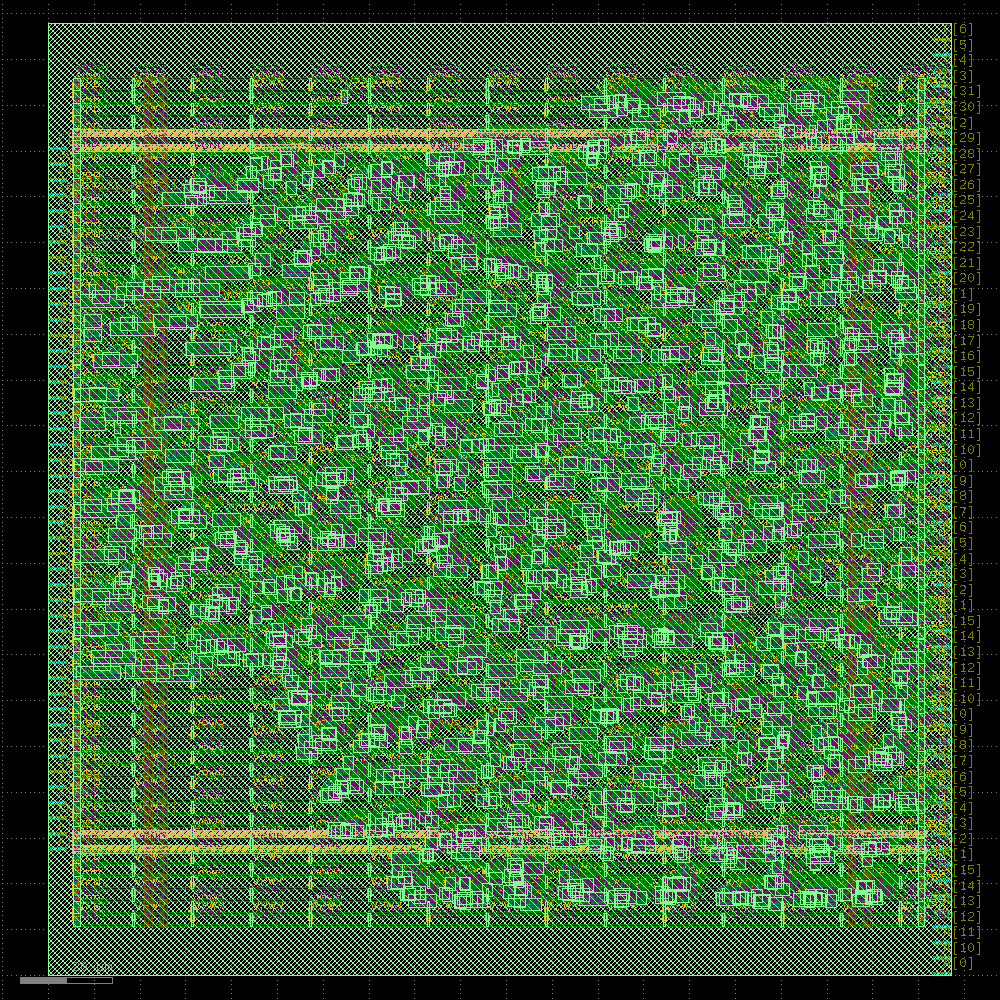

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:41] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=812608;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=269696;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:41] VERBOSE  Logging subprocess to ]8;id=447136;file:///tmp/openlane_klayout_tmp_4fght2br/klayout-render.log\..]8;;\]8;id=755698;file:///tmp/openlane_klayout_tmp_4fght2br/klayout-render.log\/tmp/openlane_klayout_tmp_4fght2br/]8;;\]8;id=653714;file:///tmp/openlane_klayout_tmp_4fght2br/klayout-render.log\klayout-render.log]8;;\…     ]8;id=216790;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=80355;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 19.88s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
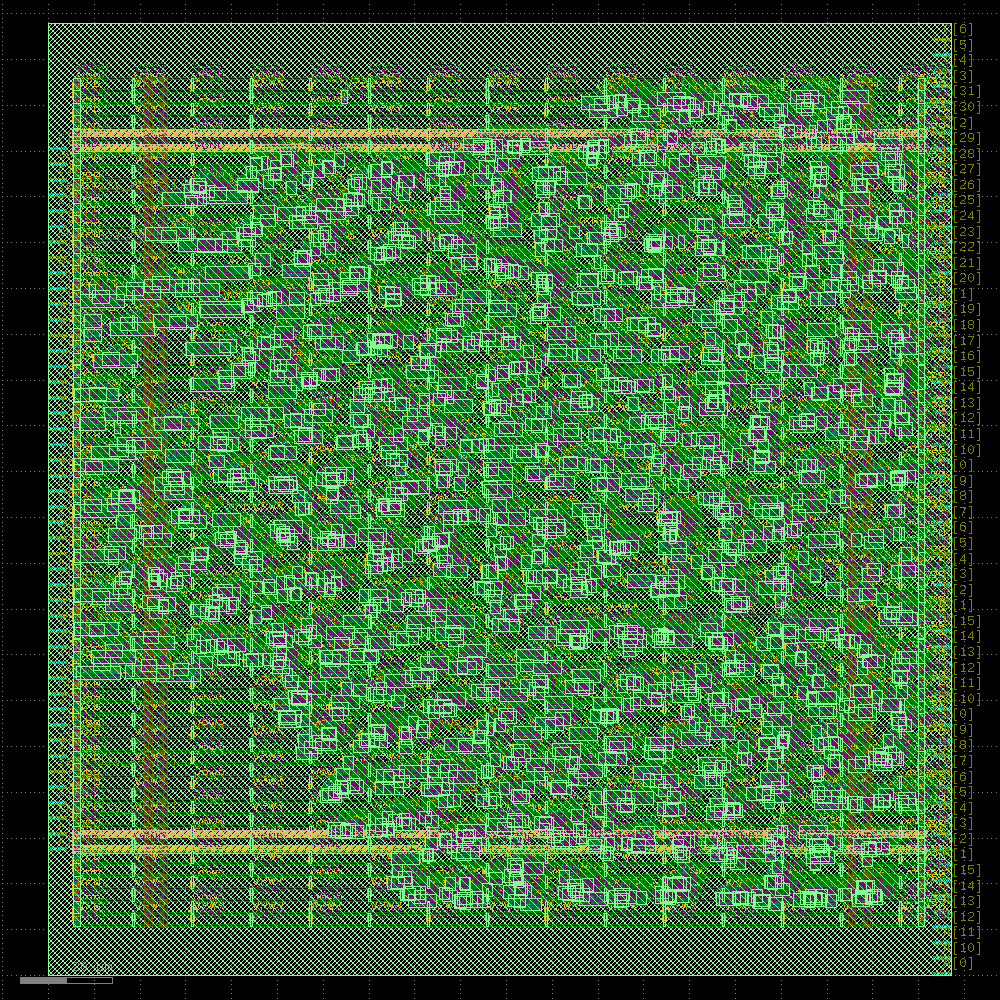

In [43]:
# Global Placement
print("Running Global Placement...")
run_step("OpenROAD.GlobalPlacement")

Running Detailed Placement...


─────────────────────────────────────────────── Detailed Placement ────────────────────────────────────────────────

[10:00:43] VERBOSE  Running 'OpenROAD.DetailedPlacement'…                                              ]8;id=96080;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=828475;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:43] VERBOSE  Logging subprocess to                                                              ]8;id=174951;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=458464;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=44098;file:///content/openlane_run/24-openroad-detailedplacement/openroad-detailedplacement.log\openlane_run/]8;;\]8;id=629581;file:///content/openlane_run/24-openroad-detailedplacement/openroad-detailedplacement.log\24]8;;\]8;id=44098;file:///content/openlane_run/24-openroad-detailedplacement/openroad-detailedplacement.log\-openroad-detailedplacement/openroad-detailedplacement.log]8;;\…                     

Reading OpenROAD database at '/content/openlane_run/23-openroad-globalplacement/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Placement Analysis

---------------------------------

total displacement       4666.9 u

average displacement        1.9 u

max displacement            9.4 u

original HPWL           32841.0 u

legalized HPWL          37993.2 u

delta HPWL                   16 %

[INFO DPL-0020] Mirrored 903 instances

[INFO DPL-0021] HPWL before           37993.2 u

[INFO DPL-0022] HPWL after            36074.4 u

[INFO DPL-0023] HPWL delta               -5.1 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/24-openroad-detailedplacement/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/24-openroad-detailedplacement/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/24-openroad-detailedplacement/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/24-openroad-detailedplacement/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/24-openroad-detailedplacement/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:44] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=466327;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=249844;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:44] VERBOSE  Logging subprocess to ]8;id=832143;file:///tmp/openlane_klayout_tmp_9edoua23/klayout-render.log\..]8;;\]8;id=947627;file:///tmp/openlane_klayout_tmp_9edoua23/klayout-render.log\/tmp/openlane_klayout_tmp_9edoua23/]8;;\]8;id=417991;file:///tmp/openlane_klayout_tmp_9edoua23/klayout-render.log\klayout-render.log]8;;\…     ]8;id=968120;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=722404;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.44s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
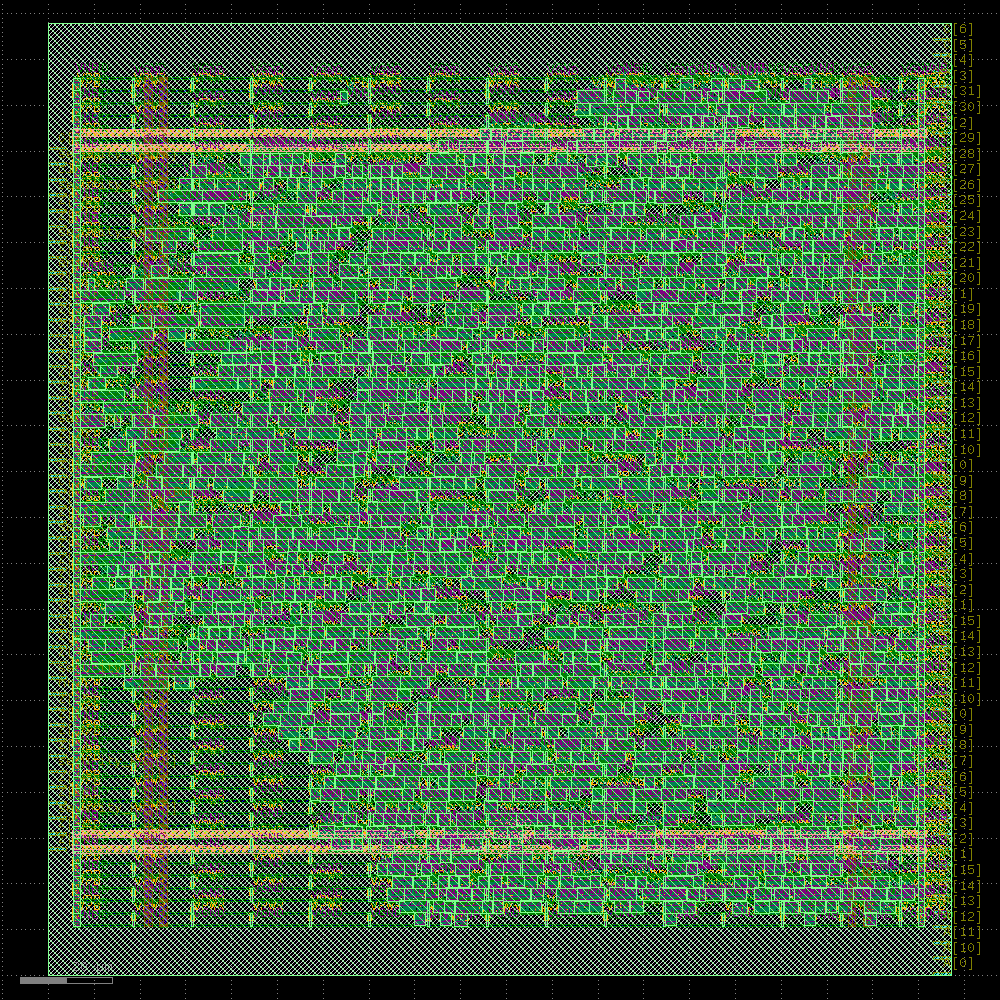

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:00:45] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=167670;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=611326;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:45] VERBOSE  Logging subprocess to ]8;id=348568;file:///tmp/openlane_klayout_tmp_k5vhytod/klayout-render.log\..]8;;\]8;id=516812;file:///tmp/openlane_klayout_tmp_k5vhytod/klayout-render.log\/tmp/openlane_klayout_tmp_k5vhytod/]8;;\]8;id=987441;file:///tmp/openlane_klayout_tmp_k5vhytod/klayout-render.log\klayout-render.log]8;;\…     ]8;id=172874;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=333919;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.44s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
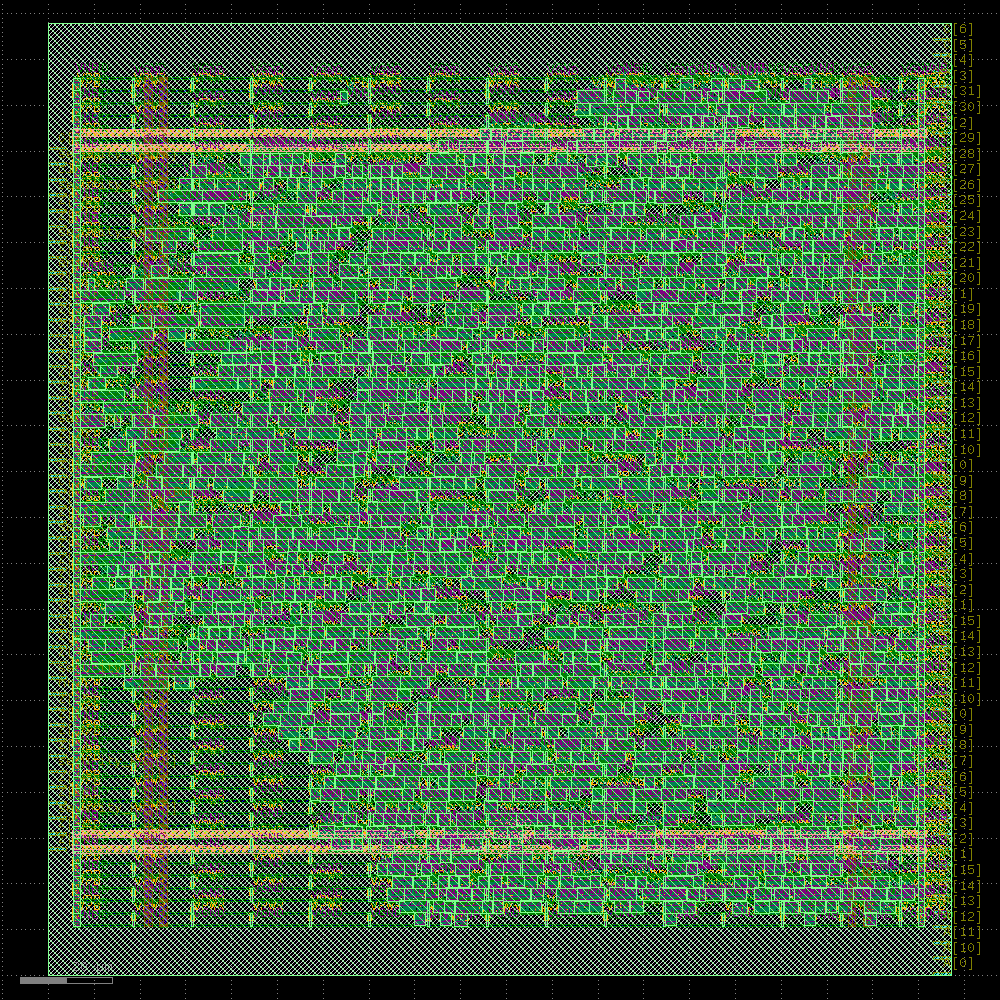

In [44]:
# Detailed Placement
print("Running Detailed Placement...")
run_step("OpenROAD.DetailedPlacement")

Running CTS...


────────────────────────────────────────────── Clock Tree Synthesis ───────────────────────────────────────────────

[10:00:46] VERBOSE  Running 'OpenROAD.CTS'…                                                            ]8;id=607577;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=424068;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:00:46] VERBOSE  Logging subprocess to ]8;id=10020;file:///content/openlane_run/25-openroad-cts/openroad-cts.log\openlane_run/]8;;\]8;id=769828;file:///content/openlane_run/25-openroad-cts/openroad-cts.log\25]8;;\]8;id=10020;file:///content/openlane_run/25-openroad-cts/openroad-cts.log\-openroad-cts/openroad-cts.log]8;;\…               ]8;id=636915;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=796802;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading timing models for corner nom_tt_025C_1v80…

Reading timing library for the 'nom_tt_025C_1v80' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading timing models for corner nom_ff_n40C_1v95…

Reading timing library for the 'nom_ff_n40C_1v95' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib'…

Reading timing models for corner nom_ss_100C_1v60…

Reading timing library for the 'nom_ss_100C_1v60' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib'…

Reading OpenROAD database at '/content/openlane_run/24-openroad-detailedplacement/tapeout_vedic_mac_16.odb'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Configuring cts characterization…

[INFO] Performing clock tree synthesis…

[INFO] Looking for the following net(s): clk

[INFO] Running Clock Tree Synthesis…

[INFO CTS-0050] Root buffer is sky130_fd_sc_hd__clkbuf_16.

[INFO CTS-0051] Sink buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0052] The following clock buffers will be used for CTS:

sky130_fd_sc_hd__clkbuf_2

sky130_fd_sc_hd__clkbuf_4

sky130_fd_sc_hd__clkbuf_8

[INFO CTS-0049] Characterization buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0007] Net "clk" found for clock "clk".

[INFO CTS-0010]  Clock net "clk" has 32 sinks.

[INFO CTS-0008] TritonCTS found 1 clock nets.

[INFO CTS-0097] Characterization used 3 buffer(s) types.

[INFO CTS-0200] 0 placement blockages have been identified.

[INFO CTS-0201] 0 placed hard macros will be treated like blockages.

[INFO CTS-0027] Generating H-Tree topology for net clk.

[INFO CTS-0028]  Total number of sinks: 32.

[INFO CTS-0029]  Sinks will be clustered in groups of up to 25 and with maximum cluster diameter of 50.0 um.

[INFO CTS-0030]  Number of static layers: 0.

[INFO CTS-0020]  Wire segment unit: 13600  dbu (13 um).

[INFO CTS-0023]  Original sink region: [(16295, 63980), (42515, 169940)].

[INFO CTS-0024]  Normalized sink region: [(1.19816, 4.70441), (3.1261, 12.4956)].

[INFO CTS-0025]     Width:  1.9279.

[INFO CTS-0026]     Height: 7.7912.

Level 1

Direction: Vertical

Sinks per sub-region: 16

Sub-region size: 1.9279 X 3.8956

[INFO CTS-0034]     Segment length (rounded): 2.

Level 2

Direction: Horizontal

Sinks per sub-region: 8

Sub-region size: 0.9640 X 3.8956

[INFO CTS-0034]     Segment length (rounded): 1.

[INFO CTS-0032]  Stop criterion found. Max number of sinks is 15.

[INFO CTS-0035]  Number of sinks covered: 32.

[INFO CTS-0018]     Created 5 clock buffers.

[INFO CTS-0012]     Minimum number of buffers in the clock path: 2.

[INFO CTS-0013]     Maximum number of buffers in the clock path: 2.

[INFO CTS-0015]     Created 5 clock nets.

[INFO CTS-0016]     Fanout distribution for the current clock = 6:1, 7:1, 8:1, 11:1..

[INFO CTS-0017]     Max level of the clock tree: 2.

[INFO CTS-0098] Clock net "clk"

[INFO CTS-0099]  Sinks 35

[INFO CTS-0100]  Leaf buffers 0

[INFO CTS-0101]  Average sink wire length 138.65 um

[INFO CTS-0102]  Path depth 2 - 2

[INFO CTS-0207]  Leaf load cells 3

[INFO] Repairing long wires on clock nets…

[INFO RSZ-0058] Using max wire length 6335um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.sdc'…

[INFO] Legalizing…

Placement Analysis

---------------------------------

total displacement        101.1 u

average displacement        0.0 u

max displacement            9.2 u

original HPWL           36275.6 u

legalized HPWL          38385.0 u

delta HPWL                    6 %

[INFO DPL-0020] Mirrored 908 instances

[INFO DPL-0021] HPWL before           38385.0 u

[INFO DPL-0022] HPWL after            36397.2 u

[INFO DPL-0023] HPWL delta               -5.2 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:01:00] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=959804;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=606180;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:01:00] VERBOSE  Logging subprocess to ]8;id=91863;file:///tmp/openlane_klayout_tmp_low46dwn/klayout-render.log\..]8;;\]8;id=49181;file:///tmp/openlane_klayout_tmp_low46dwn/klayout-render.log\/tmp/openlane_klayout_tmp_low46dwn/]8;;\]8;id=389816;file:///tmp/openlane_klayout_tmp_low46dwn/klayout-render.log\klayout-render.log]8;;\…     ]8;id=102733;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=432792;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 14.19s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
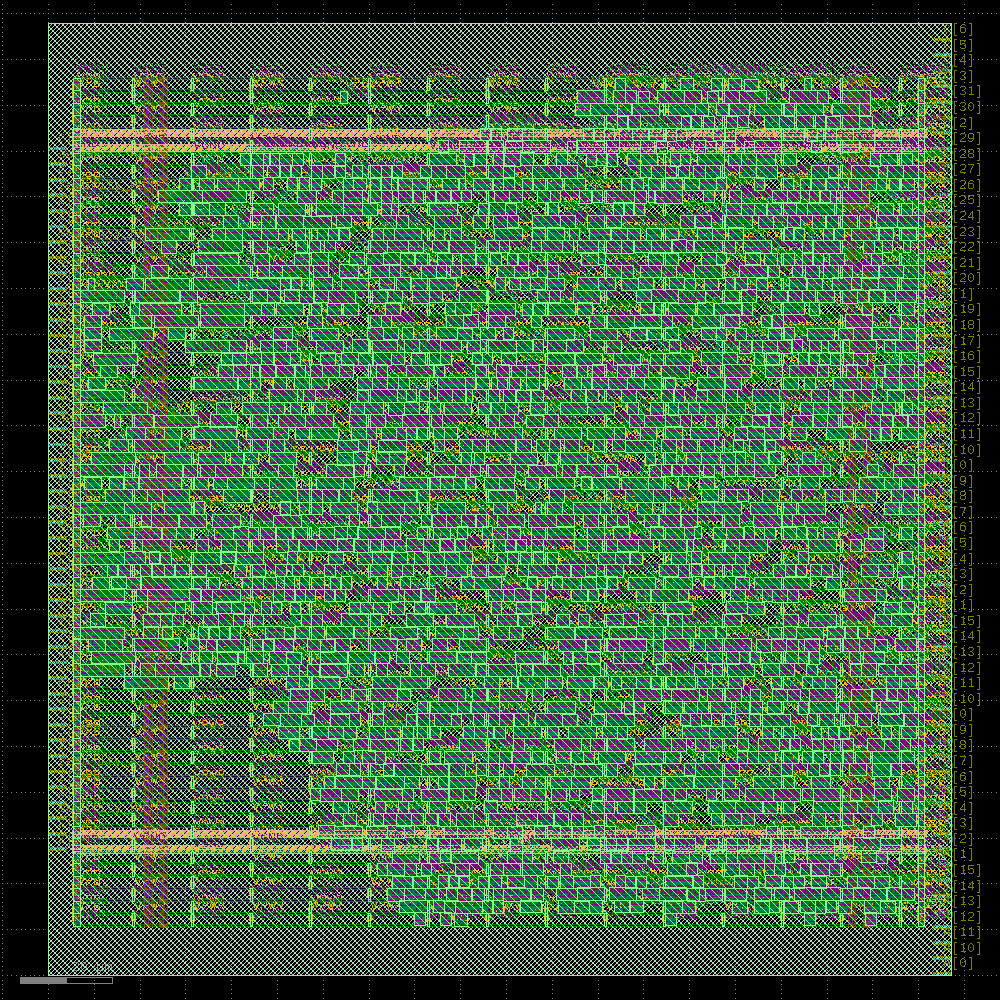

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:01:01] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=340974;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=717811;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:01:01] VERBOSE  Logging subprocess to ]8;id=242378;file:///tmp/openlane_klayout_tmp_w2acua8x/klayout-render.log\..]8;;\]8;id=536548;file:///tmp/openlane_klayout_tmp_w2acua8x/klayout-render.log\/tmp/openlane_klayout_tmp_w2acua8x/]8;;\]8;id=871539;file:///tmp/openlane_klayout_tmp_w2acua8x/klayout-render.log\klayout-render.log]8;;\…     ]8;id=568618;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=476026;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 14.19s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
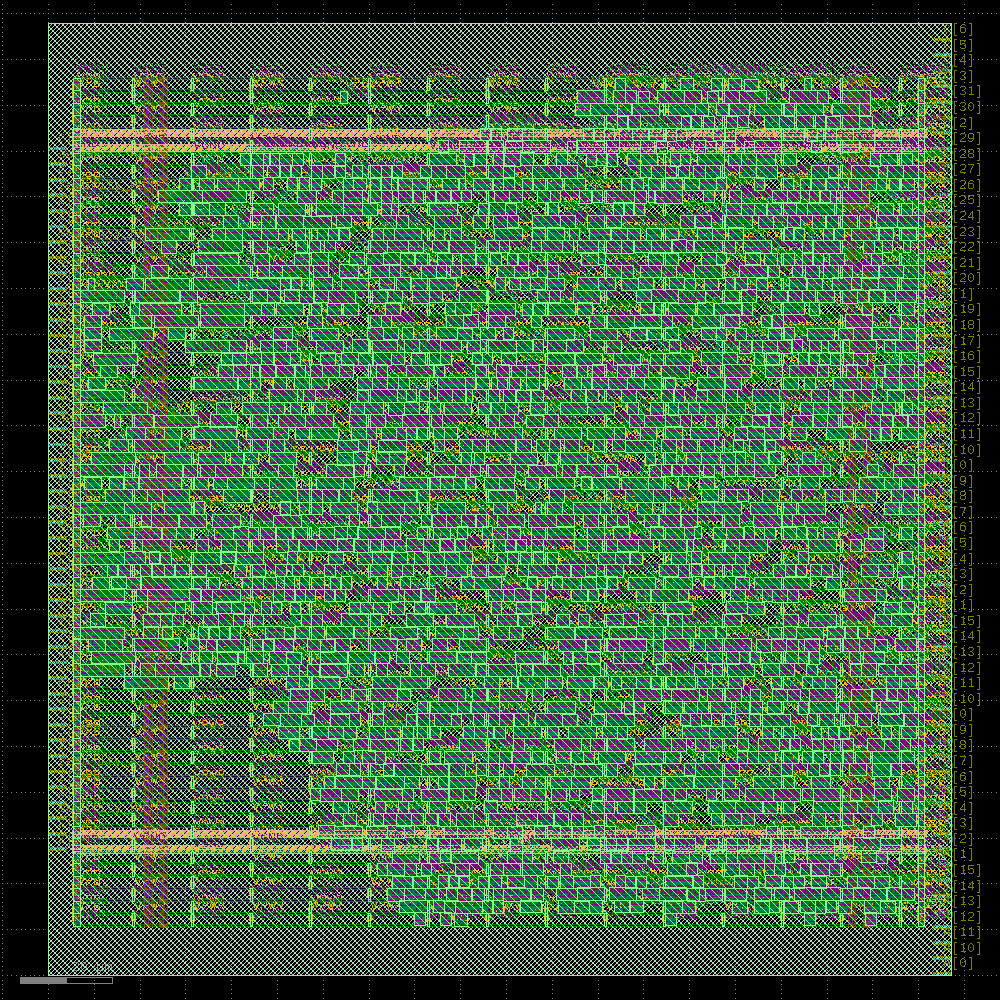

In [45]:
# Clock Tree Synthesis
print("Running CTS...")
run_step("OpenROAD.CTS")

Running Global Routing...


───────────────────────────────────────────────── Global Routing ──────────────────────────────────────────────────

[10:01:03] VERBOSE  Running 'OpenROAD.GlobalRouting'…                                                  ]8;id=227937;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=819795;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:01:03] VERBOSE  Logging subprocess to                                                              ]8;id=692626;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=880097;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=607975;file:///content/openlane_run/26-openroad-globalrouting/openroad-globalrouting.log\openlane_run/]8;;\]8;id=173746;file:///content/openlane_run/26-openroad-globalrouting/openroad-globalrouting.log\26]8;;\]8;id=607975;file:///content/openlane_run/26-openroad-globalrouting/openroad-globalrouting.log\-openroad-globalrouting/openroad-globalrouting.log]8;;\…                             

Reading OpenROAD database at '/content/openlane_run/25-openroad-cts/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

-congestion_iterations 50 -verbose

[INFO GRT-0020] Min routing layer: met1

[INFO GRT-0021] Max routing layer: met5

[INFO GRT-0022] Global adjustment: 30%

[INFO GRT-0023] Grid origin: (0, 0)

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0088] Layer li1     Track-Pitch = 0.4600  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met1    Track-Pitch = 0.3400  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met2    Track-Pitch = 0.4600  line-2-Via Pitch: 0.3500

[INFO GRT-0088] Layer met3    Track-Pitch = 0.6800  line-2-Via Pitch: 0.6150

[INFO GRT-0088] Layer met4    Track-Pitch = 0.9200  line-2-Via Pitch: 1.0400

[INFO GRT-0088] Layer met5    Track-Pitch = 3.4000  line-2-Via Pitch: 3.1100

[INFO GRT-0019] Found 6 clock nets.

[INFO GRT-0001] Minimum degree: 2

[INFO GRT-0002] Maximum degree: 33

[INFO GRT-0003] Macros: 0

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0004] Blockages: 1793

[INFO GRT-0053] Routing resources analysis:

Routing      Original      Derated      Resource

Layer     Direction    Resources     Resources    Reduction (%)

---------------------------------------------------------------

li1        Vertical            0             0          0.00%

met1       Horizontal      16844          8223          51.18%

met2       Vertical        12870          8268          35.76%

met3       Horizontal       8408          5443          35.26%

met4       Vertical         5202          3146          39.52%

met5       Horizontal       1676           756          54.89%

---------------------------------------------------------------

[INFO GRT-0197] Via related to pin nodes: 9689

[INFO GRT-0198] Via related Steiner nodes: 101

[INFO GRT-0199] Via filling finished.

[INFO GRT-0111] Final number of vias: 11732

[INFO GRT-0112] Final usage 3D: 40986

[INFO GRT-0096] Final congestion report:

Layer         Resource        Demand        Usage (%)    Max H / Max V / Total Overflow

---------------------------------------------------------------------------------------

li1                  0             0            0.00%             0 /  0 /  0

met1              8223          2751           33.45%             0 /  0 /  0

met2              8268          2664           32.22%             0 /  0 /  0

met3              5443           331            6.08%             0 /  0 /  0

met4              3146            44            1.40%             0 /  0 /  0

met5               756             0            0.00%             0 /  0 /  0

---------------------------------------------------------------------------------------

Total            25836          5790           22.41%             0 /  0 /  0

[INFO GRT-0018] Total wirelength: 67468 um

[INFO GRT-0014] Routed nets: 1905

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/26-openroad-globalrouting/tapeout_vedic_mac_16.odb'…

Writing layout to '/content/openlane_run/26-openroad-globalrouting/tapeout_vedic_mac_16.def'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:01:04] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=511657;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=773378;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:01:04] VERBOSE  Logging subprocess to ]8;id=938791;file:///tmp/openlane_klayout_tmp_k2qclh8i/klayout-render.log\..]8;;\]8;id=607228;file:///tmp/openlane_klayout_tmp_k2qclh8i/klayout-render.log\/tmp/openlane_klayout_tmp_k2qclh8i/]8;;\]8;id=163426;file:///tmp/openlane_klayout_tmp_k2qclh8i/klayout-render.log\klayout-render.log]8;;\…     ]8;id=642025;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=145145;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.63s
#### Views updated:
* Design Exchange Format
* OpenDB Database
#### Preview:
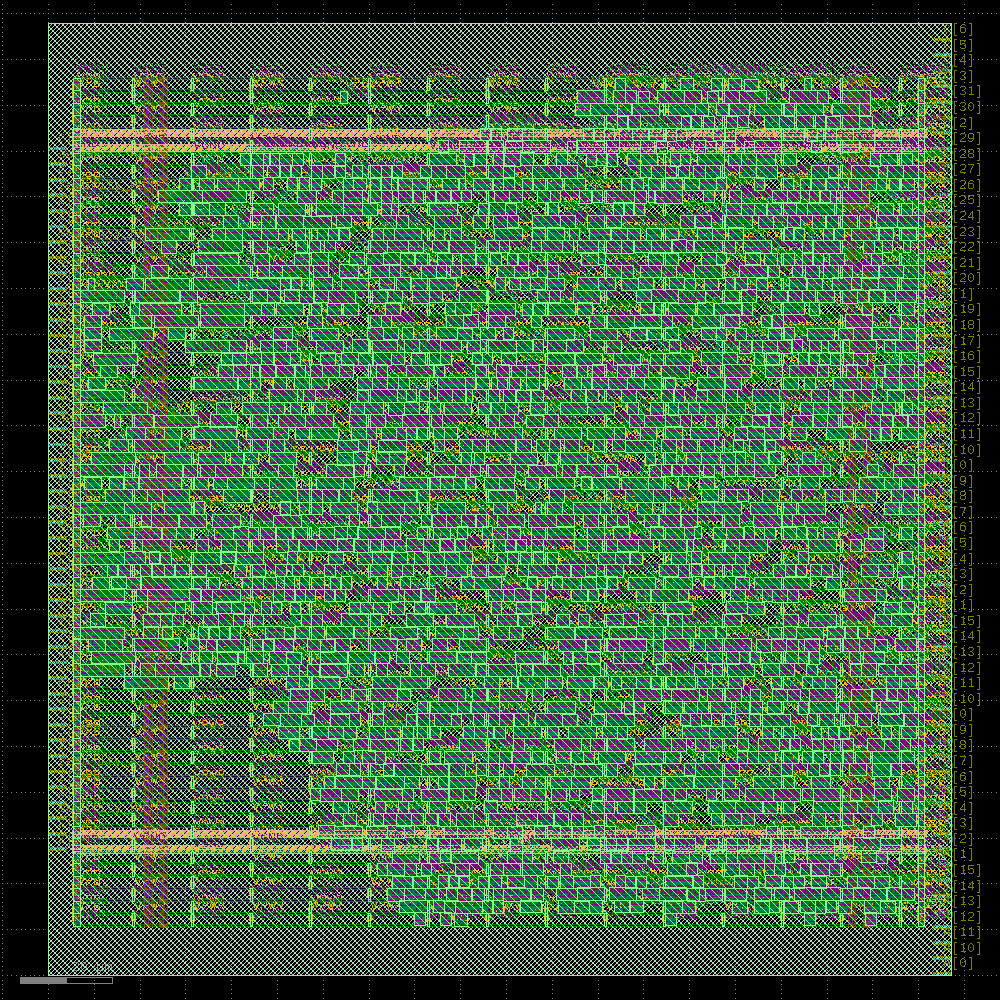

In [46]:
# Global Routing
print("Running Global Routing...")
run_step("OpenROAD.GlobalRouting", show=False)

Running Detailed Routing (may take a few minutes)...


──────────────────────────────────────────────── Detailed Routing ─────────────────────────────────────────────────

[10:01:05] VERBOSE  Running 'OpenROAD.DetailedRouting'…                                                ]8;id=966534;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=717380;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:01:05] INFO     Running TritonRoute with 2 threads…                                            ]8;id=962316;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=203127;file:///content/openlane_ipynb/openlane/steps/openroad.py#1619\1619]8;;\

[10:01:05] VERBOSE  Logging subprocess to                                                              ]8;id=61022;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=626593;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=612787;file:///content/openlane_run/27-openroad-detailedrouting/openroad-detailedrouting.log\openlane_run/]8;;\]8;id=737596;file:///content/openlane_run/27-openroad-detailedrouting/openroad-detailedrouting.log\27]8;;\]8;id=612787;file:///content/openlane_run/27-openroad-detailedrouting/openroad-detailedrouting.log\-openroad-detailedrouting/openroad-detailedrouting.log]8;;\…                         

Reading OpenROAD database at '/content/openlane_run/26-openroad-globalrouting/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO ORD-0030] Using 2 thread(s).

[INFO DRT-0149] Reading tech and libs.

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=53984;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=613033;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=377953;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=376454;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=65961;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=336620;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=925427;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=619014;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=95887;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=713155;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=30502;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=682945;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=211968;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=649178;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=411996;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=431927;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=512704;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=571346;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

[10:01:06] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=274365;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=594482;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

Units:                1000

Number of layers:     13

Number of macros:     441

Number of vias:       29

Number of viarulegen: 25

[INFO DRT-0150] Reading design.

Design:                   tapeout_vedic_mac_16

Die area:                 ( 0 0 ) ( 197220 207940 )

Number of track patterns: 12

Number of DEF vias:       0

Number of components:     2459

Number of terminals:      109

Number of snets:          2

Number of nets:           1905

[INFO DRT-0167] List of default vias:

Layer via

default via: M1M2_PR

Layer via2

default via: M2M3_PR

Layer via3

default via: M3M4_PR

Layer via4

default via: M4M5_PR

[INFO DRT-0162] Library cell analysis.

[INFO DRT-0163] Instance analysis.

[INFO DRT-0164] Number of unique instances = 172.

[INFO DRT-0168] Init region query.

[INFO DRT-0024]   Complete FR_MASTERSLICE.

[INFO DRT-0024]   Complete Fr_VIA.

[INFO DRT-0024]   Complete li1.

[INFO DRT-0024]   Complete mcon.

[INFO DRT-0024]   Complete met1.

[INFO DRT-0024]   Complete via.

[INFO DRT-0024]   Complete met2.

[INFO DRT-0024]   Complete via2.

[INFO DRT-0024]   Complete met3.

[INFO DRT-0024]   Complete via3.

[INFO DRT-0024]   Complete met4.

[INFO DRT-0024]   Complete via4.

[INFO DRT-0024]   Complete met5.

[INFO DRT-0033] FR_MASTERSLICE shape region query size = 0.

[INFO DRT-0033] FR_VIA shape region query size = 0.

[INFO DRT-0033] li1 shape region query size = 53570.

[INFO DRT-0033] mcon shape region query size = 0.

[INFO DRT-0033] met1 shape region query size = 6915.

[INFO DRT-0033] via shape region query size = 690.

[INFO DRT-0033] met2 shape region query size = 414.

[INFO DRT-0033] via2 shape region query size = 552.

[INFO DRT-0033] met3 shape region query size = 521.

[INFO DRT-0033] via3 shape region query size = 552.

[INFO DRT-0033] met4 shape region query size = 154.

[INFO DRT-0033] via4 shape region query size = 8.

[INFO DRT-0033] met5 shape region query size = 16.

[INFO DRT-0165] Start pin access.

[INFO DRT-0078]   Complete 693 pins.

[INFO DRT-0079]   Complete 100 unique inst patterns.

[INFO DRT-0081]   Complete 166 unique inst patterns.

[INFO DRT-0084]   Complete 1110 groups.

#scanned instances     = 2459

#unique  instances     = 172

#stdCellGenAp          = 4964

#stdCellValidPlanarAp  = 44

#stdCellValidViaAp     = 3880

#stdCellPinNoAp        = 0

#stdCellPinCnt         = 6518

#instTermValidViaApCnt = 0

#macroGenAp            = 0

#macroValidPlanarAp    = 0

#macroValidViaAp       = 0

#macroNoAp             = 0

[INFO DRT-0166] Complete pin access.

[INFO DRT-0267] cpu time = 00:00:58, elapsed time = 00:00:37, memory = 126.44 (MB), peak = 253.19 (MB)

Number of guides:     12233

[INFO DRT-0169] Post process guides.

[INFO DRT-0176] GCELLGRID X 0 DO 28 STEP 6900 ;

[INFO DRT-0177] GCELLGRID Y 0 DO 30 STEP 6900 ;

[INFO DRT-0028]   Complete FR_MASTERSLICE.

[INFO DRT-0028]   Complete Fr_VIA.

[INFO DRT-0028]   Complete li1.

[INFO DRT-0028]   Complete mcon.

[INFO DRT-0028]   Complete met1.

[INFO DRT-0028]   Complete via.

[INFO DRT-0028]   Complete met2.

[INFO DRT-0028]   Complete via2.

[INFO DRT-0028]   Complete met3.

[INFO DRT-0028]   Complete via3.

[INFO DRT-0028]   Complete met4.

[INFO DRT-0028]   Complete via4.

[INFO DRT-0028]   Complete met5.

[INFO DRT-0178] Init guide query.

[INFO DRT-0035]   Complete FR_MASTERSLICE (guide).

[INFO DRT-0035]   Complete Fr_VIA (guide).

[INFO DRT-0035]   Complete li1 (guide).

[INFO DRT-0035]   Complete mcon (guide).

[INFO DRT-0035]   Complete met1 (guide).

[INFO DRT-0035]   Complete via (guide).

[INFO DRT-0035]   Complete met2 (guide).

[INFO DRT-0035]   Complete via2 (guide).

[INFO DRT-0035]   Complete met3 (guide).

[INFO DRT-0035]   Complete via3 (guide).

[INFO DRT-0035]   Complete met4 (guide).

[INFO DRT-0035]   Complete via4 (guide).

[INFO DRT-0035]   Complete met5 (guide).

[INFO DRT-0036] FR_MASTERSLICE guide region query size = 0.

[INFO DRT-0036] FR_VIA guide region query size = 0.

[INFO DRT-0036] li1 guide region query size = 4537.

[INFO DRT-0036] mcon guide region query size = 0.

[INFO DRT-0036] met1 guide region query size = 3296.

[INFO DRT-0036] via guide region query size = 0.

[INFO DRT-0036] met2 guide region query size = 1587.

[INFO DRT-0036] via2 guide region query size = 0.

[INFO DRT-0036] met3 guide region query size = 124.

[INFO DRT-0036] via3 guide region query size = 0.

[INFO DRT-0036] met4 guide region query size = 5.

[INFO DRT-0036] via4 guide region query size = 0.

[INFO DRT-0036] met5 guide region query size = 0.

[INFO DRT-0179] Init gr pin query.

[INFO DRT-0245] skipped writing guide updates to database.

[INFO DRT-0185] Post process initialize RPin region query.

[INFO DRT-0181] Start track assignment.

[INFO DRT-0184] Done with 6129 vertical wires in 1 frboxes and 3420 horizontal wires in 1 frboxes.

[INFO DRT-0186] Done with 499 vertical wires in 1 frboxes and 999 horizontal wires in 1 frboxes.

[INFO DRT-0182] Complete track assignment.

[INFO DRT-0267] cpu time = 00:00:01, elapsed time = 00:00:01, memory = 144.55 (MB), peak = 253.19 (MB)

[INFO DRT-0187] Start routing data preparation.

[INFO DRT-0267] cpu time = 00:00:00, elapsed time = 00:00:00, memory = 144.55 (MB), peak = 253.19 (MB)

[INFO DRT-0194] Start detail routing.

[INFO DRT-0195] Start 0th optimization iteration.

Completing 10% with 0 violations.

elapsed time = 00:00:01, memory = 166.29 (MB).

Completing 20% with 0 violations.

elapsed time = 00:00:01, memory = 166.35 (MB).

Completing 30% with 87 violations.

elapsed time = 00:00:06, memory = 193.92 (MB).

Completing 40% with 87 violations.

elapsed time = 00:00:07, memory = 194.70 (MB).

Completing 50% with 87 violations.

elapsed time = 00:00:11, memory = 180.71 (MB).

Completing 60% with 204 violations.

elapsed time = 00:00:17, memory = 215.82 (MB).

Completing 70% with 204 violations.

elapsed time = 00:00:19, memory = 202.86 (MB).

Completing 80% with 204 violations.

elapsed time = 00:00:21, memory = 207.12 (MB).

Completing 90% with 351 violations.

elapsed time = 00:00:33, memory = 233.45 (MB).

Completing 100% with 519 violations.

elapsed time = 00:00:39, memory = 225.43 (MB).

[INFO DRT-0199]   Number of violations = 711.

Viol/Layer         li1   mcon   met1    via   met2   met3

Cut Spacing          0      4      0      0      0      0

Metal Spacing       32      0    156      0     38      4

Min Hole             0      0      1      0      0      0

Recheck              0      0    121      0     71      0

Short                0      0    264      1     19      0

[INFO DRT-0267] cpu time = 00:01:01, elapsed time = 00:00:41, memory = 547.82 (MB), peak = 547.59 (MB)

Total wire length = 42596 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 20177 um.

Total wire length on LAYER met2 = 18442 um.

Total wire length on LAYER met3 = 3696 um.

Total wire length on LAYER met4 = 280 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 12777.

Up-via summary (total 12777):

------------------------

FR_MASTERSLICE        0

li1     6389

met1     6239

met2      140

met3        9

met4        0

------------------------

12777

[INFO DRT-0195] Start 1st optimization iteration.

Completing 10% with 711 violations.

elapsed time = 00:00:01, memory = 547.82 (MB).

Completing 20% with 711 violations.

elapsed time = 00:00:01, memory = 547.82 (MB).

Completing 30% with 711 violations.

elapsed time = 00:00:03, memory = 547.82 (MB).

Completing 40% with 616 violations.

elapsed time = 00:00:06, memory = 557.95 (MB).

Completing 50% with 616 violations.

elapsed time = 00:00:09, memory = 557.95 (MB).

Completing 60% with 616 violations.

elapsed time = 00:00:10, memory = 557.95 (MB).

Completing 70% with 512 violations.

elapsed time = 00:00:18, memory = 576.12 (MB).

Completing 80% with 512 violations.

elapsed time = 00:00:19, memory = 576.12 (MB).

Completing 90% with 350 violations.

elapsed time = 00:00:26, memory = 557.95 (MB).

Completing 100% with 204 violations.

elapsed time = 00:00:32, memory = 557.95 (MB).

[INFO DRT-0199]   Number of violations = 204.

Viol/Layer        mcon   met1   met2

Cut Spacing          1      0      0

Metal Spacing        0     51     12

Short                0    138      2

[INFO DRT-0267] cpu time = 00:00:48, elapsed time = 00:00:32, memory = 558.11 (MB), peak = 575.84 (MB)

Total wire length = 42241 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 19979 um.

Total wire length on LAYER met2 = 18267 um.

Total wire length on LAYER met3 = 3715 um.

Total wire length on LAYER met4 = 278 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 12652.

Up-via summary (total 12652):

------------------------

FR_MASTERSLICE        0

li1     6379

met1     6114

met2      150

met3        9

met4        0

------------------------

12652

[INFO DRT-0195] Start 2nd optimization iteration.

Completing 10% with 204 violations.

elapsed time = 00:00:00, memory = 558.11 (MB).

Completing 20% with 204 violations.

elapsed time = 00:00:01, memory = 558.11 (MB).

Completing 30% with 204 violations.

elapsed time = 00:00:04, memory = 558.11 (MB).

Completing 40% with 205 violations.

elapsed time = 00:00:05, memory = 558.11 (MB).

Completing 50% with 205 violations.

elapsed time = 00:00:10, memory = 558.11 (MB).

Completing 60% with 205 violations.

elapsed time = 00:00:15, memory = 558.11 (MB).

Completing 70% with 220 violations.

elapsed time = 00:00:18, memory = 576.83 (MB).

Completing 80% with 220 violations.

elapsed time = 00:00:19, memory = 558.11 (MB).

Completing 90% with 202 violations.

elapsed time = 00:00:22, memory = 558.11 (MB).

Completing 100% with 162 violations.

elapsed time = 00:00:25, memory = 558.11 (MB).

[INFO DRT-0199]   Number of violations = 162.

Viol/Layer        met1   met2

Metal Spacing       38      8

Short              115      1

[INFO DRT-0267] cpu time = 00:00:41, elapsed time = 00:00:25, memory = 558.47 (MB), peak = 576.51 (MB)

Total wire length = 42111 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 19793 um.

Total wire length on LAYER met2 = 18288 um.

Total wire length on LAYER met3 = 3743 um.

Total wire length on LAYER met4 = 285 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 12712.

Up-via summary (total 12712):

------------------------

FR_MASTERSLICE        0

li1     6379

met1     6169

met2      154

met3       10

met4        0

------------------------

12712

[INFO DRT-0195] Start 3rd optimization iteration.

Completing 10% with 162 violations.

elapsed time = 00:00:01, memory = 558.47 (MB).

Completing 20% with 162 violations.

elapsed time = 00:00:01, memory = 558.47 (MB).

Completing 30% with 151 violations.

elapsed time = 00:00:02, memory = 558.47 (MB).

Completing 40% with 151 violations.

elapsed time = 00:00:03, memory = 558.47 (MB).

Completing 50% with 151 violations.

elapsed time = 00:00:04, memory = 558.47 (MB).

Completing 60% with 132 violations.

elapsed time = 00:00:06, memory = 558.48 (MB).

Completing 70% with 132 violations.

elapsed time = 00:00:06, memory = 558.48 (MB).

Completing 80% with 132 violations.

elapsed time = 00:00:07, memory = 558.48 (MB).

Completing 90% with 65 violations.

elapsed time = 00:00:10, memory = 562.90 (MB).

Completing 100% with 0 violations.

elapsed time = 00:00:12, memory = 562.90 (MB).

[INFO DRT-0199]   Number of violations = 0.

[INFO DRT-0267] cpu time = 00:00:19, elapsed time = 00:00:12, memory = 562.90 (MB), peak = 576.51 (MB)

Total wire length = 41977 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 19046 um.

Total wire length on LAYER met2 = 18286 um.

Total wire length on LAYER met3 = 4340 um.

Total wire length on LAYER met4 = 304 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 12859.

Up-via summary (total 12859):

------------------------

FR_MASTERSLICE        0

li1     6379

met1     6211

met2      258

met3       11

met4        0

------------------------

12859

[INFO DRT-0198] Complete detail routing.

Total wire length = 41977 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 19046 um.

Total wire length on LAYER met2 = 18286 um.

Total wire length on LAYER met3 = 4340 um.

Total wire length on LAYER met4 = 304 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 12859.

Up-via summary (total 12859):

------------------------

FR_MASTERSLICE        0

li1     6379

met1     6211

met2      258

met3       11

met4        0

------------------------

12859

[INFO DRT-0267] cpu time = 00:02:51, elapsed time = 00:01:52, memory = 562.90 (MB), peak = 576.51 (MB)

[INFO DRT-0180] Post processing.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/27-openroad-detailedrouting/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/27-openroad-detailedrouting/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/27-openroad-detailedrouting/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/27-openroad-detailedrouting/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/27-openroad-detailedrouting/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:03:39] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=784582;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=322523;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:03:39] VERBOSE  Logging subprocess to ]8;id=347131;file:///tmp/openlane_klayout_tmp_ullql_px/klayout-render.log\..]8;;\]8;id=815689;file:///tmp/openlane_klayout_tmp_ullql_px/klayout-render.log\/tmp/openlane_klayout_tmp_ullql_px/]8;;\]8;id=283884;file:///tmp/openlane_klayout_tmp_ullql_px/klayout-render.log\klayout-render.log]8;;\…     ]8;id=418547;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=13699;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 153.33s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
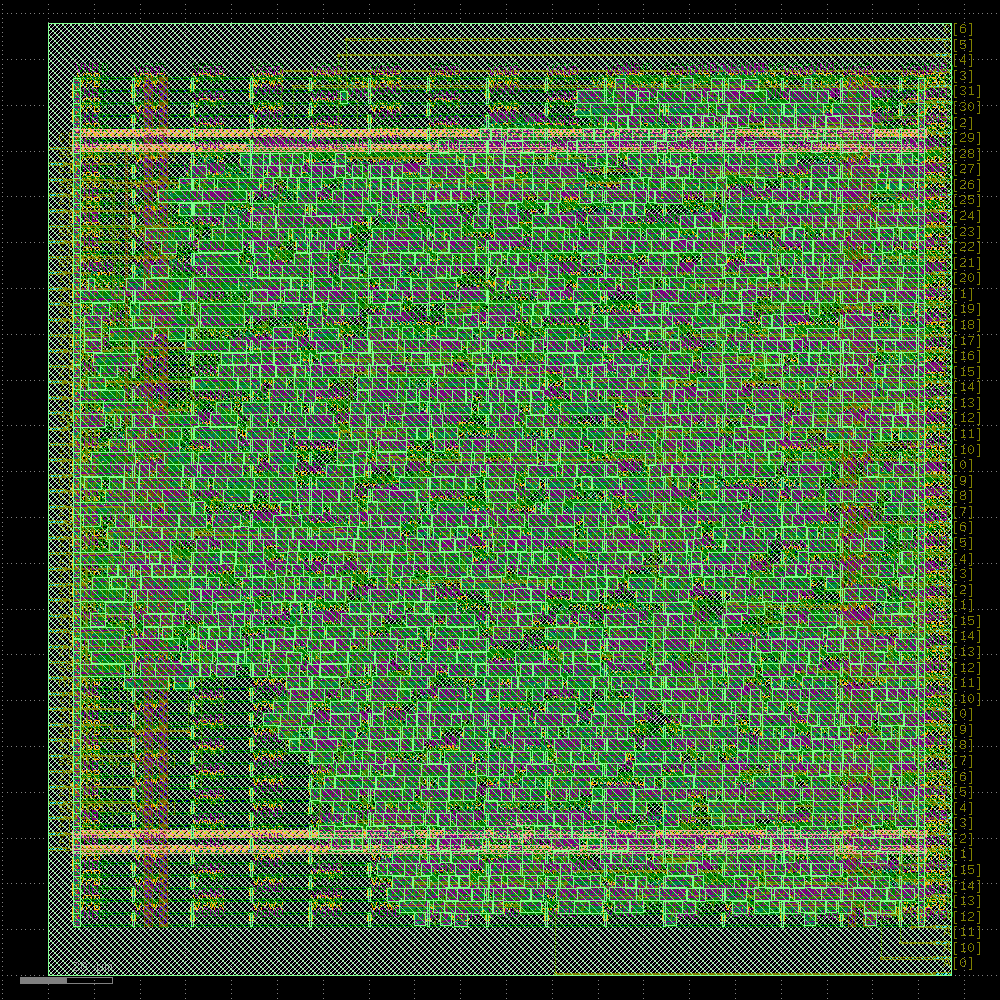

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:03:41] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=418403;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=452599;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:03:41] VERBOSE  Logging subprocess to ]8;id=903105;file:///tmp/openlane_klayout_tmp_nldf31n_/klayout-render.log\..]8;;\]8;id=993283;file:///tmp/openlane_klayout_tmp_nldf31n_/klayout-render.log\/tmp/openlane_klayout_tmp_nldf31n_/]8;;\]8;id=374765;file:///tmp/openlane_klayout_tmp_nldf31n_/klayout-render.log\klayout-render.log]8;;\…     ]8;id=555574;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=132418;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 153.33s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
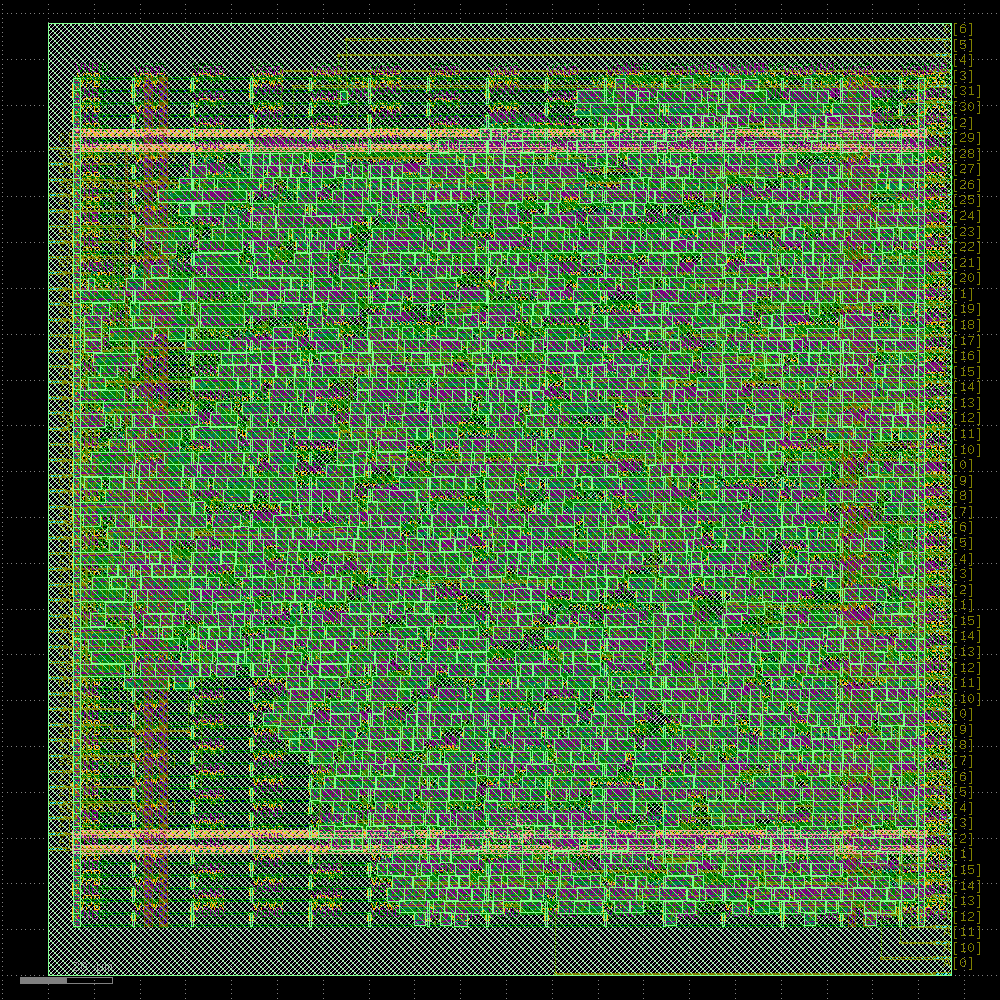

In [47]:
# Detailed Routing
print("Running Detailed Routing (may take a few minutes)...")
run_step("OpenROAD.DetailedRouting")

Running Fill Insertion...


───────────────────────────────────────────────── Fill Insertion ──────────────────────────────────────────────────

[10:03:42] VERBOSE  Running 'OpenROAD.FillInsertion'…                                                  ]8;id=757829;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=870284;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:03:42] VERBOSE  Logging subprocess to                                                              ]8;id=588434;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=287530;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=226980;file:///content/openlane_run/28-openroad-fillinsertion/openroad-fillinsertion.log\openlane_run/]8;;\]8;id=44689;file:///content/openlane_run/28-openroad-fillinsertion/openroad-fillinsertion.log\28]8;;\]8;id=226980;file:///content/openlane_run/28-openroad-fillinsertion/openroad-fillinsertion.log\-openroad-fillinsertion/openroad-fillinsertion.log]8;;\…                             

Reading OpenROAD database at '/content/openlane_run/27-openroad-detailedrouting/tapeout_vedic_mac_16.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

sky130_ef_sc_hd__decap_12 sky130_fd_sc_hd__decap_8 sky130_fd_sc_hd__decap_6 sky130_fd_sc_hd__decap_4               
sky130_fd_sc_hd__decap_3 sky130_fd_sc_hd__fill*

[INFO DPL-0001] Placed 2193 filler instances.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/28-openroad-fillinsertion/tapeout_vedic_mac_16.odb'…

Writing netlist to '/content/openlane_run/28-openroad-fillinsertion/tapeout_vedic_mac_16.nl.v'…

Writing powered netlist to '/content/openlane_run/28-openroad-fillinsertion/tapeout_vedic_mac_16.pnl.v'…

Writing layout to '/content/openlane_run/28-openroad-fillinsertion/tapeout_vedic_mac_16.def'…

Writing timing constraints to '/content/openlane_run/28-openroad-fillinsertion/tapeout_vedic_mac_16.sdc'…

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:03:44] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=855984;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=916225;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:03:44] VERBOSE  Logging subprocess to ]8;id=126569;file:///tmp/openlane_klayout_tmp_745uxn_7/klayout-render.log\..]8;;\]8;id=841503;file:///tmp/openlane_klayout_tmp_745uxn_7/klayout-render.log\/tmp/openlane_klayout_tmp_745uxn_7/]8;;\]8;id=911713;file:///tmp/openlane_klayout_tmp_745uxn_7/klayout-render.log\klayout-render.log]8;;\…     ]8;id=470069;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=513592;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.02s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
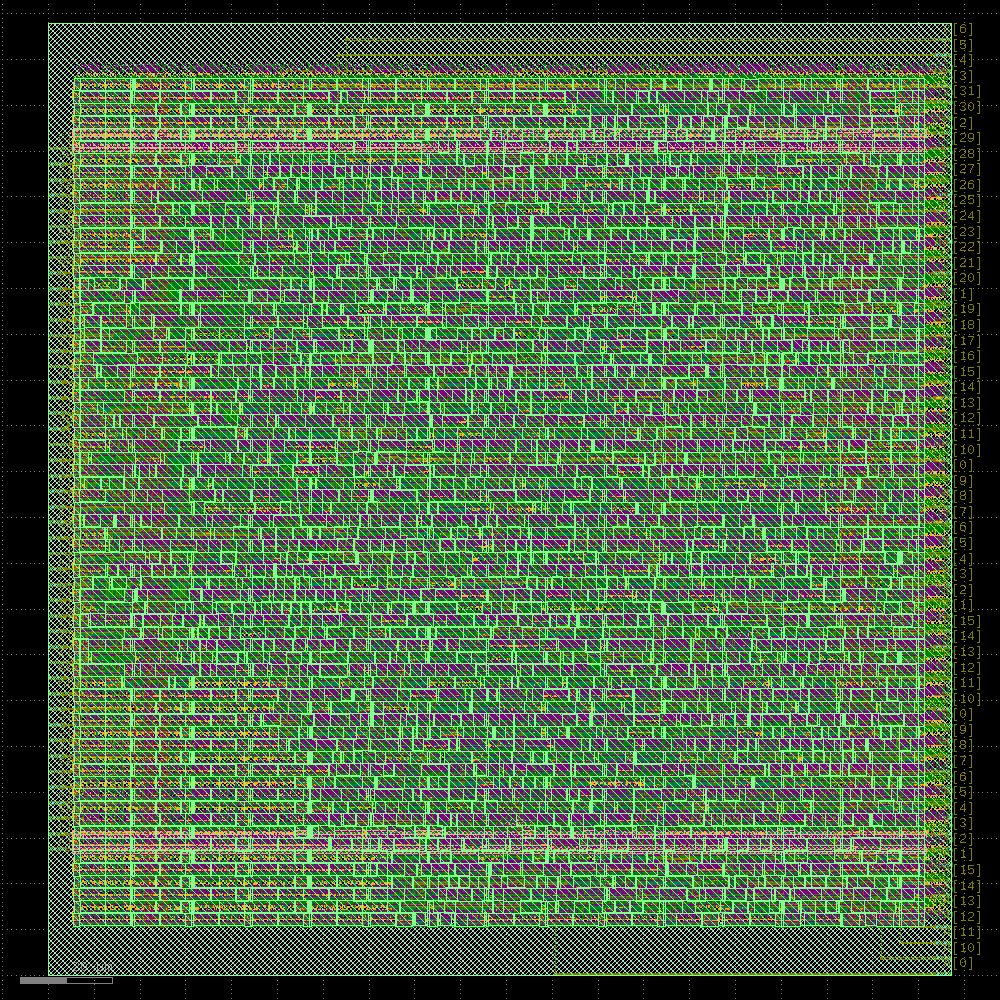

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:03:45] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=934694;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=593109;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:03:45] VERBOSE  Logging subprocess to ]8;id=61023;file:///tmp/openlane_klayout_tmp_nau27ng9/klayout-render.log\..]8;;\]8;id=99942;file:///tmp/openlane_klayout_tmp_nau27ng9/klayout-render.log\/tmp/openlane_klayout_tmp_nau27ng9/]8;;\]8;id=265347;file:///tmp/openlane_klayout_tmp_nau27ng9/klayout-render.log\klayout-render.log]8;;\…     ]8;id=371281;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=56893;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.02s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
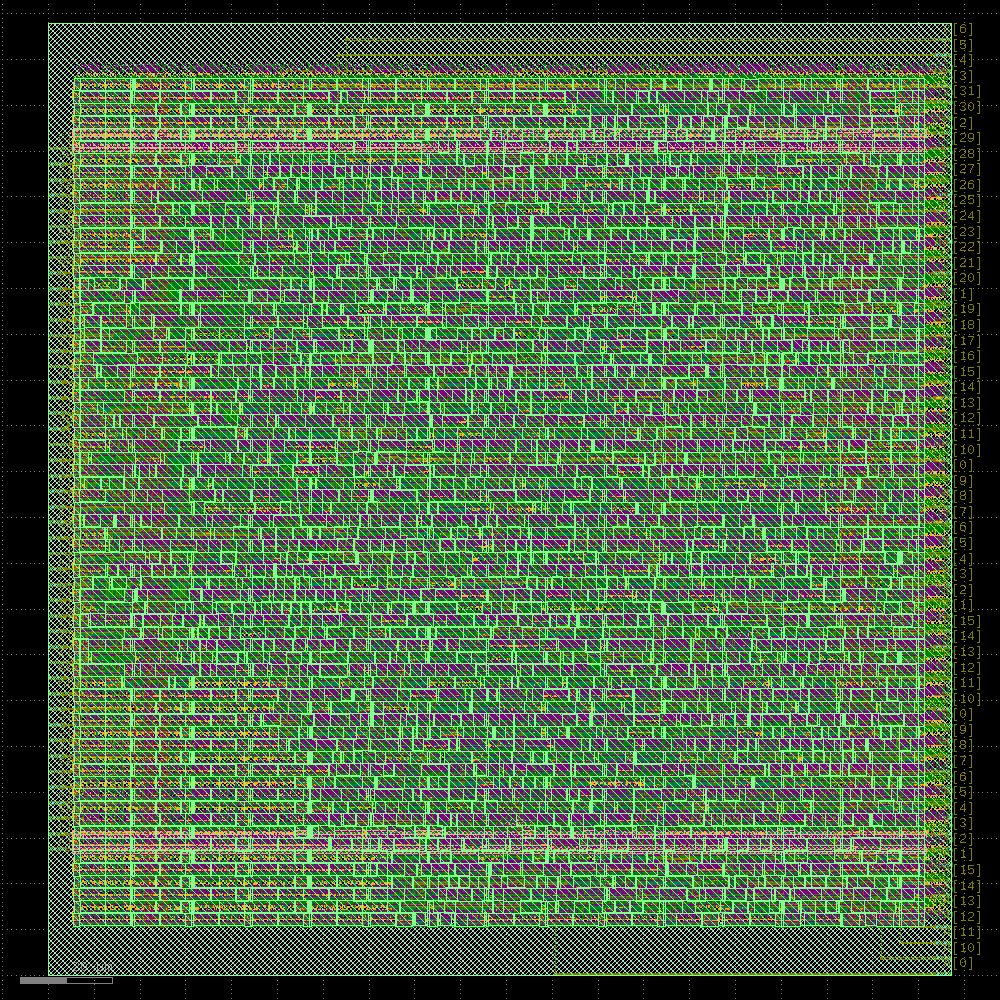

In [48]:
# Fill Insertion
print("Running Fill Insertion...")
run_step("OpenROAD.FillInsertion")

In [49]:
# RC Extraction
print("Running RC Extraction...")
run_step("OpenROAD.RCX", show=False)

Running RC Extraction...


─────────────────────────────────── Parasitic Resistance/Capacitance Extraction ───────────────────────────────────

[10:03:46] VERBOSE  Running 'OpenROAD.RCX'…                                                            ]8;id=560253;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=222038;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:03:46] INFO     Running RCX for corners matching nom_*                                         ]8;id=711474;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=705646;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/29-openroad-rcx/nom/rcx.log)…                                           

[10:03:46] INFO     Running RCX for corners matching min_*                                         ]8;id=482045;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=167532;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/29-openroad-rcx/min/rcx.log)…                                           

[10:03:46] VERBOSE  Logging subprocess to ]8;id=983050;file:///content/openlane_run/29-openroad-rcx/nom/rcx.log\openlane_run/]8;;\]8;id=753639;file:///content/openlane_run/29-openroad-rcx/nom/rcx.log\29]8;;\]8;id=983050;file:///content/openlane_run/29-openroad-rcx/nom/rcx.log\-openroad-rcx/nom/rcx.log]8;;\…                    ]8;id=570070;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=539048;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[10:03:46] VERBOSE  Logging subprocess to ]8;id=466092;file:///content/openlane_run/29-openroad-rcx/min/rcx.log\openlane_run/]8;;\]8;id=620296;file:///content/openlane_run/29-openroad-rcx/min/rcx.log\29]8;;\]8;id=466092;file:///content/openlane_run/29-openroad-rcx/min/rcx.log\-openroad-rcx/min/rcx.log]8;;\…                    ]8;id=995244;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=392681;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[10:03:48] INFO     Finished RCX for corners matching nom_*.                                       ]8;id=59842;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=501770;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[10:03:48] INFO     Running RCX for corners matching max_*                                         ]8;id=899568;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=284201;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/29-openroad-rcx/max/rcx.log)…                                           

[10:03:48] VERBOSE  Logging subprocess to ]8;id=752110;file:///content/openlane_run/29-openroad-rcx/max/rcx.log\openlane_run/]8;;\]8;id=136803;file:///content/openlane_run/29-openroad-rcx/max/rcx.log\29]8;;\]8;id=752110;file:///content/openlane_run/29-openroad-rcx/max/rcx.log\-openroad-rcx/max/rcx.log]8;;\…                    ]8;id=682348;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=198738;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[10:03:48] INFO     Finished RCX for corners matching min_*.                                       ]8;id=526260;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=970852;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[10:03:49] INFO     Finished RCX for corners matching max_*.                                       ]8;id=576744;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=782565;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

#### Time Elapsed: 3.08s
#### Views updated:
* Standard Parasitics Extraction Format


In [50]:
# Static Timing Analysis
print("Running STA...")
run_step("OpenROAD.STAPostPNR", show=False)

Running STA...


──────────────────────────────────────── Static Timing Analysis (Post-PnR) ────────────────────────────────────────

[10:03:49] VERBOSE  Running 'OpenROAD.STAPostPNR'…                                                     ]8;id=203346;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=256506;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:03:49] INFO     Starting STA for the nom_tt_025C_1v80 timing corner…                            ]8;id=408733;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=934028;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:03:49] INFO     Starting STA for the nom_ss_100C_1v60 timing corner…                            ]8;id=620046;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=670464;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:03:49] VERBOSE  Logging subprocess to                                                              ]8;id=106257;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=193016;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=702316;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=18416;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\30]8;;\]8;id=702316;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\-openroad-stapostpnr/nom_tt_025C_1v80/sta.log]8;;\…                                  

[10:03:49] VERBOSE  Logging subprocess to                                                              ]8;id=475658;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=300374;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=408268;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=708581;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\30]8;;\]8;id=408268;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\-openroad-stapostpnr/nom_ss_100C_1v60/sta.log]8;;\…                                  

[10:03:54] INFO     Finished STA for the nom_ss_100C_1v60 timing corner.                            ]8;id=43839;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=267586;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:03:54] VERBOSE  Logging subprocess to                                                              ]8;id=52108;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=693370;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=296574;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=953717;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\30]8;;\]8;id=296574;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[10:03:54] INFO     Finished STA for the nom_tt_025C_1v80 timing corner.                            ]8;id=397948;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=978988;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:03:54] VERBOSE  Logging subprocess to                                                              ]8;id=446527;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=289209;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=260442;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=110010;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\30]8;;\]8;id=260442;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[10:03:56] INFO     Starting STA for the nom_ff_n40C_1v95 timing corner…                            ]8;id=128784;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=873929;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:03:56] VERBOSE  Logging subprocess to                                                              ]8;id=605589;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=123958;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=828976;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=649389;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\30]8;;\]8;id=828976;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log]8;;\…                                  

[10:03:56] INFO     Starting STA for the min_tt_025C_1v80 timing corner…                            ]8;id=380497;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=298775;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:03:56] VERBOSE  Logging subprocess to                                                              ]8;id=871496;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=942745;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=784947;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=395417;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/sta.log\30]8;;\]8;id=784947;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/sta.log\-openroad-stapostpnr/min_tt_025C_1v80/sta.log]8;;\…                                  

[10:04:00] INFO     Finished STA for the min_tt_025C_1v80 timing corner.                            ]8;id=878042;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=917889;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:04:00] VERBOSE  Logging subprocess to                                                              ]8;id=945184;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=685713;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=862272;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=376321;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\30]8;;\]8;id=862272;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[10:04:01] INFO     Starting STA for the min_ss_100C_1v60 timing corner…                            ]8;id=631571;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=331521;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:04:01] VERBOSE  Logging subprocess to                                                              ]8;id=745452;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=639392;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=500929;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=6892;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/sta.log\30]8;;\]8;id=500929;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/sta.log\-openroad-stapostpnr/min_ss_100C_1v60/sta.log]8;;\…                                  

[10:04:01] INFO     Finished STA for the nom_ff_n40C_1v95 timing corner.                            ]8;id=278201;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=630713;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:04:01] VERBOSE  Logging subprocess to                                                              ]8;id=489133;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=243648;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=950759;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=519239;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\30]8;;\]8;id=950759;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[10:04:02] INFO     Starting STA for the min_ff_n40C_1v95 timing corner…                            ]8;id=256992;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=471216;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:04:02] VERBOSE  Logging subprocess to                                                              ]8;id=737374;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=560070;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=48514;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=734171;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\30]8;;\]8;id=48514;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\-openroad-stapostpnr/min_ff_n40C_1v95/sta.log]8;;\…                                  

[10:04:05] INFO     Finished STA for the min_ss_100C_1v60 timing corner.                            ]8;id=271249;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=734008;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:04:05] VERBOSE  Logging subprocess to                                                              ]8;id=894731;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=153901;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=520459;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=721557;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\30]8;;\]8;id=520459;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[10:04:07] INFO     Starting STA for the max_tt_025C_1v80 timing corner…                            ]8;id=536241;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=896209;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:04:07] VERBOSE  Logging subprocess to                                                              ]8;id=302952;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=207457;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=817412;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=821108;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/sta.log\30]8;;\]8;id=817412;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/sta.log\-openroad-stapostpnr/max_tt_025C_1v80/sta.log]8;;\…                                  

[10:04:09] INFO     Finished STA for the min_ff_n40C_1v95 timing corner.                            ]8;id=561281;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=880913;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:04:09] VERBOSE  Logging subprocess to                                                              ]8;id=367146;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=669629;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=964030;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=321332;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\30]8;;\]8;id=964030;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[10:04:10] INFO     Starting STA for the max_ss_100C_1v60 timing corner…                            ]8;id=853513;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=1788;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:04:10] VERBOSE  Logging subprocess to                                                              ]8;id=932370;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=234831;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=272555;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=311130;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/sta.log\30]8;;\]8;id=272555;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/sta.log\-openroad-stapostpnr/max_ss_100C_1v60/sta.log]8;;\…                                  

[10:04:12] INFO     Finished STA for the max_tt_025C_1v80 timing corner.                            ]8;id=537177;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=795848;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:04:12] VERBOSE  Logging subprocess to                                                              ]8;id=203409;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=88478;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=462232;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=637037;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\30]8;;\]8;id=462232;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[10:04:13] INFO     Starting STA for the max_ff_n40C_1v95 timing corner…                            ]8;id=934966;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=451514;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[10:04:13] VERBOSE  Logging subprocess to                                                              ]8;id=357925;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=173544;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=449309;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=138516;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\30]8;;\]8;id=449309;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\-openroad-stapostpnr/max_ff_n40C_1v95/sta.log]8;;\…                                  

[10:04:14] INFO     Finished STA for the max_ss_100C_1v60 timing corner.                            ]8;id=945610;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=349489;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:04:14] VERBOSE  Logging subprocess to                                                              ]8;id=245311;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=865309;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=980943;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=161275;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\30]8;;\]8;id=980943;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[10:04:17] INFO     Finished STA for the max_ff_n40C_1v95 timing corner.                            ]8;id=543558;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=991071;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[10:04:17] VERBOSE  Logging subprocess to                                                              ]8;id=155556;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=155183;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=469038;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=437871;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\30]8;;\]8;id=469038;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┓
┃                      ┃       ┃       ┃      ┃       ┃ of   ┃       ┃      ┃       ┃      ┃ of    ┃      ┃       ┃
┃                      ┃       ┃ Reg   ┃      ┃       ┃ whi… ┃       ┃ Reg  ┃       ┃      ┃ which ┃      ┃       ┃
┃                      ┃ Hold  ┃ to    ┃      ┃ Hold  ┃ reg  ┃ Setup ┃ to   ┃       ┃ Set… ┃ reg   ┃ Max  ┃ Max   ┃
┃                      ┃ Worst ┃ Reg   ┃ Hold ┃ Vio   ┃ to   ┃ Worst ┃ Reg  ┃ Setup ┃ Vio  ┃ to    ┃ Cap  ┃ Slew  ┃
┃ Corner/Group         ┃ Slack ┃ Paths ┃ TNS  ┃ Count ┃ reg  ┃ Slack ┃ Pat… ┃ TNS   ┃ Cou… ┃ reg   ┃ Vio… ┃ Viol… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━┩
│ Overall              │ 0.15… │ 0.15… │ 0.0… │ 0     │ 0    │ -14.… │ N/A  │ -239… │ 131  │ 0     │ 0    │ 935   │
│ nom_tt_025C_1v80     │ 0.39… │ 0.39… │ 0.0… │ 0     │ 0    │ -2.8… │ N/A  │ -26.… │ 16   │ 0     │ 0    │ 33    │
│ nom_ss_100C_1v60     │ 0.86… │ 1.02… │ 0.0… │ 0     │ 0    │ -14.… │ N/A  │ -236… │ 28   │ 0     │ 0    │ 935   │
│ nom_ff_n40C_1v95     │ 0.15… │ 0.15… │ 0.0… │ 0     │ 0    │ 1.27… │ N/A  │ 0.00… │ 0    │ 0     │ 0    │ 0     │
│ min_tt_025C_1v80     │ 0.39… │ 0.39… │ 0.0… │ 0     │ 0    │ -2.7… │ N/A  │ -25.… │ 15   │ 0     │ 0    │ 0     │
│ min_ss_100C_1v60     │ 0.86… │ 1.01… │ 0.0… │ 0     │ 0    │ -14.… │ N/A  │ -232… │ 28   │ 0     │ 0    │ 935   │
│ min_ff_n40C_1v95     │ 0.15… │ 0.15… │ 0.0… │ 0     │ 0    │ 1.32… │ N/A  │ 0.00… │ 0    │ 0     │ 0    │ 0     │
│ max_tt_025C_1v80     │ 0.39… │ 0.39… │ 0.0… │ 0     │ 0    │ -2.9… │ N/A  │ -27.… │ 16   │ 0     │ 0    │ 93    │
│ max_ss_100C_1v60     │ 0.85… │ 1.03… │ 0.0… │ 0     │ 0    │ -14.… │ N/A  │ -239… │ 28   │ 0     │ 0    │ 935   │
│ max_ff_n40C_1v95     │ 0.15… │ 0.15… │ 0.0… │ 0     │ 0    │ 1.21… │ N/A  │ 0.00… │ 0    │ 0     │ 0    │ 0     │
└──────────────────────┴───────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┘

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┓
┃                      ┃ Hold     ┃ Reg to   ┃          ┃          ┃ of which  ┃ Setup    ┃           ┃          ┃           ┃ of which ┃           ┃          ┃
┃                      ┃ Worst    ┃ Reg      ┃          ┃ Hold Vio ┃ reg to    ┃ Worst    ┃ Reg to    ┃ Setup    ┃ Setup Vio ┃ reg to   ┃ Max Cap   ┃ Max Slew ┃
┃ Corner/Group         ┃ Slack    ┃ Paths    ┃ Hold TNS ┃ Count    ┃ reg       ┃ Slack    ┃ Reg Paths ┃ TNS      ┃ Count     ┃ reg      ┃ Violatio… ┃ Violati… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━┩
│ Overall              │ 0.1553   │ 0.1553   │ 0.0000   │ 0        │ 0         │ -14.6344 │ N/A       │ -239.46… │ 131       │ 0        │ 0         │ 935      │
│ nom_tt_025C_1v80     │ 0.3926   │ 0.3926   │ 0.0000   │ 0        │ 0         │ -2.8559  │ N/A       │ -26.4863 │ 16        │ 0        │ 0         │ 33       │
│ nom_ss_100C_1v60     │ 0.8612   │ 1.0238   │ 0.0000   │ 0        │ 0         │ -14.4759 │ N/A       │ -236.02… │ 28        │ 0        │ 0         │ 935      │
│ nom_ff_n40C_1v95     │ 0.1571   │ 0.1571   │ 0.0000   │ 0        │ 0         │ 1.2703   │ N/A       │ 0.0000   │ 0         │ 0        │ 0         │ 0        │
│ min_tt_025C_1v80     │ 0.3912   │ 0.3912   │ 0.0000   │ 0        │ 0         │ -2.7771  │ N/A       │ -25.3343 │ 15        │ 0        │ 0         │ 0        │
│ min_ss_100C_1v60     │ 0.8650   │ 1.0190   │ 0.0000   │ 0        │ 0         │ -14.3444 │ N/A       │ -232.99… │ 28        │ 0        │ 0         │ 935      │
│ min_ff_n40C_1v95     │ 0.1553   │ 0.1553   │ 0.0000   │ 0        │ 0         │ 1.3231   │ N/A       │ 0.0000   │ 0         │ 0        │ 0         │ 0        │
│ max_tt_025C_1v80     │ 0.3946   │ 0.3946   │ 0.0000   │ 0        │ 0         │ -2.9409  │ N/A       │ -27.7118 │ 16        │ 0        │ 0         │ 93       │
│ max_ss_100C_1v60     │ 0.8523   │ 1.0304   │ 0.0000   │ 0        │ 0         │ -14.6344 │ N/A       │ -239.46… │ 28        │ 0        │ 0         │ 935      │
│ max_ff_n40C_1v95     │ 0.1592   │ 0.1592   │ 0.0000   │ 0        │ 0         │ 1.2112   │ N/A       │ 0.0000   │ 0         │ 0        │ 0         │ 0        │
└──────────────────────┴──────────┴──────────┴──────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┘

#### Time Elapsed: 28.47s
#### Views updated:
* Standard Delay Format
* LIB Timing Library Format


Generating GDSII...


─────────────────────────────────────────── GDSII Stream Out (KLayout) ────────────────────────────────────────────

[10:04:18] VERBOSE  Running 'KLayout.StreamOut'…                                                       ]8;id=826844;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=105912;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:04:18] VERBOSE  Logging subprocess to ]8;id=73934;file:///content/openlane_run/31-klayout-streamout/klayout-streamout.log\openlane_run/]8;;\]8;id=307129;file:///content/openlane_run/31-klayout-streamout/klayout-streamout.log\31]8;;\]8;id=73934;file:///content/openlane_run/31-klayout-streamout/klayout-streamout.log\-klayout-streamout/klayout-streamout.log]8;;\…     ]8;id=377362;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=377271;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[INFO] Clearing cells…

[INFO] Merging GDS files…

[INFO] Copying top level cell 'tapeout_vedic_mac_16'…

[INFO] Checking for missing GDS…

[INFO] All LEF cells have matching GDS cells.

[INFO] Writing out GDS '/content/openlane_run/31-klayout-streamout/tapeout_vedic_mac_16.klayout.gds'…

[INFO] Done.

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:04:19] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=806106;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=182583;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:04:19] VERBOSE  Logging subprocess to ]8;id=330032;file:///tmp/openlane_klayout_tmp_l7ktzp6t/klayout-render.log\..]8;;\]8;id=109796;file:///tmp/openlane_klayout_tmp_l7ktzp6t/klayout-render.log\/tmp/openlane_klayout_tmp_l7ktzp6t/]8;;\]8;id=750733;file:///tmp/openlane_klayout_tmp_l7ktzp6t/klayout-render.log\klayout-render.log]8;;\…     ]8;id=771792;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=672213;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 0.82s
#### Views updated:
* GDSII Stream
* GDSII Stream (KLayout)
#### Preview:
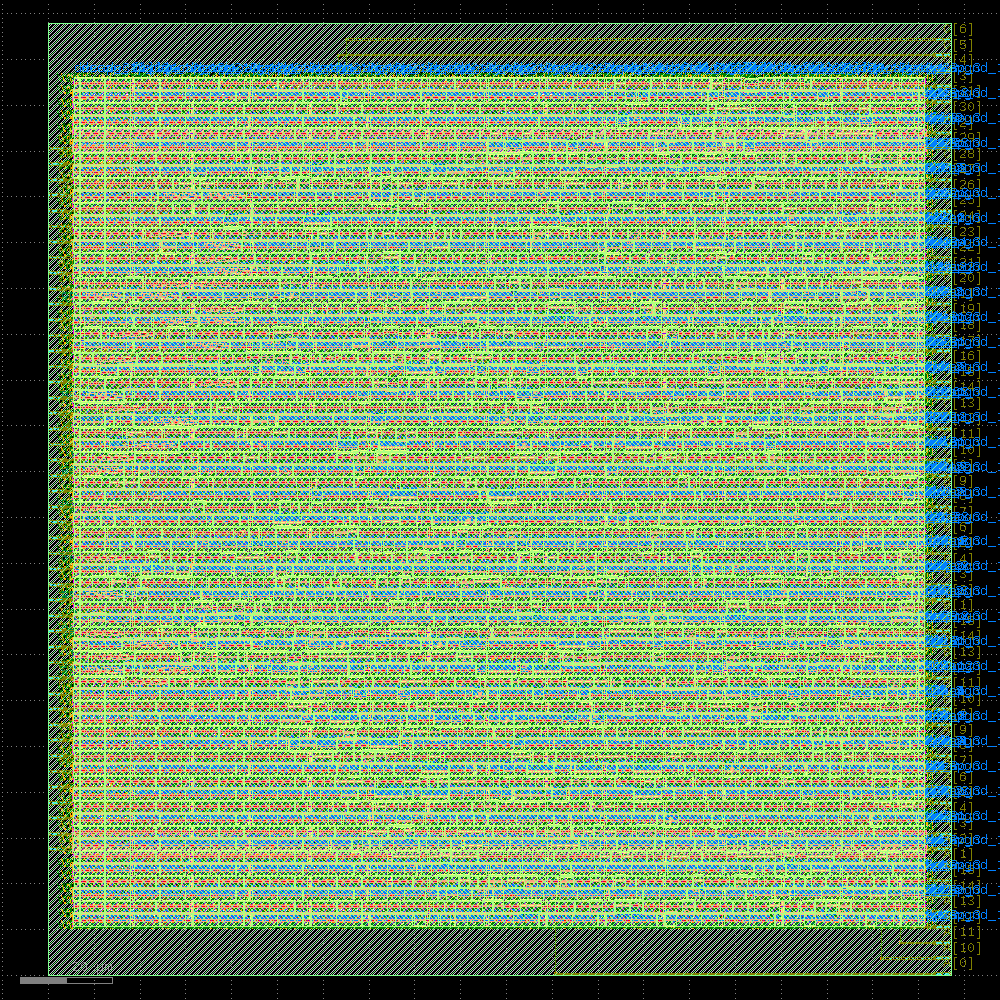

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[10:04:20] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=233630;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=885019;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:04:20] VERBOSE  Logging subprocess to ]8;id=753128;file:///tmp/openlane_klayout_tmp_8ss3ekck/klayout-render.log\..]8;;\]8;id=216418;file:///tmp/openlane_klayout_tmp_8ss3ekck/klayout-render.log\/tmp/openlane_klayout_tmp_8ss3ekck/]8;;\]8;id=888666;file:///tmp/openlane_klayout_tmp_8ss3ekck/klayout-render.log\klayout-render.log]8;;\…     ]8;id=353548;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=848814;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 0.82s
#### Views updated:
* GDSII Stream
* GDSII Stream (KLayout)
#### Preview:
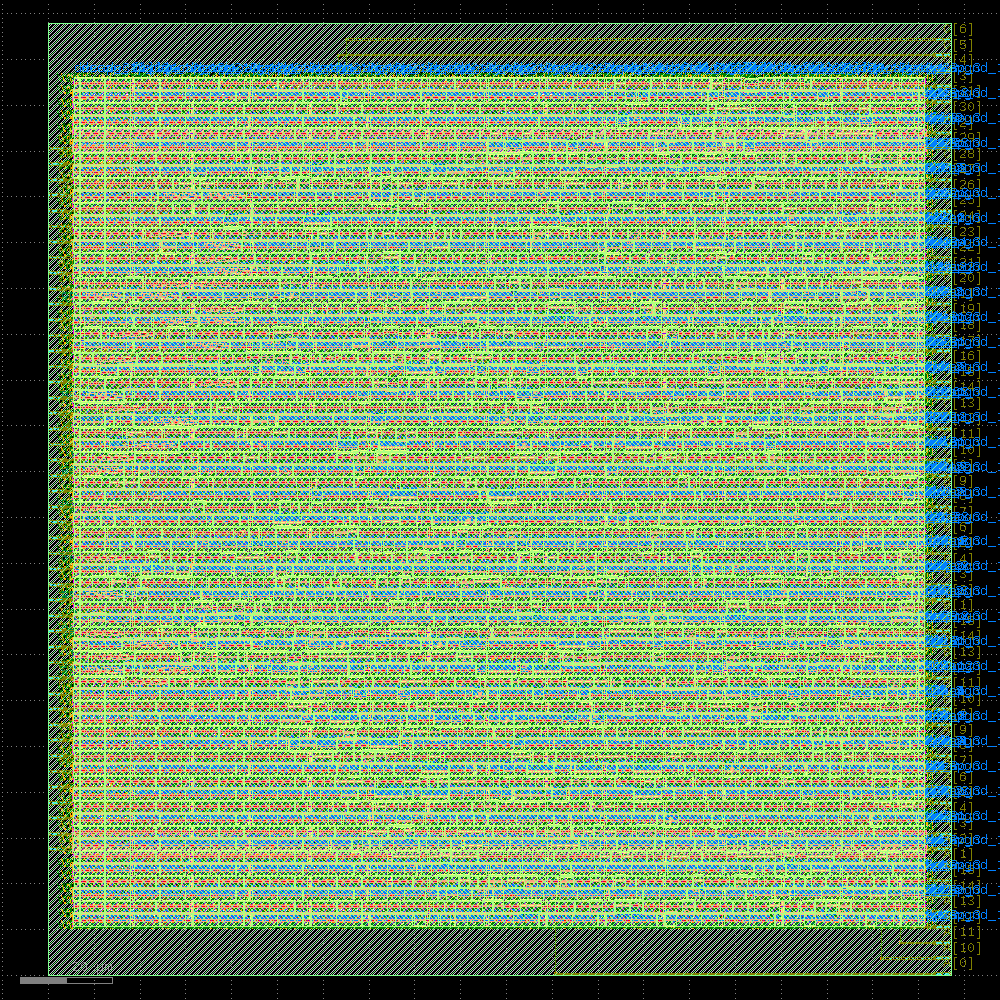

In [51]:
# GDSII Stream-out
print("Generating GDSII...")
run_step("KLayout.StreamOut")

In [52]:
# DRC
print("Running DRC...")
run_step("Magic.DRC", show=False)

# LVS
print("Running LVS...")
run_step("Magic.SpiceExtraction", show=False)
run_step("Netgen.LVS", show=False)

Running DRC...


─────────────────────────────────────────────── Design Rule Checks ────────────────────────────────────────────────

[10:04:22] VERBOSE  Running 'Magic.DRC'…                                                               ]8;id=666194;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=990873;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:04:22] VERBOSE  Logging subprocess to ]8;id=448740;file:///content/openlane_run/32-magic-drc/magic-drc.log\openlane_run/]8;;\]8;id=965125;file:///content/openlane_run/32-magic-drc/magic-drc.log\32]8;;\]8;id=448740;file:///content/openlane_run/32-magic-drc/magic-drc.log\-magic-drc/magic-drc.log]8;;\…                     ]8;id=685607;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=821918;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

/nix/store/306znyj77fv49kwnkpxmb0j2znqpa8bj-bash-5.2p26/bin/bash: warning: setlocale: LC_ALL: cannot change locale 
(en_US.UTF-8)

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

Warning: Calma reading is not undoable!  I hope that's OK.

Library written using GDS-II Release 6.0

Library name: LIB

Reading "VIA_M1M2_PR_MR".

Reading "VIA_M3M4_PR".

Reading "VIA_M1M2_PR".

Reading "VIA_L1M1_PR_MR".

Reading "VIA_M2M3_PR".

Reading "VIA_via2_3_1600_480_1_5_320_320".

Reading "VIA_via3_4_1600_480_1_4_400_400".

Reading "VIA_via4_5_1600_480_1_4_400_400".

Reading "VIA_via5_6_1600_1600_1_1_1600_1600".

Reading "sky130_fd_sc_hd__clkinv_2".

Reading "sky130_fd_sc_hd__bufinv_16".

Reading "sky130_fd_sc_hd__inv_4".

Reading "sky130_fd_sc_hd__clkbuf_16".

Reading "sky130_fd_sc_hd__dfrtp_2".

Reading "sky130_fd_sc_hd__a31oi_2".

Reading "sky130_fd_sc_hd__o32a_2".

Reading "sky130_fd_sc_hd__and4b_2".

Reading "sky130_fd_sc_hd__a2111o_2".

Reading "sky130_fd_sc_hd__o311ai_2".

Reading "sky130_fd_sc_hd__or4_2".

Reading "sky130_fd_sc_hd__a311oi_2".

Reading "sky130_fd_sc_hd__nor3b_2".

Reading "sky130_fd_sc_hd__or4b_2".

Reading "sky130_fd_sc_hd__a41o_2".

Reading "sky130_fd_sc_hd__a311o_2".

Reading "sky130_fd_sc_hd__o2111ai_2".

Reading "sky130_fd_sc_hd__nand3b_2".

Reading "sky130_fd_sc_hd__a221o_2".

Reading "sky130_fd_sc_hd__o211a_2".

Reading "sky130_fd_sc_hd__a211oi_2".

Reading "sky130_fd_sc_hd__o211ai_2".

Reading "sky130_fd_sc_hd__nor3_2".

Reading "sky130_fd_sc_hd__a211o_2".

Reading "sky130_fd_sc_hd__o221a_2".

Reading "sky130_fd_sc_hd__o21ba_2".

Reading "sky130_fd_sc_hd__nand2b_2".

Reading "sky130_fd_sc_hd__a21bo_2".

Reading "sky130_fd_sc_hd__o31a_2".

Reading "sky130_fd_sc_hd__o31ai_2".

Reading "sky130_fd_sc_hd__o311a_2".

Reading "sky130_fd_sc_hd__or3_2".

Reading "sky130_fd_sc_hd__o21ai_2".

Reading "sky130_fd_sc_hd__a31o_2".

Reading "sky130_fd_sc_hd__and2_2".

Reading "sky130_fd_sc_hd__and2b_2".

Reading "sky130_fd_sc_hd__xor2_2".

Reading "sky130_fd_sc_hd__mux2_1".

Reading "sky130_fd_sc_hd__o21a_2".

Reading "sky130_fd_sc_hd__o21bai_2".

Reading "sky130_fd_sc_hd__a21oi_2".

Reading "sky130_fd_sc_hd__o2111a_2".

Reading "sky130_fd_sc_hd__nand4_2".

Reading "sky130_fd_sc_hd__a22oi_2".

Reading "sky130_fd_sc_hd__nor2_2".

Reading "sky130_fd_sc_hd__a21boi_2".

Reading "sky130_fd_sc_hd__or3b_2".

Reading "sky130_fd_sc_hd__a32o_2".

Reading "sky130_fd_sc_hd__and3_2".

Reading "sky130_fd_sc_hd__or4bb_2".

Reading "sky130_fd_sc_hd__a2bb2o_2".

Reading "sky130_fd_sc_hd__a21o_2".

Reading "sky130_fd_sc_hd__nand3_2".

Reading "sky130_fd_sc_hd__or2_2".

Reading "sky130_fd_sc_hd__a22o_2".

Reading "sky130_fd_sc_hd__and4_2".

Reading "sky130_fd_sc_hd__nor4b_2".

Reading "sky130_fd_sc_hd__and3b_2".

Reading "sky130_fd_sc_hd__xnor2_2".

Reading "sky130_fd_sc_hd__nand2_2".

Reading "sky130_fd_sc_hd__inv_2".

Reading "sky130_fd_sc_hd__tapvpwrvgnd_1".

Reading "sky130_fd_sc_hd__decap_6".

Reading "sky130_fd_sc_hd__fill_2".

Reading "sky130_fd_sc_hd__decap_4".

Reading "sky130_fd_sc_hd__fill_1".

Reading "sky130_fd_sc_hd__decap_8".

Reading "sky130_ef_sc_hd__decap_12".

Reading "sky130_fd_sc_hd__decap_3".

Reading "tapeout_vedic_mac_16".

5000 uses

10000 uses

15000 uses

[INFO] Loading tapeout_vedic_mac_16

DRC style is now "drc(full)"

Loading DRC CIF style.

No errors found.

[INFO] COUNT: 0

[INFO] Should be divided by 3 or 4

[INFO] DRC Checking DONE (/content/openlane_run/32-magic-drc/reports/drc_violations.magic.rpt)

[INFO] Saving mag view with DRC errors (/content/openlane_run/32-magic-drc/views/tapeout_vedic_mac_16.drc.mag)

[INFO] Saved

Running LVS...


───────────────────────────────────────────── SPICE Model Extraction ──────────────────────────────────────────────

[10:04:32] VERBOSE  Running 'Magic.SpiceExtraction'…                                                   ]8;id=96699;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=649955;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:04:32] VERBOSE  Logging subprocess to                                                              ]8;id=276747;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=391027;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=569608;file:///content/openlane_run/33-magic-spiceextraction/magic-spiceextraction.log\openlane_run/]8;;\]8;id=267772;file:///content/openlane_run/33-magic-spiceextraction/magic-spiceextraction.log\33]8;;\]8;id=569608;file:///content/openlane_run/33-magic-spiceextraction/magic-spiceextraction.log\-magic-spiceextraction/magic-spiceextraction.log]8;;\…                               

/nix/store/306znyj77fv49kwnkpxmb0j2znqpa8bj-bash-5.2p26/bin/bash: warning: setlocale: LC_ALL: cannot change locale 
(en_US.UTF-8)

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef.

This action cannot be undone.

LEF read, Line 78 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 79 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 112 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 114 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 115 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 121 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 122 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 123 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 156 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 164 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 165 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 167 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 168 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 169 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 206 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 207 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 209 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 210 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 211 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 248 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 249 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 251 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 252 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 253 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 290 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 291 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read: Processed 797 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 278 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 56535 lines.

> def read /content/openlane_run/28-openroad-fillinsertion/tapeout_vedic_mac_16.def -noblockage -labels

Reading DEF data from file /content/openlane_run/28-openroad-fillinsertion/tapeout_vedic_mac_16.def.

This action cannot be undone.

Processed 4 vias total.

Processed 4652 subcell instances total.

Processed 109 pins total.

Processed 2 special nets total.

Processed 1905 nets total.

DEF read: Processed 32566 lines.

Moving label "B[14]" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "C[15]" from metal2 to via2 in cell tapeout_vedic_mac_16.

Moving label "C[7]" from metal2 to via2 in cell tapeout_vedic_mac_16.

Moving label "Z[10]" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_0051_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_0321_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_0355_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_0366_" from metal2 to via2 in cell tapeout_vedic_mac_16.

Moving label "_0470_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_0526_" from metal1 to viali in cell tapeout_vedic_mac_16.

Moving label "_0761_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_0843_" from metal2 to via2 in cell tapeout_vedic_mac_16.

Moving label "_0920_" from metal2 to via2 in cell tapeout_vedic_mac_16.

Moving label "_1062_" from metal2 to via1 in cell tapeout_vedic_mac_16.

Moving label "_1063_" from metal1 to viali in cell tapeout_vedic_mac_16.

Moving label "_1068_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_1258_" from metal2 to via2 in cell tapeout_vedic_mac_16.

Moving label "_1304_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_1346_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_1515_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_1527_" from metal2 to via1 in cell tapeout_vedic_mac_16.

Moving label "_1671_" from metal1 to via1 in cell tapeout_vedic_mac_16.

Moving label "_1735_" from metal1 to viali in cell tapeout_vedic_mac_16.

Moving label "_1751_" from metal2 to via1 in cell tapeout_vedic_mac_16.

Processing tapeout_vedic_mac_16

Extracting sky130_ef_sc_hd__decap_12 into sky130_ef_sc_hd__decap_12.ext:

Extracting sky130_fd_sc_hd__decap_3 into sky130_fd_sc_hd__decap_3.ext:

Extracting sky130_fd_sc_hd__fill_1 into sky130_fd_sc_hd__fill_1.ext:

Extracting sky130_fd_sc_hd__tapvpwrvgnd_1 into sky130_fd_sc_hd__tapvpwrvgnd_1.ext:

Extracting sky130_fd_sc_hd__decap_4 into sky130_fd_sc_hd__decap_4.ext:

Extracting sky130_fd_sc_hd__decap_6 into sky130_fd_sc_hd__decap_6.ext:

Extracting sky130_fd_sc_hd__decap_8 into sky130_fd_sc_hd__decap_8.ext:

Extracting sky130_fd_sc_hd__nand2_2 into sky130_fd_sc_hd__nand2_2.ext:

Extracting sky130_fd_sc_hd__nor2_2 into sky130_fd_sc_hd__nor2_2.ext:

Extracting sky130_fd_sc_hd__fill_2 into sky130_fd_sc_hd__fill_2.ext:

Extracting sky130_fd_sc_hd__xnor2_2 into sky130_fd_sc_hd__xnor2_2.ext:

Extracting sky130_fd_sc_hd__and2_2 into sky130_fd_sc_hd__and2_2.ext:

Extracting sky130_fd_sc_hd__or2_2 into sky130_fd_sc_hd__or2_2.ext:

Extracting sky130_fd_sc_hd__a22oi_2 into sky130_fd_sc_hd__a22oi_2.ext:

Extracting sky130_fd_sc_hd__a22o_2 into sky130_fd_sc_hd__a22o_2.ext:

Extracting sky130_fd_sc_hd__and3_2 into sky130_fd_sc_hd__and3_2.ext:

Extracting sky130_fd_sc_hd__a21oi_2 into sky130_fd_sc_hd__a21oi_2.ext:

Extracting sky130_fd_sc_hd__a21o_2 into sky130_fd_sc_hd__a21o_2.ext:

Extracting sky130_fd_sc_hd__nand3_2 into sky130_fd_sc_hd__nand3_2.ext:

Extracting sky130_fd_sc_hd__a31o_2 into sky130_fd_sc_hd__a31o_2.ext:

Extracting sky130_fd_sc_hd__nand2b_2 into sky130_fd_sc_hd__nand2b_2.ext:

Extracting sky130_fd_sc_hd__o21ai_2 into sky130_fd_sc_hd__o21ai_2.ext:

Extracting sky130_fd_sc_hd__a21bo_2 into sky130_fd_sc_hd__a21bo_2.ext:

Extracting sky130_fd_sc_hd__o2111a_2 into sky130_fd_sc_hd__o2111a_2.ext:

Extracting sky130_fd_sc_hd__nand4_2 into sky130_fd_sc_hd__nand4_2.ext:

Extracting sky130_fd_sc_hd__inv_2 into sky130_fd_sc_hd__inv_2.ext:

Extracting sky130_fd_sc_hd__o21a_2 into sky130_fd_sc_hd__o21a_2.ext:

Extracting sky130_fd_sc_hd__and4_2 into sky130_fd_sc_hd__and4_2.ext:

Extracting sky130_fd_sc_hd__a32o_2 into sky130_fd_sc_hd__a32o_2.ext:

Extracting sky130_fd_sc_hd__nor3_2 into sky130_fd_sc_hd__nor3_2.ext:

Extracting sky130_fd_sc_hd__or3b_2 into sky130_fd_sc_hd__or3b_2.ext:

Extracting sky130_fd_sc_hd__or3_2 into sky130_fd_sc_hd__or3_2.ext:

Extracting sky130_fd_sc_hd__o311a_2 into sky130_fd_sc_hd__o311a_2.ext:

Extracting sky130_fd_sc_hd__o21bai_2 into sky130_fd_sc_hd__o21bai_2.ext:

Extracting sky130_fd_sc_hd__xor2_2 into sky130_fd_sc_hd__xor2_2.ext:

Extracting sky130_fd_sc_hd__o221a_2 into sky130_fd_sc_hd__o221a_2.ext:

Extracting sky130_fd_sc_hd__and2b_2 into sky130_fd_sc_hd__and2b_2.ext:

Extracting sky130_fd_sc_hd__o21ba_2 into sky130_fd_sc_hd__o21ba_2.ext:

Extracting sky130_fd_sc_hd__a211oi_2 into sky130_fd_sc_hd__a211oi_2.ext:

Extracting sky130_fd_sc_hd__a21boi_2 into sky130_fd_sc_hd__a21boi_2.ext:

Extracting sky130_fd_sc_hd__o211a_2 into sky130_fd_sc_hd__o211a_2.ext:

Extracting sky130_fd_sc_hd__o31a_2 into sky130_fd_sc_hd__o31a_2.ext:

Extracting sky130_fd_sc_hd__o2111ai_2 into sky130_fd_sc_hd__o2111ai_2.ext:

Extracting sky130_fd_sc_hd__o211ai_2 into sky130_fd_sc_hd__o211ai_2.ext:

Extracting sky130_fd_sc_hd__a311o_2 into sky130_fd_sc_hd__a311o_2.ext:

Extracting sky130_fd_sc_hd__dfrtp_2 into sky130_fd_sc_hd__dfrtp_2.ext:

Extracting sky130_fd_sc_hd__a2bb2o_2 into sky130_fd_sc_hd__a2bb2o_2.ext:

Extracting sky130_fd_sc_hd__or4bb_2 into sky130_fd_sc_hd__or4bb_2.ext:

Extracting sky130_fd_sc_hd__and3b_2 into sky130_fd_sc_hd__and3b_2.ext:

Extracting sky130_fd_sc_hd__a211o_2 into sky130_fd_sc_hd__a211o_2.ext:

Extracting sky130_fd_sc_hd__mux2_1 into sky130_fd_sc_hd__mux2_1.ext:

Extracting sky130_fd_sc_hd__clkbuf_16 into sky130_fd_sc_hd__clkbuf_16.ext:

Extracting sky130_fd_sc_hd__bufinv_16 into sky130_fd_sc_hd__bufinv_16.ext:

Extracting sky130_fd_sc_hd__o31ai_2 into sky130_fd_sc_hd__o31ai_2.ext:

Extracting sky130_fd_sc_hd__a221o_2 into sky130_fd_sc_hd__a221o_2.ext:

Extracting sky130_fd_sc_hd__a41o_2 into sky130_fd_sc_hd__a41o_2.ext:

Extracting sky130_fd_sc_hd__a311oi_2 into sky130_fd_sc_hd__a311oi_2.ext:

Extracting sky130_fd_sc_hd__inv_4 into sky130_fd_sc_hd__inv_4.ext:

Extracting sky130_fd_sc_hd__nor4b_2 into sky130_fd_sc_hd__nor4b_2.ext:

Extracting sky130_fd_sc_hd__nand3b_2 into sky130_fd_sc_hd__nand3b_2.ext:

Extracting sky130_fd_sc_hd__or4b_2 into sky130_fd_sc_hd__or4b_2.ext:

Extracting sky130_fd_sc_hd__clkinv_2 into sky130_fd_sc_hd__clkinv_2.ext:

Extracting sky130_fd_sc_hd__and4b_2 into sky130_fd_sc_hd__and4b_2.ext:

Extracting sky130_fd_sc_hd__nor3b_2 into sky130_fd_sc_hd__nor3b_2.ext:

Extracting sky130_fd_sc_hd__or4_2 into sky130_fd_sc_hd__or4_2.ext:

Extracting sky130_fd_sc_hd__a2111o_2 into sky130_fd_sc_hd__a2111o_2.ext:

Extracting sky130_fd_sc_hd__o311ai_2 into sky130_fd_sc_hd__o311ai_2.ext:

Extracting sky130_fd_sc_hd__o32a_2 into sky130_fd_sc_hd__o32a_2.ext:

Extracting sky130_fd_sc_hd__a31oi_2 into sky130_fd_sc_hd__a31oi_2.ext:

Extracting tapeout_vedic_mac_16 into tapeout_vedic_mac_16.ext:

exttospice finished.

Using technology "sky130A", version 1.0.466-0-gbdc9412

─────────────────────────────────────────────────── Netgen LVS ────────────────────────────────────────────────────

[10:04:37] VERBOSE  Running 'Netgen.LVS'…                                                              ]8;id=173449;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=633155;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[10:04:37] VERBOSE  Logging subprocess to ]8;id=392429;file:///content/openlane_run/34-netgen-lvs/netgen-lvs.log\openlane_run/]8;;\]8;id=541582;file:///content/openlane_run/34-netgen-lvs/netgen-lvs.log\34]8;;\]8;id=392429;file:///content/openlane_run/34-netgen-lvs/netgen-lvs.log\-netgen-lvs/netgen-lvs.log]8;;\…                   ]8;id=772153;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=203717;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

/nix/store/306znyj77fv49kwnkpxmb0j2znqpa8bj-bash-5.2p26/bin/bash: warning: setlocale: LC_ALL: cannot change locale 
(en_US.UTF-8)

Netgen 1.5.270 compiled on Sun Jun  2 19:00:27 UTC 2024

Warning: netgen command 'format' use fully-qualified name '::netgen::format'

Warning: netgen command 'global' use fully-qualified name '::netgen::global'

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Reading SPICE netlist file                                                                                         
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice'...

Call to undefined subcircuit sky130_fd_pr__pfet_01v8_hvt

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_pr__nfet_01v8

Creating placeholder cell definition.

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice'...

Call to undefined subcircuit sky130_fd_sc_hd__nand2_2

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_sc_hd__nor2_2

Creating placeholder cell definition.

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Note:  Implicit pin Y in instance clkload0 of sky130_fd_sc_hd__inv_4 in cell tapeout_vedic_mac_16

Note:  Implicit pin Y in instance clkload1 of sky130_fd_sc_hd__bufinv_16 in cell tapeout_vedic_mac_16

Note:  Implicit pin Y in instance clkload2 of sky130_fd_sc_hd__clkinv_2 in cell tapeout_vedic_mac_16

Treating empty subcircuits as black-box cells

Generating JSON file result

Reading setup file /content/openlane_ipynb/openlane/scripts/netgen/setup.tcl

Model sky130_fd_pr__res_generic_po pin end_a == end_b

No property mult found for device sky130_fd_pr__res_generic_po

Model sky130_fd_pr__nfet_01v8 pin 1 == 3

No property mult found for device sky130_fd_pr__nfet_01v8

No property sa found for device sky130_fd_pr__nfet_01v8

No property sb found for device sky130_fd_pr__nfet_01v8

No property sd found for device sky130_fd_pr__nfet_01v8

No property nf found for device sky130_fd_pr__nfet_01v8

No property nrd found for device sky130_fd_pr__nfet_01v8

No property nrs found for device sky130_fd_pr__nfet_01v8

No property area found for device sky130_fd_pr__nfet_01v8

No property perim found for device sky130_fd_pr__nfet_01v8

No property topography found for device sky130_fd_pr__nfet_01v8

Model sky130_fd_pr__pfet_01v8_hvt pin 1 == 3

No property mult found for device sky130_fd_pr__pfet_01v8_hvt

No property sa found for device sky130_fd_pr__pfet_01v8_hvt

No property sb found for device sky130_fd_pr__pfet_01v8_hvt

No property sd found for device sky130_fd_pr__pfet_01v8_hvt

No property nf found for device sky130_fd_pr__pfet_01v8_hvt

No property nrd found for device sky130_fd_pr__pfet_01v8_hvt

No property nrs found for device sky130_fd_pr__pfet_01v8_hvt

No property area found for device sky130_fd_pr__pfet_01v8_hvt

No property perim found for device sky130_fd_pr__pfet_01v8_hvt

No property topography found for device sky130_fd_pr__pfet_01v8_hvt

No property value found for device sky130_fd_pr__diode_pw2nd_05v5

No property mult found for device sky130_fd_pr__diode_pw2nd_05v5

No property perim found for device sky130_fd_pr__diode_pw2nd_05v5

Comparison output logged to file /content/openlane_run/34-netgen-lvs/reports/lvs.netgen.rpt

Logging to file "/content/openlane_run/34-netgen-lvs/reports/lvs.netgen.rpt" enabled

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__or2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a22o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__and2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__nand2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_ef_sc_hd__decap_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a32o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nand2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nand3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o21ba_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_3 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 30 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  15

Class: sky130_fd_pr__pfet_01v8_hvt instances:  15

Circuit contains 21 nets.

Circuit sky130_fd_sc_hd__dfrtp_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xnor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 4 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   2

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o31ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o2111a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__and4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__and3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__o21ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2111ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__and2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__mux2_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a31o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nor3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21bo_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nand4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__or3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__and3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__or3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a311o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o221a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a2bb2o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_4'

Circuit sky130_fd_sc_hd__inv_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_4'

Circuit sky130_fd_sc_hd__inv_4 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o211a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a311oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__bufinv_16'

Circuit sky130_fd_sc_hd__bufinv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__bufinv_16'

Circuit sky130_fd_sc_hd__bufinv_16 contains 50 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  25

Class: sky130_fd_pr__pfet_01v8_hvt instances:  25

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__bufinv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a22oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_2'

Circuit sky130_fd_sc_hd__clkinv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_2'

Circuit sky130_fd_sc_hd__clkinv_2 contains 5 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   3

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o31a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21bai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 40 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  20

Class: sky130_fd_pr__pfet_01v8_hvt instances:  20

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__and4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21boi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__or4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nand3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o311a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a31oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a211oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a211o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__or4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a2111o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o32a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nor3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a41o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__or4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o311ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o211ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor4b_2'

Circuit sky130_fd_sc_hd__nor4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor4b_2'

Circuit sky130_fd_sc_hd__nor4b_2 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__nor4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a221o_2 contains no devices.

Contents of circuit 1:  Circuit: 'tapeout_vedic_mac_16'

Circuit tapeout_vedic_mac_16 contains 4652 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   1

Class: sky130_fd_sc_hd__o2111ai_2 instances:   4

Class: sky130_fd_sc_hd__a41o_2 instances:   1

Class: sky130_fd_sc_hd__a31o_2 instances:  36

Class: sky130_fd_sc_hd__a21o_2 instances:  57

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__o31ai_2 instances:   3

Class: sky130_fd_sc_hd__or4_2 instances:   1

Class: sky130_fd_sc_hd__a31oi_2 instances:   1

Class: sky130_fd_sc_hd__nand4_2 instances:  38

Class: sky130_fd_sc_hd__a2bb2o_2 instances:   4

Class: sky130_fd_sc_hd__and3b_2 instances:   2

Class: sky130_fd_sc_hd__xor2_2 instances: 107

Class: sky130_ef_sc_hd__decap_12 instances: 578

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:  30

Class: sky130_fd_sc_hd__inv_2 instances:  29

Class: sky130_fd_sc_hd__inv_4 instances:   1

Class: sky130_fd_sc_hd__or3_2 instances:  25

Class: sky130_fd_sc_hd__nand3_2 instances:  25

Class: sky130_fd_sc_hd__o21ba_2 instances:  11

Class: sky130_fd_sc_hd__and2b_2 instances:  38

Class: sky130_fd_sc_hd__a21boi_2 instances:   6

Class: sky130_fd_sc_hd__a21bo_2 instances:  15

Class: sky130_fd_sc_hd__clkinv_2 instances:   1

Class: sky130_fd_sc_hd__and3_2 instances: 100

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 373

Class: sky130_fd_sc_hd__decap_4 instances: 258

Class: sky130_fd_sc_hd__decap_6 instances: 198

Class: sky130_fd_sc_hd__decap_8 instances: 225

Class: sky130_fd_sc_hd__or2_2 instances: 158

Class: sky130_fd_sc_hd__nand2_2 instances: 266

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   3

Class: sky130_fd_sc_hd__mux2_1 instances:   2

Class: sky130_fd_sc_hd__a211oi_2 instances:   3

Class: sky130_fd_sc_hd__and2_2 instances: 112

Class: sky130_fd_sc_hd__or4b_2 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   1

Class: sky130_fd_sc_hd__xnor2_2 instances: 162

Class: sky130_fd_sc_hd__nor3b_2 instances:   1

Class: sky130_fd_sc_hd__o221a_2 instances:   5

Class: sky130_fd_sc_hd__o21bai_2 instances:   8

Class: sky130_fd_sc_hd__o211a_2 instances:   8

Class: sky130_fd_sc_hd__nand2b_2 instances:  40

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   1

Class: sky130_fd_sc_hd__a211o_2 instances:   4

Class: sky130_fd_sc_hd__o2111a_2 instances:   4

Class: sky130_fd_sc_hd__or3b_2 instances:  20

Class: sky130_fd_sc_hd__or4bb_2 instances:   1

Class: sky130_fd_sc_hd__nor3_2 instances:  17

Class: sky130_fd_sc_hd__a32o_2 instances:  15

Class: sky130_fd_sc_hd__a22o_2 instances:  71

Class: sky130_fd_sc_hd__o31a_2 instances:   4

Class: sky130_fd_sc_hd__o21a_2 instances:  51

Class: sky130_fd_sc_hd__o311a_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  11

Class: sky130_fd_sc_hd__and4b_2 instances:   1

Class: sky130_fd_sc_hd__o21ai_2 instances:  48

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 490

Class: sky130_fd_sc_hd__a21oi_2 instances:  73

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances: 472

Class: sky130_fd_sc_hd__fill_2 instances: 225

Class: sky130_fd_sc_hd__o211ai_2 instances:   2

Class: sky130_fd_sc_hd__nor2_2 instances: 156

Circuit contains 1910 nets.

Contents of circuit 2:  Circuit: 'tapeout_vedic_mac_16'

Circuit tapeout_vedic_mac_16 contains 4652 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   1

Class: sky130_fd_sc_hd__o2111ai_2 instances:   4

Class: sky130_fd_sc_hd__a41o_2 instances:   1

Class: sky130_fd_sc_hd__a31o_2 instances:  36

Class: sky130_fd_sc_hd__a21o_2 instances:  57

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__o31ai_2 instances:   3

Class: sky130_fd_sc_hd__or4_2 instances:   1

Class: sky130_fd_sc_hd__a31oi_2 instances:   1

Class: sky130_fd_sc_hd__nand4_2 instances:  38

Class: sky130_fd_sc_hd__a2bb2o_2 instances:   4

Class: sky130_fd_sc_hd__and3b_2 instances:   2

Class: sky130_fd_sc_hd__xor2_2 instances: 107

Class: sky130_ef_sc_hd__decap_12 instances: 578

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:  30

Class: sky130_fd_sc_hd__inv_2 instances:  29

Class: sky130_fd_sc_hd__inv_4 instances:   1

Class: sky130_fd_sc_hd__or3_2 instances:  25

Class: sky130_fd_sc_hd__nand3_2 instances:  25

Class: sky130_fd_sc_hd__o21ba_2 instances:  11

Class: sky130_fd_sc_hd__and2b_2 instances:  38

Class: sky130_fd_sc_hd__a21boi_2 instances:   6

Class: sky130_fd_sc_hd__a21bo_2 instances:  15

Class: sky130_fd_sc_hd__clkinv_2 instances:   1

Class: sky130_fd_sc_hd__and3_2 instances: 100

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 373

Class: sky130_fd_sc_hd__decap_4 instances: 258

Class: sky130_fd_sc_hd__decap_6 instances: 198

Class: sky130_fd_sc_hd__decap_8 instances: 225

Class: sky130_fd_sc_hd__or2_2 instances: 158

Class: sky130_fd_sc_hd__nand2_2 instances: 266

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   3

Class: sky130_fd_sc_hd__mux2_1 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances: 112

Class: sky130_fd_sc_hd__a211oi_2 instances:   3

Class: sky130_fd_sc_hd__or4b_2 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   1

Class: sky130_fd_sc_hd__xnor2_2 instances: 162

Class: sky130_fd_sc_hd__nor3b_2 instances:   1

Class: sky130_fd_sc_hd__o221a_2 instances:   5

Class: sky130_fd_sc_hd__o21bai_2 instances:   8

Class: sky130_fd_sc_hd__o211a_2 instances:   8

Class: sky130_fd_sc_hd__nand2b_2 instances:  40

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   1

Class: sky130_fd_sc_hd__a211o_2 instances:   4

Class: sky130_fd_sc_hd__o2111a_2 instances:   4

Class: sky130_fd_sc_hd__or3b_2 instances:  20

Class: sky130_fd_sc_hd__or4bb_2 instances:   1

Class: sky130_fd_sc_hd__nor3_2 instances:  17

Class: sky130_fd_sc_hd__a32o_2 instances:  15

Class: sky130_fd_sc_hd__a22o_2 instances:  71

Class: sky130_fd_sc_hd__o31a_2 instances:   4

Class: sky130_fd_sc_hd__o21a_2 instances:  51

Class: sky130_fd_sc_hd__o311a_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  11

Class: sky130_fd_sc_hd__and4b_2 instances:   1

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 490

Class: sky130_fd_sc_hd__o21ai_2 instances:  48

Class: sky130_fd_sc_hd__a21oi_2 instances:  73

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances: 472

Class: sky130_fd_sc_hd__fill_2 instances: 225

Class: sky130_fd_sc_hd__o211ai_2 instances:   2

Class: sky130_fd_sc_hd__nor2_2 instances: 156

Circuit contains 1910 nets.

Circuit was modified by parallel/series device merging.

New circuit summary:

Contents of circuit 1:  Circuit: 'tapeout_vedic_mac_16'

Circuit tapeout_vedic_mac_16 contains 1841 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   1

Class: sky130_fd_sc_hd__o2111ai_2 instances:   4

Class: sky130_fd_sc_hd__a41o_2 instances:   1

Class: sky130_fd_sc_hd__a31o_2 instances:  36

Class: sky130_fd_sc_hd__a21o_2 instances:  57

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__o31ai_2 instances:   3

Class: sky130_fd_sc_hd__or4_2 instances:   1

Class: sky130_fd_sc_hd__a31oi_2 instances:   1

Class: sky130_fd_sc_hd__nand4_2 instances:  38

Class: sky130_fd_sc_hd__a2bb2o_2 instances:   4

Class: sky130_fd_sc_hd__and3b_2 instances:   2

Class: sky130_fd_sc_hd__xor2_2 instances: 107

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:  30

Class: sky130_fd_sc_hd__inv_2 instances:  29

Class: sky130_fd_sc_hd__inv_4 instances:   1

Class: sky130_fd_sc_hd__or3_2 instances:  25

Class: sky130_fd_sc_hd__nand3_2 instances:  25

Class: sky130_fd_sc_hd__o21ba_2 instances:  11

Class: sky130_fd_sc_hd__and2b_2 instances:  38

Class: sky130_fd_sc_hd__a21boi_2 instances:   6

Class: sky130_fd_sc_hd__a21bo_2 instances:  15

Class: sky130_fd_sc_hd__clkinv_2 instances:   1

Class: sky130_fd_sc_hd__and3_2 instances: 100

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 158

Class: sky130_fd_sc_hd__nand2_2 instances: 266

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   3

Class: sky130_fd_sc_hd__mux2_1 instances:   2

Class: sky130_fd_sc_hd__a211oi_2 instances:   3

Class: sky130_fd_sc_hd__and2_2 instances: 112

Class: sky130_fd_sc_hd__or4b_2 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   1

Class: sky130_fd_sc_hd__xnor2_2 instances: 162

Class: sky130_fd_sc_hd__nor3b_2 instances:   1

Class: sky130_fd_sc_hd__o221a_2 instances:   5

Class: sky130_fd_sc_hd__o21bai_2 instances:   8

Class: sky130_fd_sc_hd__o211a_2 instances:   8

Class: sky130_fd_sc_hd__nand2b_2 instances:  40

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   1

Class: sky130_fd_sc_hd__a211o_2 instances:   4

Class: sky130_fd_sc_hd__o2111a_2 instances:   4

Class: sky130_fd_sc_hd__or3b_2 instances:  20

Class: sky130_fd_sc_hd__or4bb_2 instances:   1

Class: sky130_fd_sc_hd__nor3_2 instances:  17

Class: sky130_fd_sc_hd__a32o_2 instances:  15

Class: sky130_fd_sc_hd__a22o_2 instances:  71

Class: sky130_fd_sc_hd__o31a_2 instances:   4

Class: sky130_fd_sc_hd__o21a_2 instances:  51

Class: sky130_fd_sc_hd__o311a_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  11

Class: sky130_fd_sc_hd__and4b_2 instances:   1

Class: sky130_fd_sc_hd__o21ai_2 instances:  48

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__a21oi_2 instances:  73

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:   2

Class: sky130_fd_sc_hd__nor2_2 instances: 156

Circuit contains 1910 nets.

Contents of circuit 2:  Circuit: 'tapeout_vedic_mac_16'

Circuit tapeout_vedic_mac_16 contains 1841 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   1

Class: sky130_fd_sc_hd__o2111ai_2 instances:   4

Class: sky130_fd_sc_hd__a41o_2 instances:   1

Class: sky130_fd_sc_hd__a31o_2 instances:  36

Class: sky130_fd_sc_hd__a21o_2 instances:  57

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__o31ai_2 instances:   3

Class: sky130_fd_sc_hd__or4_2 instances:   1

Class: sky130_fd_sc_hd__a31oi_2 instances:   1

Class: sky130_fd_sc_hd__nand4_2 instances:  38

Class: sky130_fd_sc_hd__a2bb2o_2 instances:   4

Class: sky130_fd_sc_hd__and3b_2 instances:   2

Class: sky130_fd_sc_hd__xor2_2 instances: 107

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:  30

Class: sky130_fd_sc_hd__inv_2 instances:  29

Class: sky130_fd_sc_hd__inv_4 instances:   1

Class: sky130_fd_sc_hd__or3_2 instances:  25

Class: sky130_fd_sc_hd__nand3_2 instances:  25

Class: sky130_fd_sc_hd__o21ba_2 instances:  11

Class: sky130_fd_sc_hd__and2b_2 instances:  38

Class: sky130_fd_sc_hd__a21boi_2 instances:   6

Class: sky130_fd_sc_hd__a21bo_2 instances:  15

Class: sky130_fd_sc_hd__clkinv_2 instances:   1

Class: sky130_fd_sc_hd__and3_2 instances: 100

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 158

Class: sky130_fd_sc_hd__nand2_2 instances: 266

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   3

Class: sky130_fd_sc_hd__mux2_1 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances: 112

Class: sky130_fd_sc_hd__a211oi_2 instances:   3

Class: sky130_fd_sc_hd__or4b_2 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   1

Class: sky130_fd_sc_hd__xnor2_2 instances: 162

Class: sky130_fd_sc_hd__nor3b_2 instances:   1

Class: sky130_fd_sc_hd__o221a_2 instances:   5

Class: sky130_fd_sc_hd__o21bai_2 instances:   8

Class: sky130_fd_sc_hd__o211a_2 instances:   8

Class: sky130_fd_sc_hd__nand2b_2 instances:  40

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   1

Class: sky130_fd_sc_hd__a211o_2 instances:   4

Class: sky130_fd_sc_hd__o2111a_2 instances:   4

Class: sky130_fd_sc_hd__or3b_2 instances:  20

Class: sky130_fd_sc_hd__or4bb_2 instances:   1

Class: sky130_fd_sc_hd__nor3_2 instances:  17

Class: sky130_fd_sc_hd__a32o_2 instances:  15

Class: sky130_fd_sc_hd__a22o_2 instances:  71

Class: sky130_fd_sc_hd__o31a_2 instances:   4

Class: sky130_fd_sc_hd__o21a_2 instances:  51

Class: sky130_fd_sc_hd__o311a_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  11

Class: sky130_fd_sc_hd__and4b_2 instances:   1

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__o21ai_2 instances:  48

Class: sky130_fd_sc_hd__a21oi_2 instances:  73

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:   2

Class: sky130_fd_sc_hd__nor2_2 instances: 156

Circuit contains 1910 nets.

Circuit 1 contains 1841 devices, Circuit 2 contains 1841 devices.

Circuit 1 contains 1910 nets,    Circuit 2 contains 1910 nets.

Final result:

Circuits match uniquely.

.

Logging to file "/content/openlane_run/34-netgen-lvs/reports/lvs.netgen.rpt" disabled

LVS Done.

#### Time Elapsed: 4.07s


## 5. Conclusion

This notebook successfully completed:
- Functional simulation of the 16‑bit Vedic MAC.
- Full RTL‑to‑GDS flow using OpenLane 2 and Sky130 PDK.
- DRC/LVS verification.


The design is ready for tape‑out.

## 6. License

```
Copyright 2026 Kamalesh E

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

    http://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
```